# Tutorial for NIRCam coronagraphy reduction with spaceKLIP

In this notebook we will reduce the NIRCam coronagraphy data on HIP 65426 b 
from the JWST ERS program on Direct Observations of Exoplanetary Systems, program 1386. 



<div class="alert alert-block alert-success">
<b>Relation to other tutorials:</b> This notebook is intentionally very similar to the MIRI data reduction notebook.  Subsequent analyses steps will be carried out in the NIRCam post-pipeline analyses notebook. 
</div>

<div class="alert alert-block alert-info">
<b>NIRCam-specific information:</b> Steps and information specific to NIRCam are called out in blue.</div>

## Setup and imports

In [1]:
import os
import pdb
import sys
import glob

import numpy as np
import astropy.io.fits as fits

import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams.update({'font.size': 14})

import spaceKLIP

**WARNING**: LOCAL JWST PRD VERSION PRDOPSSOC-059 CANNOT BE CHECKED AGAINST ONLINE VERSION


[   webbpsf:INFO] NIRCam aperture name updated to NRCA1_FULL


2023-08-02 23:21:02,992 - stpipe - INFO - NIRCam aperture name updated to NRCA1_FULL


[    stpipe:INFO] NIRCam aperture name updated to NRCA1_FULL
[   webbpsf:INFO] NIRISS SIAF aperture name updated to NIS_CEN


2023-08-02 23:21:03,044 - stpipe - INFO - NIRISS SIAF aperture name updated to NIS_CEN


[    stpipe:INFO] NIRISS SIAF aperture name updated to NIS_CEN
[   webbpsf:INFO] MIRI SIAF aperture name updated to MIRIM_FULL


2023-08-02 23:21:03,320 - stpipe - INFO - MIRI SIAF aperture name updated to MIRIM_FULL


[    stpipe:INFO] MIRI SIAF aperture name updated to MIRIM_FULL


Note that currently the import of `webbpsf_ext` has a side effect of configuring extra verbose logging. We're not interested in that logging text, so let's quiet it. 

In [3]:
import webbpsf_ext
webbpsf_ext.setup_logging('WARN', verbose=False)

## Precursor: Download the data, if you don't already have it. 

If you already have a copy of this data, then you can adjust paths below. For this notebook, we assume you don't already have the data. So let's download it here. 


We can do this using the (jwst_mast_query)[https://github.com/spacetelescope/jwst_mast_query] package.  Consult that package's own documentation for more. 

We download all the uncalibrated raw data (`uncal.fits`), since we will use spaceKLIP to invoke the jwst pipeline with some customized options and extra steps optimized for coronagraphy. 

In [4]:
data_root = 'data_nircam_hd65426'

In [5]:
# make subdirectories to put these data in

if not os.path.isdir(data_root):
    
    os.makedirs(data_root)
    os.makedirs(os.path.join(data_root, 'uncal'))
    

    # invoke the download
    download_cmd = "jwst_download.py --propID 1386 -i nircam -l 700 --obsnums 1 2 3  "+\
                   "--outsubdir data_nircam_hd65426/uncal --skip_propID2outsubdir -f uncal"
    import subprocess
    subprocess.Popen(download_cmd, shell=True).wait()

# Level 1 reductions

### Index files into database for level 1

SpaceKLIP relies on a `Database` class to track observations, data files, and the relationships between them. 

We begin by creating a database, and reading files into it. 

In [6]:
input_dir = os.path.join(data_root, 'uncal')
output_dir = data_root  # subdirectories will automatically be created within this

In [14]:
# Initialize spaceKLIP database.
database = spaceKLIP.database.Database(output_dir=output_dir)

In [15]:
# Find FITS files and read them into the DB

fitsfiles = sorted(glob.glob(os.path.join(input_dir,"*_uncal.fits")))

database.read_jwst_s012_data(datapaths=fitsfiles)


[spaceKLIP.database:INFO] --> Identified 5 concatenation(s)
[spaceKLIP.database:INFO]   --> Concatenation 1: JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER      CWAVEL     ...      EFFINTTM       SUBARRAY  NUMDTHPT XOFFSET YOFFSET      PIXSCALE      BUNIT      ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ --------------- ... ----------------- ----------- -------- ------- ------- ------------------ ----- ------------------ --------
 SCI NRC_CORON   STAGE0     JWST HIP-65426   NIRCAM NRCALONG  F250M 2.5049391569476 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005    DN  110.2786614838192      nan
 SCI NRC_CORON   STAGE0     JWST HIP-65426   NIRCAM NRCALONG  F250M 2.5049391569476 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005    DN  120.3590367370958      nan
 REF NRC_CORON   STAGE0     JWST HIP-68245   NIRCA

TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER      CWAVEL     ...      EFFINTTM       SUBARRAY  NUMDTHPT XOFFSET YOFFSET      PIXSCALE      BUNIT      ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ --------------- ... ----------------- ----------- -------- ------- ------- ------------------ ----- ------------------ --------
 SCI NRC_CORON   STAGE0     JWST HIP-65426   NIRCAM NRCALONG  F444W 4.4393515120525 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005    DN  110.2786558985023      nan
 SCI NRC_CORON   STAGE0     JWST HIP-65426   NIRCAM NRCALONG  F444W 4.4393515120525 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005    DN  120.3590194808035      nan
 REF NRC_CORON   STAGE0     JWST HIP-68245   NIRCAM NRCALONG  F444W 4.4393515120525 ... 40.62352000000001 SUB320A335R        9     0.0     0.0 62.908505000000005    DN 110.00836165914811      nan
 REF NRC_CORON   STA

The above is a bit verbose and can be hard for a human to parse; let's ask the database to summarize what it contains: 

In [16]:
database.summarize()

NIRCAM_F250M_MASKA335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F300M_MASKA335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F356W_MASKA335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F410M_MASKA335R
	STAGE0: 11 files;	2 SCI, 9 REF
NIRCAM_F444W_MASKA335R
	STAGE0: 11 files;	2 SCI, 9 REF


### Run level 1 reductions

We use spaceKLIP to invoke the level 1 pipeline, with a handful of parameter customizations.

This will run the Detector1 pipeline for all input data, saving the output to a subdirectory named `stage1`.

In [20]:
spaceKLIP.coron1pipeline.run_obs(database=database,
                       steps={'saturation': {'n_pix_grow_sat': 1,
                                             'grow_diagonal': False},
                              'refpix': {'odd_even_columns': True,
                                         'odd_even_rows': True,
                                         'nlower': 4,
                                         'nupper': 4,
                                         'nleft': 4,
                                         'nright': 4,
                                         'nrow_off': 0,
                                         'ncol_off': 0},
                              'dark_current': {'skip': True},
                              'persistence': {'skip': True},
                              'jump': {'rejection_threshold': 4.,
                                       'three_group_rejection_threshold': 4.,
                                       'four_group_rejection_threshold': 4.,
                                       'maximum_cores': 'all'},
                              'ramp_fit': {'save_calibrated_ramp': False,
                                          'maximum_cores': 'all'}},
                       subdir='stage1')

[spaceKLIP.coron1pipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: skipping non-stage 0 file jw01386002001_03106_00001_nrcalong_rateints.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: skipping non-stage 0 file jw01386003001_03106_00001_nrcalong_rateints.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: skipping non-stage 0 file jw01386001001_03106_00001_nrcalong_rateints.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: skipping non-stage 0 file jw01386001001_03106_00002_nrcalong_rateints.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: skipping non-stage 0 file jw01386001001_03106_00003_nrcalong_rateints.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: skipping non-stage 0 file jw01386001001_03106_00004_nrcalong_rateints.fits
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: skipping non-stage 0 file jw01386001001_03106_00005_nrcalong_rate

2023-08-02 23:50:05,534 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:50:05,536 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:50:05,538 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:50:05,540 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:50:05,542 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:50:05,545 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:50:05,547 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:50:05,550 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:50:05,552 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:50:05,554 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:50:05,557 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:50:05,559 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:50:05,561 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:50:05,564 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:50:05,567 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:50:05,569 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:50:05,572 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:50:05,574 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:50:05,786 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_03108_00009_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_03108_00009_nrcalong_uncal.fits',).


2023-08-02 23:50:05,806 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:50:06,237 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03108_00009_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03108_00009_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:50:06,245 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:50:06,247 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:50:06,248 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:50:06,250 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:50:06,251 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:50:06,253 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:50:06,254 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:50:06,256 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:50:06,258 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:50:06,259 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:50:06,261 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:50:06,263 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:50:06,265 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:50:06,832 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:06,834 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:06,906 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:50:06,907 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:50:06,913 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:50:07,110 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:07,113 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:07,153 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:50:07,775 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:50:07,950 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:07,952 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:50:07,990 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:50:08,705 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:50:08,910 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:08,912 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:08,954 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=4, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=4, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:50:09,101 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:50:09,295 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:09,298 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:09,332 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:50:09,499 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:50:09,501 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:50:09,502 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:50:09,686 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:09,689 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:50:09,959 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:50:09,961 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:50:10,136 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:10,138 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:10,174 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:50:10,525 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:50:10,705 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:10,708 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:50:12,483 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong_trapsfilled.fits


2023-08-02 23:50:12,504 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:50:12,690 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:12,692 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:50:12,694 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:50:12,701 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:50:12,870 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:12,873 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:50:12,891 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:50:12,893 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:50:12,917 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:50:13,004 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.26546 sec


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
2023-08-02 23:50:14,402 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.510438


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.510438


2023-08-02 23:50:14,415 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:50:14,666 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(4, 4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:14,669 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:50:16,317 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:50:16,508 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:16,511 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:16,587 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:50:16,589 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:50:16,600 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:50:16,765 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00009_nrcalong_uncal.fits>,).


2023-08-02 23:50:16,767 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:16,848 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:50:16,850 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:50:16,860 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:50:17,061 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:50:17,180 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong_rate.fits


2023-08-02 23:50:17,181 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F356W_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386002001_03109_00001_nrcalong_uncal.fits


2023-08-02 23:50:17,203 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:50:17,206 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:50:17,208 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:50:17,209 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:50:17,211 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:50:17,213 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:50:17,216 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:50:17,218 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:50:17,221 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:50:17,223 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:50:17,225 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:50:17,227 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:50:17,229 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:50:17,233 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:50:17,237 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:50:17,241 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:50:17,244 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:50:17,247 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:50:17,460 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386002001_03109_00001_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386002001_03109_00001_nrcalong_uncal.fits',).


2023-08-02 23:50:17,479 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:50:17,990 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386002001_03109_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386002001_03109_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:50:17,997 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:50:17,998 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:50:18,000 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:50:18,001 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:50:18,003 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:50:18,005 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:50:18,007 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:50:18,008 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:50:18,009 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:50:18,011 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:50:18,013 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:50:18,015 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:50:18,016 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:50:18,567 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:18,569 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:18,651 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:50:18,653 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:50:18,659 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:50:18,820 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:18,822 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:18,851 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:50:19,532 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:50:19,764 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:19,767 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:50:19,801 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 10 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:50:20,479 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:50:20,702 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:20,705 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:20,746 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=15, nframes=8, groupgap=12
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=15, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:50:20,884 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:50:21,060 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:21,062 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:21,098 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:50:21,259 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:50:21,260 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:50:21,261 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:50:21,424 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:21,426 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:50:21,744 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:50:21,745 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:50:21,905 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:21,907 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:21,950 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:50:22,254 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:50:22,419 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:22,422 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:50:24,282 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong_trapsfilled.fits


2023-08-02 23:50:24,302 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:50:24,481 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:24,483 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:50:24,484 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:50:24,491 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:50:24,669 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:24,672 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:50:24,694 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:50:24,695 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:50:24,715 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:50:24,793 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.38596 sec


2023-08-02 23:50:26,338 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.644327


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.644327


2023-08-02 23:50:26,364 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:50:26,685 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:26,688 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:50:28,997 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:50:29,223 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:29,226 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:29,313 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:50:29,314 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:50:29,322 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:50:29,489 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386002001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:29,491 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:29,565 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:50:29,566 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:50:29,577 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:50:29,709 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:50:29,818 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong_rate.fits


2023-08-02 23:50:29,820 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386003001_03109_00001_nrcalong_uncal.fits


2023-08-02 23:50:29,840 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:50:29,842 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:50:29,844 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:50:29,847 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:50:29,849 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:50:29,851 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:50:29,853 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:50:29,856 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:50:29,858 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:50:29,860 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:50:29,862 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:50:29,865 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:50:29,867 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:50:29,869 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:50:29,872 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:50:29,875 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:50:29,877 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:50:29,880 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:50:30,065 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386003001_03109_00001_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386003001_03109_00001_nrcalong_uncal.fits',).


2023-08-02 23:50:30,083 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:50:30,562 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386003001_03109_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386003001_03109_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:50:30,569 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:50:30,570 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:50:30,571 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:50:30,573 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:50:30,574 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:50:30,576 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:50:30,577 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:50:30,578 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:50:30,579 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:50:30,580 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:50:30,582 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:50:30,584 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:50:30,586 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:50:31,214 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:31,216 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:31,296 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:50:31,297 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:50:31,302 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:50:31,475 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:31,477 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:31,516 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:50:32,181 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:50:32,346 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:32,348 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:50:32,385 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 8 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:50:33,091 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:50:33,302 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:33,304 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:33,341 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=15, nframes=8, groupgap=12
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=15, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:50:33,526 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:50:33,795 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:33,797 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:33,853 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:50:34,066 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:50:34,068 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:50:34,069 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:50:34,311 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:34,314 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:50:34,648 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:50:34,649 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:50:34,859 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:34,862 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:34,921 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:50:35,477 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:50:35,720 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:35,724 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:50:38,366 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong_trapsfilled.fits


2023-08-02 23:50:38,388 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:50:38,600 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:38,602 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:50:38,604 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:50:38,610 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:50:38,840 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:38,845 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:50:38,873 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:50:38,874 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:50:38,900 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:50:39,002 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.33967 sec


2023-08-02 23:50:40,539 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.666902


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.666902


2023-08-02 23:50:40,565 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:50:40,787 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:40,790 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:50:42,632 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:50:42,842 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:42,845 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:42,919 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:50:42,921 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:50:42,929 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:50:43,170 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386003001_03109_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:43,172 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:43,249 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:50:43,250 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:50:43,259 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:50:43,371 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:50:43,500 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong_rate.fits


2023-08-02 23:50:43,501 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310c_00001_nrcalong_uncal.fits


2023-08-02 23:50:43,537 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:50:43,539 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:50:43,541 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:50:43,543 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:50:43,545 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:50:43,547 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:50:43,549 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:50:43,551 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:50:43,553 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:50:43,555 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:50:43,556 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:50:43,558 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:50:43,560 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:50:43,562 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:50:43,565 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:50:43,567 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:50:43,569 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:50:43,571 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:50:43,716 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00001_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00001_nrcalong_uncal.fits',).


2023-08-02 23:50:43,732 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:50:44,160 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:50:44,166 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:50:44,168 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:50:44,169 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:50:44,170 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:50:44,172 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:50:44,173 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:50:44,174 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:50:44,175 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:50:44,176 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:50:44,177 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:50:44,178 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:50:44,180 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:50:44,181 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:50:44,738 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:44,741 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:44,815 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:50:44,816 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:50:44,822 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:50:44,989 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:44,991 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:45,028 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:50:45,727 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:50:45,911 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:45,913 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:50:45,949 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 1 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:50:46,596 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:50:46,771 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:46,773 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:46,809 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:50:46,901 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:50:47,051 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:47,053 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:47,085 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:50:47,224 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:50:47,226 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:50:47,227 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:50:47,404 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:47,406 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:50:47,613 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:50:47,614 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:50:47,780 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:47,782 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:47,818 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:50:48,124 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:50:48,314 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:48,316 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:50:49,562 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong_trapsfilled.fits


2023-08-02 23:50:49,585 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:50:49,770 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:49,772 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:50:49,774 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:50:49,780 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:50:49,954 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:49,957 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:50:49,973 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:50:49,974 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:50:49,992 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:50:50,055 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.03292 sec


2023-08-02 23:50:51,199 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.226059


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.226059


2023-08-02 23:50:51,219 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:50:51,440 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:51,443 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:50:52,918 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:50:53,107 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:53,109 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:53,187 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:50:53,189 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:50:53,197 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:50:53,348 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00001_nrcalong_uncal.fits>,).


2023-08-02 23:50:53,350 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:53,422 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:50:53,423 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:50:53,432 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:50:53,555 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:50:53,671 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong_rate.fits


2023-08-02 23:50:53,672 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310c_00002_nrcalong_uncal.fits


2023-08-02 23:50:53,690 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:50:53,692 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:50:53,695 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:50:53,696 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:50:53,698 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:50:53,700 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:50:53,702 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:50:53,704 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:50:53,707 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:50:53,709 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:50:53,712 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:50:53,714 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:50:53,717 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:50:53,719 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:50:53,722 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:50:53,725 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:50:53,727 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:50:53,729 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:50:53,915 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00002_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00002_nrcalong_uncal.fits',).


2023-08-02 23:50:53,933 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:50:54,331 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00002_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00002_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:50:54,339 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:50:54,340 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:50:54,342 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:50:54,344 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:50:54,345 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:50:54,346 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:50:54,347 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:50:54,348 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:50:54,349 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:50:54,350 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:50:54,351 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:50:54,353 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:50:54,354 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:50:54,939 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:50:54,942 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:55,021 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:50:55,023 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:50:55,030 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:50:55,211 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:50:55,213 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:55,248 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:50:55,976 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:50:56,149 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:50:56,151 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:50:56,186 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 1 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:50:56,805 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:50:56,971 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:50:56,973 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:57,010 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:50:57,110 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:50:57,271 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:50:57,273 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:57,307 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:50:57,432 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:50:57,434 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:50:57,435 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:50:57,580 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:50:57,582 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:50:57,790 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:50:57,791 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:50:57,955 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:50:57,957 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:50:57,991 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:50:58,348 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:50:58,527 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:50:58,529 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:50:59,749 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong_trapsfilled.fits


2023-08-02 23:50:59,766 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:50:59,942 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:50:59,944 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:50:59,945 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:50:59,951 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:51:00,105 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:51:00,108 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:51:00,130 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:51:00,131 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:51:00,156 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:51:00,256 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.40901 sec


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
2023-08-02 23:51:01,842 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.711930


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.711930


2023-08-02 23:51:01,859 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:51:02,059 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:51:02,061 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:51:03,416 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:51:03,599 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:51:03,603 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:03,699 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:03,701 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:03,714 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:03,905 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00002_nrcalong_uncal.fits>,).


2023-08-02 23:51:03,907 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:04,006 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:04,007 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:04,020 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:04,153 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:51:04,258 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong_rate.fits


2023-08-02 23:51:04,259 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310c_00003_nrcalong_uncal.fits


2023-08-02 23:51:04,278 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:51:04,280 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:51:04,282 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:51:04,284 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:51:04,286 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:51:04,287 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:51:04,290 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:51:04,292 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:51:04,294 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:51:04,296 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:51:04,298 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:51:04,301 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:51:04,303 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:51:04,306 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:51:04,309 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:51:04,311 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:51:04,313 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:51:04,315 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:51:04,468 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00003_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00003_nrcalong_uncal.fits',).


2023-08-02 23:51:04,485 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:51:04,878 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00003_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00003_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:51:04,885 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:51:04,886 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:51:04,888 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:51:04,889 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:51:04,890 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:51:04,892 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:51:04,893 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:51:04,894 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:51:04,895 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:51:04,896 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:51:04,897 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:51:04,898 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:51:04,900 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:51:05,422 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:05,425 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:05,492 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:51:05,493 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:51:05,498 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:51:05,651 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:05,653 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:05,683 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:06,379 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:51:06,567 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:06,570 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:51:06,610 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:51:07,248 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:51:07,416 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:07,418 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:07,450 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:51:07,547 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:51:07,712 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:07,715 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:07,750 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:51:07,883 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:51:07,884 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:51:07,885 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:51:08,045 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:08,047 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:51:08,269 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:51:08,270 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:51:08,417 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:08,419 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:08,449 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:08,762 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:51:08,925 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:08,927 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:51:10,221 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong_trapsfilled.fits


2023-08-02 23:51:10,249 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:51:10,450 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:10,453 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:51:10,455 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:51:10,461 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:51:10,644 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:10,648 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:51:10,667 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:51:10,669 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:51:10,690 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:51:10,761 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.05525 sec


2023-08-02 23:51:11,943 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.275473


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.275473


2023-08-02 23:51:11,959 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:51:12,195 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:12,198 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:51:13,533 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:51:13,719 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:13,721 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:13,808 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:13,809 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:13,817 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:13,977 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00003_nrcalong_uncal.fits>,).


2023-08-02 23:51:13,980 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:14,049 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:14,050 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:14,060 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:14,205 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:51:14,313 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong_rate.fits


2023-08-02 23:51:14,314 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310c_00004_nrcalong_uncal.fits


2023-08-02 23:51:14,331 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:51:14,334 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:51:14,336 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:51:14,338 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:51:14,340 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:51:14,343 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:51:14,345 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:51:14,347 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:51:14,350 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:51:14,352 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:51:14,354 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:51:14,356 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:51:14,358 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:51:14,361 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:51:14,363 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:51:14,365 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:51:14,367 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:51:14,369 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:51:14,538 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00004_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00004_nrcalong_uncal.fits',).


2023-08-02 23:51:14,554 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:51:14,944 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00004_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00004_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:51:14,952 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:51:14,954 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:51:14,955 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:51:14,957 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:51:14,958 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:51:14,959 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:51:14,961 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:51:14,962 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:51:14,963 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:51:14,963 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:51:14,965 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:51:14,966 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:51:14,968 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:51:15,539 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:15,541 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:15,606 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:51:15,607 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:51:15,613 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:51:15,784 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:15,786 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:15,819 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:16,460 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:51:16,628 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:16,631 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:51:16,677 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 1 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:51:17,304 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:51:17,470 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:17,472 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:17,502 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:51:17,598 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:51:17,789 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:17,791 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:17,832 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:51:17,968 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:51:17,969 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:51:17,970 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:51:18,127 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:18,130 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:51:18,350 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:51:18,351 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:51:18,508 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:18,510 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:18,542 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:18,840 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:51:18,995 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:18,997 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:51:20,131 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong_trapsfilled.fits


2023-08-02 23:51:20,150 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:51:20,329 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:20,331 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:51:20,333 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:51:20,338 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:51:20,495 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:20,498 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:51:20,518 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:51:20,519 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:51:20,538 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:51:20,602 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.03661 sec


2023-08-02 23:51:21,748 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.230155


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.230155


2023-08-02 23:51:21,764 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:51:21,968 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:21,971 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:51:23,505 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:51:23,733 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:23,736 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:23,833 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:23,835 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:23,845 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:24,013 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00004_nrcalong_uncal.fits>,).


2023-08-02 23:51:24,015 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:24,090 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:24,091 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:24,104 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:24,239 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:51:24,357 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong_rate.fits


2023-08-02 23:51:24,358 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310c_00005_nrcalong_uncal.fits


2023-08-02 23:51:24,377 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:51:24,379 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:51:24,382 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:51:24,384 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:51:24,385 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:51:24,387 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:51:24,389 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:51:24,391 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:51:24,393 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:51:24,395 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:51:24,397 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:51:24,399 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:51:24,401 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:51:24,403 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:51:24,406 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:51:24,408 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:51:24,410 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:51:24,412 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:51:24,586 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00005_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00005_nrcalong_uncal.fits',).


2023-08-02 23:51:24,604 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:51:25,006 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00005_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00005_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:51:25,012 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:51:25,014 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:51:25,015 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:51:25,016 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:51:25,018 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:51:25,019 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:51:25,021 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:51:25,021 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:51:25,022 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:51:25,023 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:51:25,025 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:51:25,026 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:51:25,027 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:51:25,541 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:25,543 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:25,606 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:51:25,607 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:51:25,612 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:51:25,783 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:25,786 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:25,822 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:26,476 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:51:26,637 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:26,639 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:51:26,676 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:51:27,311 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:51:27,495 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:27,497 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:27,532 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:51:27,628 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:51:27,793 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:27,795 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:27,826 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:51:27,956 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:51:27,957 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:51:27,958 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:51:28,108 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:28,110 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:51:28,330 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:51:28,331 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:51:28,492 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:28,494 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:28,531 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:28,830 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:51:28,997 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:28,999 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:51:30,186 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong_trapsfilled.fits


2023-08-02 23:51:30,205 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:51:30,393 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:30,395 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:51:30,396 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:51:30,402 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:51:30,553 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:30,555 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:51:30,570 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:51:30,571 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:51:30,594 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:51:30,658 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.03301 sec


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
2023-08-02 23:51:31,799 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.229390


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.229390


2023-08-02 23:51:31,820 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:51:32,028 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:32,032 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:51:33,599 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:51:33,818 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:33,821 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:33,899 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:33,900 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:33,910 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:34,078 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00005_nrcalong_uncal.fits>,).


2023-08-02 23:51:34,080 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:34,159 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:34,160 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:34,170 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:34,290 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:51:34,398 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong_rate.fits


2023-08-02 23:51:34,399 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310c_00006_nrcalong_uncal.fits


2023-08-02 23:51:34,418 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:51:34,420 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:51:34,422 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:51:34,424 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:51:34,426 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:51:34,428 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:51:34,430 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:51:34,432 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:51:34,434 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:51:34,437 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:51:34,439 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:51:34,441 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:51:34,443 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:51:34,445 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:51:34,448 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:51:34,450 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:51:34,452 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:51:34,454 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:51:34,614 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00006_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00006_nrcalong_uncal.fits',).


2023-08-02 23:51:34,631 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:51:35,024 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00006_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00006_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:51:35,032 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:51:35,034 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:51:35,036 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:51:35,037 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:51:35,039 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:51:35,040 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:51:35,042 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:51:35,043 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:51:35,044 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:51:35,045 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:51:35,046 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:51:35,048 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:51:35,049 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:51:35,662 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:35,665 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:35,752 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:51:35,753 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:51:35,761 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:51:35,982 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:35,984 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:36,032 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:36,786 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:51:36,948 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:36,950 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:51:36,986 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:51:37,663 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:51:37,833 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:37,835 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:37,865 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:51:37,954 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:51:38,121 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:38,126 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:38,185 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:51:38,342 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:51:38,344 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:51:38,345 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:51:38,512 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:38,514 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:51:38,742 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:51:38,744 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:51:38,905 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:38,907 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:38,937 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:39,274 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:51:39,454 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:39,456 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:51:40,788 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong_trapsfilled.fits


2023-08-02 23:51:40,810 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:51:40,982 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:40,984 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:51:40,985 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:51:40,991 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:51:41,155 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:41,159 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:51:41,176 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:51:41,178 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:51:41,202 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:51:41,279 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 0.963467 sec


2023-08-02 23:51:42,354 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.177336


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.177336


2023-08-02 23:51:42,368 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:51:42,570 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:42,573 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:51:44,046 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:51:44,259 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:44,262 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:44,345 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:44,346 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:44,357 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:44,569 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00006_nrcalong_uncal.fits>,).


2023-08-02 23:51:44,571 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:44,649 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:44,650 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:44,659 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:44,802 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:51:44,920 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong_rate.fits


2023-08-02 23:51:44,921 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310c_00007_nrcalong_uncal.fits


2023-08-02 23:51:44,938 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:51:44,940 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:51:44,942 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:51:44,944 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:51:44,946 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:51:44,947 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:51:44,949 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:51:44,951 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:51:44,954 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:51:44,955 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:51:44,957 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:51:44,959 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:51:44,961 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:51:44,964 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:51:44,967 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:51:44,969 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:51:44,971 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:51:44,972 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:51:45,150 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00007_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00007_nrcalong_uncal.fits',).


2023-08-02 23:51:45,167 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:51:45,587 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00007_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00007_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:51:45,593 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:51:45,595 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:51:45,596 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:51:45,597 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:51:45,598 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:51:45,599 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:51:45,600 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:51:45,601 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:51:45,602 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:51:45,603 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:51:45,604 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:51:45,606 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:51:45,607 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:51:46,180 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:46,182 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:46,264 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:51:46,265 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:51:46,271 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:51:46,441 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:46,443 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:46,480 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:47,153 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:51:47,347 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:47,350 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:51:47,392 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:51:48,080 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:51:48,252 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:48,255 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:48,288 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:51:48,380 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:51:48,526 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:48,528 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:48,562 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:51:48,694 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:51:48,696 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:51:48,698 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:51:48,867 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:48,869 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:51:49,068 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:51:49,069 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:51:49,223 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:49,225 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:49,258 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:49,560 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:51:49,722 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:49,723 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:51:50,961 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong_trapsfilled.fits


2023-08-02 23:51:50,984 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:51:51,147 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:51,149 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:51:51,150 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:51:51,154 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:51:51,307 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:51,310 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:51:51,325 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:51:51,326 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:51:51,346 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:51:51,404 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.05767 sec


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.245026


2023-08-02 23:51:52,585 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:51:52,780 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:52,783 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:51:54,222 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:51:54,403 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:54,405 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:54,478 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:54,479 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:54,489 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:54,638 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00007_nrcalong_uncal.fits>,).


2023-08-02 23:51:54,639 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:54,709 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:51:54,710 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:51:54,719 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:51:54,853 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:51:54,959 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong_rate.fits


2023-08-02 23:51:54,960 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310c_00008_nrcalong_uncal.fits


2023-08-02 23:51:54,976 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:51:54,979 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:51:54,981 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:51:54,983 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:51:54,985 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:51:54,987 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:51:54,989 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:51:54,990 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:51:54,992 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:51:54,994 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:51:54,996 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:51:54,997 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:51:54,999 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:51:55,002 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:51:55,005 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:51:55,007 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:51:55,009 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:51:55,011 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:51:55,164 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00008_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00008_nrcalong_uncal.fits',).


2023-08-02 23:51:55,179 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:51:55,585 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00008_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00008_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:51:55,592 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:51:55,593 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:51:55,595 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:51:55,596 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:51:55,597 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:51:55,598 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:51:55,600 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:51:55,600 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:51:55,601 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:51:55,602 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:51:55,603 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:51:55,604 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:51:55,605 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:51:56,140 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:51:56,142 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:56,199 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:51:56,201 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:51:56,206 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:51:56,357 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:51:56,359 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:56,394 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:57,043 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:51:57,193 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:51:57,195 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:51:57,225 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:51:57,839 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:51:57,996 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:51:57,998 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:58,030 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:51:58,115 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:51:58,277 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:51:58,279 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:58,315 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:51:58,438 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:51:58,439 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:51:58,440 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:51:58,585 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:51:58,587 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:51:58,775 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:51:58,776 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:51:58,919 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:51:58,921 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:51:58,951 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:51:59,232 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:51:59,400 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:51:59,402 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:52:00,600 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong_trapsfilled.fits


2023-08-02 23:52:00,621 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:52:00,793 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:52:00,795 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:52:00,796 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:52:00,801 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:52:00,949 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:52:00,952 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:52:00,967 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:52:00,968 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:52:00,986 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:52:01,051 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 0.937583 sec


2023-08-02 23:52:02,099 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.131493


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.131493


2023-08-02 23:52:02,114 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:52:02,310 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:52:02,312 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:52:03,774 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:52:03,959 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:52:03,961 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:04,028 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:04,029 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:04,037 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:52:04,189 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00008_nrcalong_uncal.fits>,).


2023-08-02 23:52:04,191 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:04,269 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:04,271 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:04,280 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:52:04,398 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:52:04,528 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong_rate.fits


2023-08-02 23:52:04,529 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310c_00009_nrcalong_uncal.fits


2023-08-02 23:52:04,552 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:52:04,555 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:52:04,558 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:52:04,561 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:52:04,563 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:52:04,565 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:52:04,567 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:52:04,569 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:52:04,571 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:52:04,574 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:52:04,575 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:52:04,577 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:52:04,579 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:52:04,582 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:52:04,584 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:52:04,586 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:52:04,588 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:52:04,590 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:52:04,740 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00009_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310c_00009_nrcalong_uncal.fits',).


2023-08-02 23:52:04,756 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:52:05,209 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00009_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00009_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:52:05,219 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:52:05,221 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:52:05,223 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:52:05,225 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:52:05,227 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:52:05,228 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:52:05,243 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:52:05,245 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:52:05,246 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:52:05,247 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:52:05,249 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:52:05,250 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:52:05,251 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:52:05,861 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:05,864 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:05,937 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:52:05,938 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:52:05,943 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:52:06,143 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:06,145 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:06,179 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:52:06,875 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:52:07,034 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:07,036 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:52:07,072 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:52:07,853 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:52:08,013 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:08,015 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:08,045 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:52:08,148 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:52:08,318 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:08,321 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:08,363 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:52:08,520 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:52:08,522 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:52:08,523 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:52:08,679 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:08,681 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:52:08,898 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:52:08,899 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:52:09,055 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:09,057 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:09,086 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:52:09,440 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:52:09,611 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:09,613 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:52:10,861 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong_trapsfilled.fits


2023-08-02 23:52:10,882 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:52:11,046 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:11,047 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:52:11,049 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:52:11,053 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:52:11,211 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:11,214 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:52:11,231 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:52:11,232 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:52:11,252 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:52:11,320 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.03016 sec


2023-08-02 23:52:12,471 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.240619


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.240619


2023-08-02 23:52:12,486 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:52:12,684 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:12,686 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:52:14,238 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:52:14,431 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:14,433 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:14,505 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:14,506 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:14,515 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:52:14,705 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00009_nrcalong_uncal.fits>,).


2023-08-02 23:52:14,708 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:14,799 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:14,800 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:14,816 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:52:14,980 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:52:15,125 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong_rate.fits


2023-08-02 23:52:15,127 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F410M_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386002001_03108_00001_nrcalong_uncal.fits


2023-08-02 23:52:15,149 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:52:15,151 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:52:15,154 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:52:15,157 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:52:15,159 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:52:15,162 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:52:15,165 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:52:15,168 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:52:15,170 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:52:15,173 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:52:15,176 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:52:15,179 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:52:15,181 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:52:15,184 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:52:15,187 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:52:15,189 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:52:15,191 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:52:15,193 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:52:15,385 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386002001_03108_00001_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386002001_03108_00001_nrcalong_uncal.fits',).


2023-08-02 23:52:15,405 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:52:15,836 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386002001_03108_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386002001_03108_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:52:15,843 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:52:15,845 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:52:15,846 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:52:15,848 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:52:15,850 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:52:15,852 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:52:15,854 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:52:15,855 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:52:15,856 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:52:15,858 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:52:15,859 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:52:15,861 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:52:15,862 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:52:16,487 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:16,489 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:16,556 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:52:16,557 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:52:16,562 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:52:16,712 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:16,714 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:16,745 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:52:17,389 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:52:17,540 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:17,541 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:52:17,573 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 29 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:52:18,208 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:52:18,408 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:18,410 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:18,442 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=15, nframes=8, groupgap=12
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=15, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:52:18,550 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:52:18,698 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:18,700 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:18,732 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:52:18,859 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:52:18,860 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:52:18,861 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:52:19,009 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:19,011 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:52:19,316 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:52:19,317 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:52:19,468 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:19,470 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:19,503 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:52:19,809 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:52:19,972 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:19,974 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:52:21,953 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong_trapsfilled.fits


2023-08-02 23:52:21,973 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:52:22,147 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:22,149 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:52:22,150 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:52:22,156 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:52:22,319 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:22,322 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:52:22,338 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:52:22,339 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:52:22,360 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:52:22,419 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.28362 sec


2023-08-02 23:52:23,831 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.492385


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.492385


2023-08-02 23:52:23,844 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:52:24,030 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:24,033 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:52:25,788 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:52:25,990 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:25,993 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:26,102 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:26,104 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:26,122 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:52:26,355 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386002001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:26,358 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:26,432 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:26,433 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:26,443 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:52:26,584 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:52:26,692 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong_rate.fits


2023-08-02 23:52:26,693 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386003001_03108_00001_nrcalong_uncal.fits


2023-08-02 23:52:26,716 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:52:26,718 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:52:26,720 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:52:26,723 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:52:26,725 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:52:26,727 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:52:26,729 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:52:26,731 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:52:26,733 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:52:26,736 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:52:26,737 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:52:26,739 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:52:26,741 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:52:26,744 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:52:26,747 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:52:26,751 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:52:26,756 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:52:26,760 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:52:26,948 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386003001_03108_00001_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386003001_03108_00001_nrcalong_uncal.fits',).


2023-08-02 23:52:26,965 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:52:27,456 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386003001_03108_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386003001_03108_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:52:27,463 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:52:27,465 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:52:27,467 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:52:27,469 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:52:27,471 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:52:27,473 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:52:27,475 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:52:27,477 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:52:27,478 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:52:27,479 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:52:27,481 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:52:27,483 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:52:27,485 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:52:28,057 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:28,060 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:28,134 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:52:28,135 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:52:28,140 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:52:28,304 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:28,306 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:28,336 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:52:29,064 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:52:29,221 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:29,223 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:52:29,258 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 11 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:52:29,956 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:52:30,158 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:30,159 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:30,190 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=15, nframes=8, groupgap=12
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=15, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:52:30,323 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:52:30,475 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:30,477 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:30,513 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:52:30,649 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:52:30,650 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:52:30,651 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:52:30,817 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:30,819 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:52:31,149 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:52:31,150 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:52:31,314 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:31,316 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:31,353 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:52:31,655 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:52:31,816 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:31,818 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:52:33,878 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong_trapsfilled.fits


2023-08-02 23:52:33,900 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:52:34,070 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:34,072 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:52:34,073 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:52:34,079 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:52:34,223 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:34,226 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:52:34,240 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:52:34,242 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:52:34,262 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:52:34,324 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.33704 sec


2023-08-02 23:52:35,790 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.549457


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.549457


2023-08-02 23:52:35,804 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:52:36,001 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:36,004 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:52:38,027 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:52:38,307 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:38,310 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:38,389 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:38,390 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:38,402 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:52:38,625 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386003001_03108_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:38,630 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:38,765 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:38,767 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:38,784 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:52:38,992 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:52:39,133 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong_rate.fits


2023-08-02 23:52:39,135 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310a_00001_nrcalong_uncal.fits


2023-08-02 23:52:39,158 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:52:39,160 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:52:39,163 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:52:39,165 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:52:39,168 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:52:39,171 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:52:39,175 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:52:39,178 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:52:39,183 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:52:39,186 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:52:39,190 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:52:39,193 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:52:39,196 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:52:39,201 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:52:39,205 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:52:39,208 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:52:39,211 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:52:39,215 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:52:39,414 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00001_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00001_nrcalong_uncal.fits',).


2023-08-02 23:52:39,433 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:52:39,862 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:52:39,869 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:52:39,870 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:52:39,871 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:52:39,873 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:52:39,874 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:52:39,875 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:52:39,877 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:52:39,878 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:52:39,879 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:52:39,880 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:52:39,881 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:52:39,882 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:52:39,883 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:52:40,436 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:40,438 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:40,504 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:52:40,505 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:52:40,510 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:52:40,665 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:40,668 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:40,703 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:52:41,361 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:52:41,538 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:41,541 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:52:41,581 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 2 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:52:42,292 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:52:42,478 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:42,481 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:42,521 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:52:42,629 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:52:42,780 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:42,782 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:42,814 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:52:42,940 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:52:42,941 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:52:42,942 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:52:43,101 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:43,103 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:52:43,327 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:52:43,329 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:52:43,487 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:43,489 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:43,528 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:52:43,869 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:52:44,027 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:44,029 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:52:45,369 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong_trapsfilled.fits


2023-08-02 23:52:45,390 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:52:45,571 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:45,573 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:52:45,575 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:52:45,584 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:52:45,769 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:45,773 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:52:45,797 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:52:45,799 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:52:45,826 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:52:45,936 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.02609 sec


2023-08-02 23:52:47,109 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.312843


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.312843


2023-08-02 23:52:47,125 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:52:47,381 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:47,385 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:52:48,787 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:52:49,008 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:49,010 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:49,092 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:49,093 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:49,102 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:52:49,264 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:52:49,267 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:49,341 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:49,343 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:49,352 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:52:49,478 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:52:49,589 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong_rate.fits


2023-08-02 23:52:49,590 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310a_00002_nrcalong_uncal.fits


2023-08-02 23:52:49,607 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:52:49,609 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:52:49,611 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:52:49,613 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:52:49,615 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:52:49,616 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:52:49,618 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:52:49,620 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:52:49,622 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:52:49,624 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:52:49,626 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:52:49,628 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:52:49,630 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:52:49,632 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:52:49,635 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:52:49,637 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:52:49,639 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:52:49,641 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:52:49,824 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00002_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00002_nrcalong_uncal.fits',).


2023-08-02 23:52:49,843 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:52:50,270 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00002_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00002_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:52:50,277 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:52:50,279 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:52:50,281 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:52:50,282 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:52:50,283 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:52:50,285 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:52:50,287 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:52:50,288 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:52:50,289 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:52:50,291 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:52:50,292 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:52:50,293 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:52:50,294 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:52:50,846 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:50,848 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:50,917 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:52:50,918 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:52:50,923 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:52:51,135 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:51,137 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:51,173 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:52:51,787 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:52:51,977 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:51,980 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:52:52,014 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:52:52,679 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:52:52,858 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:52,860 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:52,896 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:52:53,003 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:52:53,191 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:53,194 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:53,231 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:52:53,370 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:52:53,371 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:52:53,372 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:52:53,548 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:53,550 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:52:53,785 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:52:53,786 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:52:53,945 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:53,947 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:53,985 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:52:54,381 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:52:54,551 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:54,554 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:52:55,821 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong_trapsfilled.fits


2023-08-02 23:52:55,841 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:52:56,010 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:56,012 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:52:56,014 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:52:56,018 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:52:56,172 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:56,175 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:52:56,191 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:52:56,193 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:52:56,214 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:52:56,286 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.07374 sec


2023-08-02 23:52:57,485 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.294293


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.294293


2023-08-02 23:52:57,502 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:52:57,742 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:57,745 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:52:59,297 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:52:59,513 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:59,516 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:59,606 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:59,607 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:59,618 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:52:59,799 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00002_nrcalong_uncal.fits>,).


2023-08-02 23:52:59,801 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:52:59,889 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:52:59,890 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:52:59,901 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:53:00,028 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:53:00,135 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong_rate.fits


2023-08-02 23:53:00,136 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310a_00003_nrcalong_uncal.fits


2023-08-02 23:53:00,156 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:53:00,158 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:53:00,161 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:53:00,164 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:53:00,166 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:53:00,168 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:53:00,170 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:53:00,172 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:53:00,175 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:53:00,177 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:53:00,180 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:53:00,182 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:53:00,184 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:53:00,187 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:53:00,189 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:53:00,191 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:53:00,193 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:53:00,195 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:53:00,363 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00003_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00003_nrcalong_uncal.fits',).


2023-08-02 23:53:00,381 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:53:00,823 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00003_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00003_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:53:00,831 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:53:00,833 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:53:00,834 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:53:00,835 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:53:00,837 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:53:00,838 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:53:00,839 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:53:00,840 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:53:00,841 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:53:00,842 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:53:00,844 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:53:00,845 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:53:00,848 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:53:01,395 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:01,397 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:01,460 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:53:01,461 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:53:01,467 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:53:01,649 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:01,653 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:01,688 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:02,329 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:53:02,489 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:02,492 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:53:02,536 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:53:03,193 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:53:03,373 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:03,375 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:03,407 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:53:03,506 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:53:03,670 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:03,672 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:03,707 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:53:03,834 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:53:03,836 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:53:03,837 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:53:03,992 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:03,994 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:53:04,209 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:53:04,210 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:53:04,382 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:04,385 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:04,421 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:04,734 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:53:04,910 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:04,912 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:53:06,278 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong_trapsfilled.fits


2023-08-02 23:53:06,298 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:53:06,491 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:06,494 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:53:06,495 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:53:06,502 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:53:06,680 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:06,684 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:53:06,706 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:53:06,707 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:53:06,730 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:53:06,807 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 0.996229 sec


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
2023-08-02 23:53:07,933 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.227599


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.227599


2023-08-02 23:53:07,950 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:53:08,148 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:08,151 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:53:09,501 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:53:09,705 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:09,708 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:09,787 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:53:09,788 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:53:09,798 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:53:09,970 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00003_nrcalong_uncal.fits>,).


2023-08-02 23:53:09,972 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:10,045 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:53:10,046 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:53:10,056 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:53:10,174 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:53:10,276 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong_rate.fits


2023-08-02 23:53:10,278 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310a_00004_nrcalong_uncal.fits


2023-08-02 23:53:10,294 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:53:10,296 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:53:10,299 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:53:10,301 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:53:10,303 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:53:10,305 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:53:10,307 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:53:10,309 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:53:10,311 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:53:10,313 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:53:10,315 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:53:10,317 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:53:10,319 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:53:10,321 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:53:10,323 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:53:10,325 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:53:10,327 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:53:10,329 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:53:10,488 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00004_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00004_nrcalong_uncal.fits',).


2023-08-02 23:53:10,507 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:53:10,921 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00004_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00004_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:53:10,928 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:53:10,929 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:53:10,930 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:53:10,932 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:53:10,933 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:53:10,935 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:53:10,936 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:53:10,937 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:53:10,938 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:53:10,939 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:53:10,940 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:53:10,941 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:53:10,942 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:53:11,483 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:11,485 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:11,553 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:53:11,554 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:53:11,560 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:53:11,732 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:11,734 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:11,778 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:12,492 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:53:12,669 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:12,672 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:53:12,714 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 1 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:53:13,408 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:53:13,631 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:13,634 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:13,674 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:53:13,778 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:53:13,955 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:13,957 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:13,998 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:53:14,140 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:53:14,141 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:53:14,142 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:53:14,304 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:14,306 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:53:14,504 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:53:14,506 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:53:14,665 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:14,667 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:14,701 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:14,991 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:53:15,175 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:15,178 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:53:16,273 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong_trapsfilled.fits


2023-08-02 23:53:16,297 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:53:16,480 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:16,482 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:53:16,483 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:53:16,489 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:53:16,662 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:16,665 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:53:16,682 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:53:16,684 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:53:16,706 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:53:16,774 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.18962 sec


2023-08-02 23:53:18,099 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.417025


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.417025


2023-08-02 23:53:18,116 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:53:18,360 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:18,363 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:53:20,009 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:53:20,241 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:20,244 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:20,323 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:53:20,324 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:53:20,337 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:53:20,521 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00004_nrcalong_uncal.fits>,).


2023-08-02 23:53:20,523 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:20,607 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:53:20,608 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:53:20,619 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:53:20,753 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:53:20,883 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong_rate.fits


2023-08-02 23:53:20,884 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310a_00005_nrcalong_uncal.fits


2023-08-02 23:53:20,905 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:53:20,907 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:53:20,910 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:53:20,912 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:53:20,913 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:53:20,915 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:53:20,917 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:53:20,919 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:53:20,922 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:53:20,925 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:53:20,928 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:53:20,931 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:53:20,934 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:53:20,938 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:53:20,942 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:53:20,946 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:53:20,950 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:53:20,954 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:53:21,146 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00005_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00005_nrcalong_uncal.fits',).


2023-08-02 23:53:21,165 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:53:21,592 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00005_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00005_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:53:21,600 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:53:21,602 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:53:21,604 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:53:21,605 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:53:21,607 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:53:21,609 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:53:21,610 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:53:21,611 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:53:21,613 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:53:21,614 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:53:21,615 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:53:21,616 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:53:21,618 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:53:22,228 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:22,230 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:22,326 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:53:22,328 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:53:22,338 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:53:22,539 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:22,542 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:22,594 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:23,398 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:53:23,596 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:23,599 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:53:23,642 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:53:24,462 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:53:24,703 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:24,705 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:24,749 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:53:24,901 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:53:25,112 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:25,114 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:25,169 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:53:25,325 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:53:25,326 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:53:25,327 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:53:25,503 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:25,506 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:53:25,774 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:53:25,775 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:53:25,984 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:25,987 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:26,036 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:26,377 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:53:26,613 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:26,615 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:53:27,996 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong_trapsfilled.fits


2023-08-02 23:53:28,025 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:53:28,232 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:28,234 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:53:28,235 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:53:28,242 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:53:28,414 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:28,416 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:53:28,433 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:53:28,435 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:53:28,456 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:53:28,518 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.07793 sec


2023-08-02 23:53:29,706 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.273009


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.273009


2023-08-02 23:53:29,722 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:53:29,950 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:29,952 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:53:31,904 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:53:32,125 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:32,128 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:32,221 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:53:32,223 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:53:32,232 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:53:32,402 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00005_nrcalong_uncal.fits>,).


2023-08-02 23:53:32,405 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:32,475 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:53:32,477 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:53:32,487 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:53:32,616 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:53:32,783 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong_rate.fits


2023-08-02 23:53:32,784 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310a_00006_nrcalong_uncal.fits


2023-08-02 23:53:32,805 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:53:32,807 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:53:32,810 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:53:32,812 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:53:32,813 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:53:32,816 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:53:32,818 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:53:32,820 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:53:32,822 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:53:32,825 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:53:32,827 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:53:32,829 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:53:32,831 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:53:32,833 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:53:32,838 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:53:32,841 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:53:32,843 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:53:32,845 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:53:33,114 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00006_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00006_nrcalong_uncal.fits',).


2023-08-02 23:53:33,136 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:53:33,780 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00006_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00006_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:53:33,794 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:53:33,798 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:53:33,801 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:53:33,803 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:53:33,806 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:53:33,811 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:53:33,814 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:53:33,816 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:53:33,818 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:53:33,820 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:53:33,823 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:53:33,825 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:53:33,828 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:53:34,537 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:34,539 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:34,605 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:53:34,606 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:53:34,612 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:53:34,787 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:34,790 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:34,833 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:35,766 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:53:36,016 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:36,018 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:53:36,060 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:53:36,879 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:53:37,098 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:37,101 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:37,142 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:53:37,244 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:53:37,418 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:37,420 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:37,452 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:53:37,591 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:53:37,592 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:53:37,593 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:53:37,758 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:37,759 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:53:37,999 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:53:38,001 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:53:38,207 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:38,209 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:38,246 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:38,567 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:53:38,776 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:38,779 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:53:40,229 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong_trapsfilled.fits


2023-08-02 23:53:40,249 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:53:40,428 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:40,430 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:53:40,431 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:53:40,436 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:53:40,601 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:40,604 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:53:40,620 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:53:40,621 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:53:40,638 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:53:40,701 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 0.994986 sec


2023-08-02 23:53:41,807 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.186844


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.186844


2023-08-02 23:53:41,823 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:53:42,117 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:42,120 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:53:43,666 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:53:43,899 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:43,902 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:43,976 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:53:43,977 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:53:43,987 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:53:44,151 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00006_nrcalong_uncal.fits>,).


2023-08-02 23:53:44,153 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:44,225 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:53:44,226 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:53:44,237 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:53:44,354 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:53:44,510 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong_rate.fits


2023-08-02 23:53:44,511 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310a_00007_nrcalong_uncal.fits


2023-08-02 23:53:44,529 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:53:44,531 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:53:44,533 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:53:44,535 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:53:44,537 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:53:44,539 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:53:44,542 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:53:44,544 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:53:44,546 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:53:44,549 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:53:44,551 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:53:44,553 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:53:44,555 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:53:44,557 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:53:44,560 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:53:44,562 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:53:44,564 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:53:44,566 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:53:44,721 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00007_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00007_nrcalong_uncal.fits',).


2023-08-02 23:53:44,738 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:53:45,129 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00007_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00007_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:53:45,135 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:53:45,136 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:53:45,138 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:53:45,139 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:53:45,141 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:53:45,142 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:53:45,143 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:53:45,143 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:53:45,144 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:53:45,145 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:53:45,147 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:53:45,149 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:53:45,151 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:53:45,707 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:45,708 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:45,767 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:53:45,768 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:53:45,772 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:53:45,938 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:45,941 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:45,987 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:46,671 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:53:46,828 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:46,830 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:53:46,870 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:53:47,549 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:53:47,738 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:47,740 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:47,772 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:53:47,877 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:53:48,052 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:48,055 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:48,091 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:53:48,231 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:53:48,232 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:53:48,234 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:53:48,387 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:48,389 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:53:48,588 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:53:48,589 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:53:48,748 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:48,750 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:48,789 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:49,167 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:53:49,378 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:49,381 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:53:50,734 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong_trapsfilled.fits


2023-08-02 23:53:50,754 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:53:50,931 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:50,933 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:53:50,934 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:53:50,940 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:53:51,106 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:51,109 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:53:51,126 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:53:51,128 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:53:51,153 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:53:51,217 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 0.959925 sec


2023-08-02 23:53:52,296 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.170099


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.170099


2023-08-02 23:53:52,313 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:53:52,523 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:52,526 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:53:54,040 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:53:54,255 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:54,257 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:54,337 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:53:54,338 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:53:54,348 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:53:54,519 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00007_nrcalong_uncal.fits>,).


2023-08-02 23:53:54,521 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:54,596 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:53:54,598 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:53:54,610 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:53:54,735 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:53:54,863 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong_rate.fits


2023-08-02 23:53:54,864 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310a_00008_nrcalong_uncal.fits


2023-08-02 23:53:54,884 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:53:54,887 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:53:54,890 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:53:54,892 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:53:54,895 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:53:54,897 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:53:54,899 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:53:54,901 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:53:54,903 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:53:54,905 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:53:54,907 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:53:54,909 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:53:54,911 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:53:54,913 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:53:54,916 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:53:54,918 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:53:54,920 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:53:54,922 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:53:55,094 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00008_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00008_nrcalong_uncal.fits',).


2023-08-02 23:53:55,112 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:53:55,505 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00008_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00008_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:53:55,512 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:53:55,513 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:53:55,514 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:53:55,515 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:53:55,516 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:53:55,517 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:53:55,519 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:53:55,519 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:53:55,520 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:53:55,521 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:53:55,522 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:53:55,523 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:53:55,525 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:53:56,050 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:53:56,053 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:56,126 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:53:56,127 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:53:56,133 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:53:56,308 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:53:56,310 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:56,346 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:56,967 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:53:57,134 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:53:57,136 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:53:57,172 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:53:57,789 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:53:57,954 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:53:57,956 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:57,988 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:53:58,081 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:53:58,260 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:53:58,262 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:58,298 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:53:58,430 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:53:58,431 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:53:58,433 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:53:58,581 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:53:58,583 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:53:58,778 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:53:58,779 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:53:58,927 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:53:58,929 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:53:58,959 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:53:59,260 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:53:59,446 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:53:59,448 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:54:00,730 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong_trapsfilled.fits


2023-08-02 23:54:00,749 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:54:00,920 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:54:00,922 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:54:00,924 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:54:00,929 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:54:01,090 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:54:01,093 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:54:01,110 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:54:01,112 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:54:01,132 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:54:01,190 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 0.940533 sec


2023-08-02 23:54:02,234 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.123918


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.123918


2023-08-02 23:54:02,252 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:54:02,448 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:54:02,450 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:54:03,868 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:54:04,088 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:54:04,090 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:04,162 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:04,163 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:04,173 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:04,341 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00008_nrcalong_uncal.fits>,).


2023-08-02 23:54:04,344 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:04,418 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:04,420 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:04,431 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:04,557 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:54:04,659 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong_rate.fits


2023-08-02 23:54:04,661 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310a_00009_nrcalong_uncal.fits


2023-08-02 23:54:04,678 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:54:04,680 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:54:04,682 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:54:04,684 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:54:04,687 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:54:04,689 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:54:04,691 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:54:04,693 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:54:04,695 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:54:04,697 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:54:04,699 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:54:04,701 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:54:04,703 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:54:04,706 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:54:04,709 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:54:04,711 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:54:04,713 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:54:04,715 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:54:04,875 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00009_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310a_00009_nrcalong_uncal.fits',).


2023-08-02 23:54:04,892 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:54:05,283 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00009_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00009_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:54:05,290 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:54:05,291 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:54:05,292 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:54:05,294 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:54:05,294 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:54:05,296 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:54:05,297 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:54:05,298 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:54:05,299 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:54:05,300 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:54:05,301 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:54:05,302 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:54:05,304 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:54:05,982 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:05,985 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:06,077 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:54:06,079 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:54:06,088 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:54:06,322 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:06,324 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:06,362 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:54:07,034 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:54:07,215 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:07,218 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:54:07,259 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 1 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:54:07,936 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:54:08,160 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:08,162 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:08,194 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:54:08,304 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:54:08,474 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:08,477 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:08,512 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:54:08,649 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:54:08,650 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:54:08,651 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:54:08,821 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:08,823 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:54:09,041 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:54:09,042 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:54:09,199 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:09,201 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:09,232 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:54:09,516 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:54:09,723 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:09,725 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:54:10,913 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong_trapsfilled.fits


2023-08-02 23:54:10,934 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:54:11,104 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:11,106 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:54:11,107 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:54:11,112 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:54:11,266 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:11,270 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:54:11,290 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:54:11,291 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:54:11,310 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:54:11,373 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.02583 sec


2023-08-02 23:54:12,512 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.221618


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.221618


2023-08-02 23:54:12,525 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:54:12,714 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:12,716 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:54:14,094 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:54:14,277 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:14,279 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:14,347 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:14,348 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:14,356 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:14,512 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00009_nrcalong_uncal.fits>,).


2023-08-02 23:54:14,514 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:14,582 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:14,583 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:14,592 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:14,710 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:54:14,822 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong_rate.fits


2023-08-02 23:54:14,823 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386002001_0310a_00001_nrcalong_uncal.fits


2023-08-02 23:54:14,867 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:54:14,869 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:54:14,871 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:54:14,873 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:54:14,875 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:54:14,876 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:54:14,878 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:54:14,880 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:54:14,882 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:54:14,883 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:54:14,885 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:54:14,887 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:54:14,888 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:54:14,890 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:54:14,893 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:54:14,894 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:54:14,896 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:54:14,898 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:54:15,050 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386002001_0310a_00001_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386002001_0310a_00001_nrcalong_uncal.fits',).


2023-08-02 23:54:15,064 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:54:15,456 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386002001_0310a_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386002001_0310a_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:54:15,463 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:54:15,465 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:54:15,465 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:54:15,466 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:54:15,468 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:54:15,468 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:54:15,469 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:54:15,470 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:54:15,471 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:54:15,472 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:54:15,473 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:54:15,474 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:54:15,475 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:54:15,999 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:16,002 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:16,071 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:54:16,072 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:54:16,077 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:54:16,235 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:16,237 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:16,267 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:54:16,901 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:54:17,051 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:17,052 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:54:17,081 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 7 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:54:17,786 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:54:17,975 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:17,977 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:18,010 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=15, nframes=8, groupgap=12
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=15, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:54:18,120 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:54:18,275 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:18,277 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:18,310 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:54:18,442 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:54:18,444 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:54:18,445 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:54:18,604 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:18,606 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:54:18,886 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:54:18,887 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:54:19,037 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:19,039 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:19,070 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:54:19,380 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:54:19,545 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:19,548 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:54:21,462 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong_trapsfilled.fits


2023-08-02 23:54:21,481 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:54:21,683 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:21,685 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:54:21,687 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:54:21,692 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:54:21,854 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:21,857 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:54:21,873 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:54:21,874 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:54:21,894 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:54:21,954 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.39021 sec


2023-08-02 23:54:23,490 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.617364


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.617364


2023-08-02 23:54:23,510 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:54:23,745 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:23,747 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:54:25,643 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:54:25,882 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:25,885 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:25,956 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:25,957 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:25,967 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:26,279 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386002001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:26,284 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:26,387 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:26,389 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:26,401 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:26,532 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:54:26,642 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong_rate.fits


2023-08-02 23:54:26,643 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386003001_0310a_00001_nrcalong_uncal.fits


2023-08-02 23:54:26,661 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:54:26,664 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:54:26,666 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:54:26,668 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:54:26,670 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:54:26,672 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:54:26,673 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:54:26,675 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:54:26,677 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:54:26,680 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:54:26,682 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:54:26,683 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:54:26,685 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:54:26,687 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:54:26,690 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:54:26,692 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:54:26,693 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:54:26,696 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:54:26,864 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386003001_0310a_00001_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386003001_0310a_00001_nrcalong_uncal.fits',).


2023-08-02 23:54:26,879 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:54:27,343 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386003001_0310a_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386003001_0310a_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:54:27,351 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:54:27,353 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:54:27,355 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:54:27,357 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:54:27,358 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:54:27,360 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:54:27,362 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:54:27,364 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:54:27,366 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:54:27,368 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:54:27,370 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:54:27,372 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:54:27,374 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:54:28,000 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:28,003 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:28,086 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:54:28,087 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:54:28,094 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:54:28,291 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:28,293 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:28,328 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:54:28,998 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:54:29,179 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:29,181 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:54:29,218 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 6 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:54:29,877 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:54:30,095 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:30,097 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:30,133 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=15, nframes=8, groupgap=12
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=15, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:54:30,252 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:54:30,431 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:30,433 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:30,470 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:54:30,639 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:54:30,640 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:54:30,641 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:54:30,821 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:30,823 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:54:31,149 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:54:31,150 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:54:31,325 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:31,328 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:31,364 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:54:31,705 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:54:31,892 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:31,894 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:54:33,919 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong_trapsfilled.fits


2023-08-02 23:54:33,941 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:54:34,145 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:34,147 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:54:34,148 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:54:34,155 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:54:34,319 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:34,322 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:54:34,339 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:54:34,340 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:54:34,358 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:54:34,427 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.19027 sec


2023-08-02 23:54:35,755 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.415877


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.415877


2023-08-02 23:54:35,773 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:54:36,000 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 15, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:36,003 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:54:37,712 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:54:37,918 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:37,921 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:37,994 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:37,995 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:38,006 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:38,206 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386003001_0310a_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:38,208 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:38,281 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:38,282 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:38,291 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:38,418 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:54:38,537 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong_rate.fits


2023-08-02 23:54:38,539 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310e_00001_nrcalong_uncal.fits


2023-08-02 23:54:38,560 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:54:38,563 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:54:38,566 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:54:38,568 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:54:38,571 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:54:38,574 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:54:38,576 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:54:38,579 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:54:38,582 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:54:38,584 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:54:38,586 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:54:38,588 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:54:38,591 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:54:38,594 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:54:38,598 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:54:38,601 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:54:38,604 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:54:38,607 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:54:38,812 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00001_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00001_nrcalong_uncal.fits',).


2023-08-02 23:54:38,833 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:54:39,379 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00001_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:54:39,385 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:54:39,386 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:54:39,387 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:54:39,389 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:54:39,390 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:54:39,391 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:54:39,392 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:54:39,393 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:54:39,394 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:54:39,395 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:54:39,396 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:54:39,397 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:54:39,398 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:54:40,026 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:40,029 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:40,102 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:54:40,104 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:54:40,110 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:54:40,330 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:40,333 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:40,373 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:54:41,024 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:54:41,195 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:41,197 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:54:41,234 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 2 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:54:41,914 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:54:42,119 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:42,122 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:42,166 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:54:42,279 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:54:42,468 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:42,470 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:42,507 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:54:42,693 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:54:42,695 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:54:42,696 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:54:42,888 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:42,890 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:54:43,107 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:54:43,108 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:54:43,266 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:43,268 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:43,300 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:54:43,597 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:54:43,776 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:43,779 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:54:44,978 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong_trapsfilled.fits


2023-08-02 23:54:44,996 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:54:45,185 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:45,187 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:54:45,188 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:54:45,194 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:54:45,345 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:45,348 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:54:45,362 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:54:45,363 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:54:45,382 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:54:45,445 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 0.965114 sec


2023-08-02 23:54:46,516 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.153554


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.153554


2023-08-02 23:54:46,532 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:54:46,745 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:46,748 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:54:48,102 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:54:48,323 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:48,325 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:48,398 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:48,400 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:48,413 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:48,592 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00001_nrcalong_uncal.fits>,).


2023-08-02 23:54:48,594 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:48,681 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:48,683 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:48,698 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:48,856 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:54:48,985 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong_rate.fits


2023-08-02 23:54:48,986 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310e_00002_nrcalong_uncal.fits


2023-08-02 23:54:49,005 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:54:49,007 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:54:49,010 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:54:49,012 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:54:49,014 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:54:49,016 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:54:49,018 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:54:49,020 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:54:49,023 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:54:49,024 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:54:49,027 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:54:49,030 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:54:49,033 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:54:49,036 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:54:49,039 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:54:49,041 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:54:49,045 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:54:49,048 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:54:49,229 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00002_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00002_nrcalong_uncal.fits',).


2023-08-02 23:54:49,246 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:54:49,706 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00002_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00002_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:54:49,713 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:54:49,715 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:54:49,716 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:54:49,717 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:54:49,718 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:54:49,720 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:54:49,721 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:54:49,722 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:54:49,723 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:54:49,724 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:54:49,725 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:54:49,726 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:54:49,727 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:54:50,261 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:50,263 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:50,328 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:54:50,329 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:54:50,334 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:54:50,493 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:50,495 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:50,526 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:54:51,215 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:54:51,375 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:51,377 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:54:51,409 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:54:52,069 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:54:52,236 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:52,238 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:52,272 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:54:52,361 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:54:52,508 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:52,510 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:52,541 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:54:52,665 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:54:52,667 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:54:52,668 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:54:52,817 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:52,819 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:54:53,017 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:54:53,018 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:54:53,180 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:53,182 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:53,212 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:54:53,528 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:54:53,707 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:53,709 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:54:55,001 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong_trapsfilled.fits


2023-08-02 23:54:55,020 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:54:55,197 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:55,199 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:54:55,200 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:54:55,206 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:54:55,368 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:55,371 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:54:55,388 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:54:55,389 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:54:55,407 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:54:55,465 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.0296 sec


2023-08-02 23:54:56,609 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.221414


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.221414


2023-08-02 23:54:56,625 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:54:56,823 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:56,826 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:54:58,293 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:54:58,487 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:58,489 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:58,553 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:58,555 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:58,563 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:58,710 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00002_nrcalong_uncal.fits>,).


2023-08-02 23:54:58,712 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:54:58,780 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:54:58,781 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:54:58,790 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:54:58,912 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:54:59,016 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong_rate.fits


2023-08-02 23:54:59,018 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310e_00003_nrcalong_uncal.fits


2023-08-02 23:54:59,034 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:54:59,036 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:54:59,038 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:54:59,040 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:54:59,042 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:54:59,043 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:54:59,045 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:54:59,047 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:54:59,049 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:54:59,051 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:54:59,052 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:54:59,054 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:54:59,056 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:54:59,059 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:54:59,061 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:54:59,063 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:54:59,065 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:54:59,066 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:54:59,217 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00003_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00003_nrcalong_uncal.fits',).


2023-08-02 23:54:59,231 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:54:59,620 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00003_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00003_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:54:59,625 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:54:59,627 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:54:59,628 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:54:59,629 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:54:59,630 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:54:59,632 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:54:59,633 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:54:59,634 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:54:59,635 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:54:59,636 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:54:59,637 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:54:59,638 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:54:59,639 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:55:00,230 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:00,232 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:00,293 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:55:00,295 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:55:00,299 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:55:00,452 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:00,455 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:00,485 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:01,085 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:55:01,249 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:01,251 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:55:01,280 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:55:01,889 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:55:02,042 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:02,044 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:02,076 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:55:02,167 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:55:02,316 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:02,318 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:02,350 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:55:02,477 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:55:02,478 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:55:02,479 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:55:02,630 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:02,632 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:55:02,828 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:55:02,829 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:55:02,975 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:02,977 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:03,009 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:03,292 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:55:03,462 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:03,464 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:55:04,687 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong_trapsfilled.fits


2023-08-02 23:55:04,707 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:55:04,877 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:04,879 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:55:04,880 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:55:04,885 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:55:05,032 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:05,035 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:55:05,050 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:55:05,051 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:55:05,073 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:55:05,139 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.23526 sec


2023-08-02 23:55:06,493 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.442914


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.442914


2023-08-02 23:55:06,531 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:55:06,829 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:06,832 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:55:08,230 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:55:08,432 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:08,434 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:08,513 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:55:08,514 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:55:08,523 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:55:08,690 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00003_nrcalong_uncal.fits>,).


2023-08-02 23:55:08,692 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:08,765 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:55:08,766 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:55:08,777 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:55:08,925 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:55:09,076 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong_rate.fits


2023-08-02 23:55:09,078 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310e_00004_nrcalong_uncal.fits


2023-08-02 23:55:09,101 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:55:09,103 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:55:09,107 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:55:09,109 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:55:09,112 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:55:09,114 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:55:09,117 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:55:09,119 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:55:09,123 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:55:09,125 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:55:09,127 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:55:09,129 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:55:09,131 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:55:09,133 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:55:09,138 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:55:09,141 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:55:09,144 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:55:09,147 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:55:09,337 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00004_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00004_nrcalong_uncal.fits',).


2023-08-02 23:55:09,356 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:55:09,756 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00004_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00004_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:55:09,764 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:55:09,765 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:55:09,767 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:55:09,769 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:55:09,770 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:55:09,772 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:55:09,773 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:55:09,774 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:55:09,775 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:55:09,776 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:55:09,777 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:55:09,779 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:55:09,780 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:55:10,351 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:10,353 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:10,421 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:55:10,422 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:55:10,427 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:55:10,614 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:10,616 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:10,651 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:11,310 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:55:11,483 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:11,485 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:55:11,522 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 1 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:55:12,210 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:55:12,395 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:12,397 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:12,432 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:55:12,546 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:55:12,728 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:12,731 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:12,774 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:55:12,948 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:55:12,949 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:55:12,951 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:55:13,177 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:13,180 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:55:13,451 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:55:13,452 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:55:13,666 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:13,669 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:13,714 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:14,036 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:55:14,255 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:14,258 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:55:15,633 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong_trapsfilled.fits


2023-08-02 23:55:15,653 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:55:15,838 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:15,841 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:55:15,842 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:55:15,849 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:55:16,014 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:16,017 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:55:16,032 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:55:16,033 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:55:16,051 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:55:16,115 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.01332 sec


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
2023-08-02 23:55:17,238 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.206812


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.206812


2023-08-02 23:55:17,254 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:55:17,455 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:17,457 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:55:18,867 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:55:19,075 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:19,077 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:19,152 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:55:19,153 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:55:19,164 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:55:19,342 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00004_nrcalong_uncal.fits>,).


2023-08-02 23:55:19,344 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:19,414 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:55:19,415 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:55:19,426 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:55:19,558 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:55:19,677 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong_rate.fits


2023-08-02 23:55:19,679 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310e_00005_nrcalong_uncal.fits


2023-08-02 23:55:19,701 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:55:19,703 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:55:19,705 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:55:19,707 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:55:19,710 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:55:19,712 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:55:19,714 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:55:19,716 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:55:19,718 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:55:19,721 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:55:19,723 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:55:19,724 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:55:19,727 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:55:19,729 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:55:19,732 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:55:19,734 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:55:19,736 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:55:19,739 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:55:19,923 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00005_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00005_nrcalong_uncal.fits',).


2023-08-02 23:55:19,939 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:55:20,383 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00005_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00005_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:55:20,391 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:55:20,393 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:55:20,395 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:55:20,396 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:55:20,397 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:55:20,399 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:55:20,400 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:55:20,402 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:55:20,403 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:55:20,404 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:55:20,405 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:55:20,406 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:55:20,407 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:55:20,958 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:20,960 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:21,021 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:55:21,022 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:55:21,028 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:55:21,219 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:21,221 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:21,258 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:21,916 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:55:22,100 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:22,103 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:55:22,145 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:55:22,820 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:55:22,997 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:22,999 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:23,037 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:55:23,164 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:55:23,346 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:23,348 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:23,380 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:55:23,523 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:55:23,524 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:55:23,525 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:55:23,704 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:23,707 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:55:23,946 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:55:23,947 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:55:24,110 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:24,113 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:24,146 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:24,442 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:55:24,637 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:24,640 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:55:25,929 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong_trapsfilled.fits


2023-08-02 23:55:25,953 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:55:26,144 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:26,146 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:55:26,148 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:55:26,154 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:55:26,347 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:26,351 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:55:26,368 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:55:26,370 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:55:26,391 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:55:26,471 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.92242 sec


2023-08-02 23:55:28,538 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 2.169259


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 2.169259


2023-08-02 23:55:28,570 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:55:28,844 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:28,847 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:55:30,811 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:55:31,102 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:31,107 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:31,233 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:55:31,234 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:55:31,248 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:55:31,523 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00005_nrcalong_uncal.fits>,).


2023-08-02 23:55:31,526 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:31,667 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:55:31,669 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:55:31,686 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:55:31,884 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:55:32,018 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong_rate.fits


2023-08-02 23:55:32,019 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310e_00006_nrcalong_uncal.fits


2023-08-02 23:55:32,042 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:55:32,045 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:55:32,050 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:55:32,054 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:55:32,057 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:55:32,060 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:55:32,063 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:55:32,067 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:55:32,072 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:55:32,075 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:55:32,077 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:55:32,081 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:55:32,084 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:55:32,087 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:55:32,092 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:55:32,097 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:55:32,101 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:55:32,105 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:55:32,400 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00006_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00006_nrcalong_uncal.fits',).


2023-08-02 23:55:32,425 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:55:32,974 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00006_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00006_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:55:32,980 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:55:32,982 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:55:32,984 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:55:32,985 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:55:32,987 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:55:32,988 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:55:32,990 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:55:32,991 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:55:32,992 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:55:32,993 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:55:32,994 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:55:32,995 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:55:32,996 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:55:33,615 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:33,617 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:33,693 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:55:33,694 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:55:33,699 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:55:33,928 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:33,931 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:33,971 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:34,713 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:55:34,977 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:34,980 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:55:35,021 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 2 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:55:35,817 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:55:36,075 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:36,079 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:36,127 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:55:36,230 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:55:36,430 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:36,433 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:36,479 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:55:36,662 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:55:36,663 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:55:36,665 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:55:36,899 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:36,902 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:55:37,120 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:55:37,121 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:55:37,285 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:37,288 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:37,323 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:37,623 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:55:37,786 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:37,788 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:55:38,976 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong_trapsfilled.fits


2023-08-02 23:55:38,996 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:55:39,163 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:39,165 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:55:39,167 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:55:39,172 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:55:39,318 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:39,321 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:55:39,340 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:55:39,341 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:55:39,360 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:55:39,417 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.12509 sec


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
2023-08-02 23:55:40,653 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.312169


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.312169


2023-08-02 23:55:40,668 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:55:40,860 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:40,862 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:55:42,321 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:55:42,518 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:42,521 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:42,593 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:55:42,595 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:55:42,608 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:55:42,767 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00006_nrcalong_uncal.fits>,).


2023-08-02 23:55:42,769 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:42,836 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:55:42,837 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:55:42,847 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:55:42,967 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:55:43,079 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong_rate.fits


2023-08-02 23:55:43,080 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310e_00007_nrcalong_uncal.fits


2023-08-02 23:55:43,099 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:55:43,103 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:55:43,105 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:55:43,107 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:55:43,109 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:55:43,111 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:55:43,113 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:55:43,115 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:55:43,117 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:55:43,119 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:55:43,121 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:55:43,122 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:55:43,124 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:55:43,126 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:55:43,128 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:55:43,130 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:55:43,132 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:55:43,134 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:55:43,288 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00007_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00007_nrcalong_uncal.fits',).


2023-08-02 23:55:43,303 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:55:43,694 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00007_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00007_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:55:43,702 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:55:43,703 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:55:43,705 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:55:43,707 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:55:43,708 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:55:43,710 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:55:43,712 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:55:43,713 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:55:43,714 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:55:43,715 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:55:43,716 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:55:43,718 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:55:43,719 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:55:44,293 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:44,295 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:44,364 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:55:44,365 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:55:44,371 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:55:44,544 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:44,546 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:44,582 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:45,279 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:55:45,475 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:45,477 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:55:45,515 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:55:46,307 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:55:46,511 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:46,513 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:46,563 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:55:46,682 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:55:46,844 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:46,846 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:46,880 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:55:47,019 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:55:47,020 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:55:47,021 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:55:47,181 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:47,183 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:55:47,393 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:55:47,394 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:55:47,557 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:47,559 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:47,596 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:47,895 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:55:48,072 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:48,074 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:55:49,431 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong_trapsfilled.fits


2023-08-02 23:55:49,454 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:55:49,637 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:49,640 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:55:49,641 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:55:49,648 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:55:49,839 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:49,843 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:55:49,864 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:55:49,866 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:55:49,889 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:55:49,962 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.13642 sec


2023-08-02 23:55:51,242 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.377800


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.377800


2023-08-02 23:55:51,259 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:55:51,460 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:51,463 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:55:53,073 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:55:53,268 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:53,271 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:53,347 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:55:53,348 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:55:53,358 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:55:53,520 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00007_nrcalong_uncal.fits>,).


2023-08-02 23:55:53,522 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:53,593 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:55:53,595 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:55:53,605 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:55:53,730 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:55:53,844 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong_rate.fits


2023-08-02 23:55:53,846 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310e_00008_nrcalong_uncal.fits


2023-08-02 23:55:53,889 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:55:53,892 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:55:53,894 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:55:53,896 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:55:53,898 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:55:53,900 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:55:53,903 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:55:53,905 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:55:53,907 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:55:53,909 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:55:53,912 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:55:53,915 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:55:53,917 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:55:53,920 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:55:53,922 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:55:53,924 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:55:53,926 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:55:53,928 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:55:54,101 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00008_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00008_nrcalong_uncal.fits',).


2023-08-02 23:55:54,118 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:55:54,516 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00008_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00008_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:55:54,523 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:55:54,524 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:55:54,525 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:55:54,526 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:55:54,527 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:55:54,529 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:55:54,530 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:55:54,531 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:55:54,532 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:55:54,533 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:55:54,534 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:55:54,535 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:55:54,537 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:55:55,099 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:55:55,101 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:55,167 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:55:55,168 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:55:55,173 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:55:55,372 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:55:55,374 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:55,411 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:56,047 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:55:56,233 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:55:56,236 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:55:56,273 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 0 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:55:56,937 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:55:57,127 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:55:57,129 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:57,161 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:55:57,255 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:55:57,411 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:55:57,413 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:57,448 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:55:57,577 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:55:57,578 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:55:57,579 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:55:57,752 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:55:57,754 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:55:57,972 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:55:57,973 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:55:58,148 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:55:58,150 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:55:58,188 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:55:58,469 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:55:58,655 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:55:58,657 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:55:59,947 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong_trapsfilled.fits


2023-08-02 23:55:59,967 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:56:00,161 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:56:00,163 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:56:00,164 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:56:00,170 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:56:00,388 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:56:00,392 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:56:00,412 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:56:00,414 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:56:00,437 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:56:00,519 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.19693 sec


2023-08-02 23:56:01,889 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.476560


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.476560


2023-08-02 23:56:01,908 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:56:02,143 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:56:02,146 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:56:03,880 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:56:04,077 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:56:04,081 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:56:04,156 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:56:04,157 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:56:04,166 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:56:04,325 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00008_nrcalong_uncal.fits>,).


2023-08-02 23:56:04,327 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:56:04,402 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:56:04,403 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:56:04,413 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:56:04,550 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:56:04,658 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong_rate.fits


2023-08-02 23:56:04,659 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done
[spaceKLIP.coron1pipeline:INFO]   --> Coron1Pipeline: processing jw01386001001_0310e_00009_nrcalong_uncal.fits


2023-08-02 23:56:04,677 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Coron1Pipeline_spaceKLIP instance created.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Coron1Pipeline_spaceKLIP instance created.


2023-08-02 23:56:04,679 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - GroupScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] GroupScaleStep instance created.


2023-08-02 23:56:04,682 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - DQInitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] DQInitStep instance created.


2023-08-02 23:56:04,684 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - SaturationStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] SaturationStep instance created.


2023-08-02 23:56:04,686 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - IPCStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] IPCStep instance created.


2023-08-02 23:56:04,688 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - SuperBiasStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] SuperBiasStep instance created.


2023-08-02 23:56:04,690 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - RefPixStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] RefPixStep instance created.


2023-08-02 23:56:04,693 - stpipe.Coron1Pipeline_spaceKLIP.rscd - INFO - RscdStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.rscd:INFO] RscdStep instance created.


2023-08-02 23:56:04,695 - stpipe.Coron1Pipeline_spaceKLIP.firstframe - INFO - FirstFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.firstframe:INFO] FirstFrameStep instance created.


2023-08-02 23:56:04,697 - stpipe.Coron1Pipeline_spaceKLIP.lastframe - INFO - LastFrameStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.lastframe:INFO] LastFrameStep instance created.


2023-08-02 23:56:04,699 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - LinearityStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] LinearityStep instance created.


2023-08-02 23:56:04,701 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - DarkCurrentStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] DarkCurrentStep instance created.


2023-08-02 23:56:04,703 - stpipe.Coron1Pipeline_spaceKLIP.reset - INFO - ResetStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.reset:INFO] ResetStep instance created.


2023-08-02 23:56:04,705 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - PersistenceStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] PersistenceStep instance created.


2023-08-02 23:56:04,708 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - JumpStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] JumpStep instance created.


2023-08-02 23:56:04,710 - stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction - INFO - UndersamplingCorrectionStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.undersampling_correction:INFO] UndersamplingCorrectionStep instance created.


2023-08-02 23:56:04,712 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - RampFitStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] RampFitStep instance created.


2023-08-02 23:56:04,715 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GainScaleStep instance created.


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GainScaleStep instance created.


2023-08-02 23:56:04,882 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00009_nrcalong_uncal.fits',).


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal/jw01386001001_0310e_00009_nrcalong_uncal.fits',).


2023-08-02 23:56:04,898 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_h

[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage1', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'saturation': {'pre_hooks': [], 'post_hooks': [], 'output_file': No

2023-08-02 23:56:05,368 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00009_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00009_nrcalong_uncal.fits' reftypes = ['gain', 'ipc', 'linearity', 'mask', 'persat', 'readnoise', 'refpix', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2023-08-02 23:56:05,375 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for GAIN reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits'.


2023-08-02 23:56:05,377 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for IPC reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits'.


2023-08-02 23:56:05,379 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for LINEARITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits'.


2023-08-02 23:56:05,381 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for MASK reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits'.


2023-08-02 23:56:05,383 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for PERSAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_persat_0021.fits'.


2023-08-02 23:56:05,385 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for READNOISE reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits'.


2023-08-02 23:56:05,387 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for REFPIX reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for REFPIX reference file is 'N/A'.


2023-08-02 23:56:05,389 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RESET reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RESET reference file is 'N/A'.


2023-08-02 23:56:05,390 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for RSCD reference file is 'N/A'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for RSCD reference file is 'N/A'.


2023-08-02 23:56:05,392 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SATURATION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits'.


2023-08-02 23:56:05,394 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for SUPERBIAS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits'.


2023-08-02 23:56:05,395 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPDENSITY reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trapdensity_0004.fits'.


2023-08-02 23:56:05,397 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Prefetch for TRAPPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_trappars_0002.fits'.


2023-08-02 23:56:05,943 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:05,945 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:56:06,011 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - NFRAMES and FRMDIVSR are equal; correction not needed


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] NFRAMES and FRMDIVSR are equal; correction not needed


2023-08-02 23:56:06,012 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step will be skipped


2023-08-02 23:56:06,017 - stpipe.Coron1Pipeline_spaceKLIP.group_scale - INFO - Step group_scale done


[stpipe.Coron1Pipeline_spaceKLIP.group_scale:INFO] Step group_scale done


2023-08-02 23:56:06,193 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:06,195 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:56:06,225 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Using MASK reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_mask_0063.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.dq_init.dq_initialization:INFO] Extracting mask subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:56:06,885 - stpipe.Coron1Pipeline_spaceKLIP.dq_init - INFO - Step dq_init done


[stpipe.Coron1Pipeline_spaceKLIP.dq_init:INFO] Step dq_init done


2023-08-02 23:56:07,052 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:07,056 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'n_pix_grow_sat': 0}


2023-08-02 23:56:07,117 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Using SATURATION reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_saturation_0097.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.saturation.saturation:INFO] Extracting reference file subarray to match science data
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[stcal.saturation.saturation:INFO] Detected 1 saturated pixels
[stcal.saturation.saturation:INFO] Detected 0 A/D floor pixels


2023-08-02 23:56:07,786 - stpipe.Coron1Pipeline_spaceKLIP.saturation - INFO - Step saturation done


[stpipe.Coron1Pipeline_spaceKLIP.saturation:INFO] Step saturation done


2023-08-02 23:56:07,986 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:07,988 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:56:08,025 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Using IPC reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_ipc_0028.fits
[jwst.ipc.ipc_corr:DEBUG] IPC corr using nints=2, ngroups=4, nframes=8, groupgap=2
[jwst.ipc.ipc_corr:DEBUG] ipc_correction: nints=2, ngroups=4, size=320,320
[jwst.ipc.ipc_corr:DEBUG] substrt1 = 492, subsize1 = 320, substrt2 = 1502, subsize2 = 320
[jwst.ipc.ipc_corr:DEBUG] Number of reference pixels: bottom, top, left, right = 0, 0, 0, 0
[jwst.ipc.ipc_corr:DEBUG] Shape of ipc image = (3, 3)


2023-08-02 23:56:08,163 - stpipe.Coron1Pipeline_spaceKLIP.ipc - INFO - Step ipc done


[stpipe.Coron1Pipeline_spaceKLIP.ipc:INFO] Step ipc done


2023-08-02 23:56:08,340 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:08,343 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:56:08,379 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Using SUPERBIAS reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_superbias_0165.fits


[stdatamodels.dynamicdq:WARNING] Keyword RESERVED_4 does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320


2023-08-02 23:56:08,512 - stpipe.Coron1Pipeline_spaceKLIP.superbias - INFO - Step superbias done


[stpipe.Coron1Pipeline_spaceKLIP.superbias:INFO] Step superbias done


2023-08-02 23:56:08,513 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references rows at [bottom, top] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references rows at [bottom, top] of array


2023-08-02 23:56:08,514 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Flagging [4, 4] references columns at [left, right] of array


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Flagging [4, 4] references columns at [left, right] of array


2023-08-02 23:56:08,671 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:08,673 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.lib.reffile_utils:DEBUG] Input exposure is a subarray readout
[jwst.refpix.reference_pixels:INFO] NIR subarray data
[jwst.refpix.reference_pixels:INFO] Single readout amplifier used
[jwst.refpix.reference_pixels:INFO] No valid reference pixels.  This step wil have no effect


2023-08-02 23:56:08,874 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Step refpix done


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Step refpix done


2023-08-02 23:56:08,875 - stpipe.Coron1Pipeline_spaceKLIP.refpix - INFO - Removing custom reference pixel flags


[stpipe.Coron1Pipeline_spaceKLIP.refpix:INFO] Removing custom reference pixel flags


2023-08-02 23:56:09,067 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:09,070 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:56:09,117 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Using Linearity reference file /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_linearity_0052.fits


[stdatamodels.dynamicdq:WARNING] Keyword UAZ_DO_NOT_USE does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_LIN_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_BAD_LIN_FIT does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_NO_WELL_SAMP does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MODEL_FIT_FAIL does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_WELL_NOT_DEFINED does not correspond to an existing DQ mnemonic, so will be ignored
[stdatamodels.dynamicdq:WARNING] Keyword UAZ_MASTER_MASK does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821


2023-08-02 23:56:09,429 - stpipe.Coron1Pipeline_spaceKLIP.linearity - INFO - Step linearity done


[stpipe.Coron1Pipeline_spaceKLIP.linearity:INFO] Step linearity done


2023-08-02 23:56:09,622 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:09,625 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'input_trapsfilled': '', 'flag_pers_cutoff': 40.0, 'save_persistence': False, 'save_trapsfilled': True}


[stdatamodels.dynamicdq:WARNING] Keyword WEIRD does not correspond to an existing DQ mnemonic, so will be ignored


[jwst.persistence.persistence:DEBUG] input_traps_filled = None
[jwst.persistence.persistence:DEBUG] flag_pers_cutoff = 40
[jwst.persistence.persistence:DEBUG] save_persistence = False
[jwst.persistence.persistence:DEBUG] The input is a subarray.


2023-08-02 23:56:10,915 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong_trapsfilled.fits


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong_trapsfilled.fits


2023-08-02 23:56:10,934 - stpipe.Coron1Pipeline_spaceKLIP.persistence - INFO - Step persistence done


[stpipe.Coron1Pipeline_spaceKLIP.persistence:INFO] Step persistence done


2023-08-02 23:56:11,137 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:11,139 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'dark_output': None}


2023-08-02 23:56:11,140 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step skipped.


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step skipped.


2023-08-02 23:56:11,147 - stpipe.Coron1Pipeline_spaceKLIP.dark_current - INFO - Step dark_current done


[stpipe.Coron1Pipeline_spaceKLIP.dark_current:INFO] Step dark_current done


2023-08-02 23:56:11,321 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:11,324 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find

[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'rejection_threshold': 4.0, 'three_group_rejection_threshold': 4.0, 'four_group_rejection_threshold': 4.0, 'maximum_cores': 'all', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0, 'after_jump_flag_dn1': 0.0, 'after_jump_flag_time1': 0.0, 'after_jump_flag_dn2': 0.0, 'after_jump_flag_time2': 0.0, 'min_sat_area': 1.0, 'min_jump_area': 5.0, 'expand_factor': 2.0, 'use_ellipses': False, 'sat_required_snowball': True, 'min_sat_radius_extend': 2.5, 'sat_expand': 2, 'expand_large_events': False, 'find_showers': False, 'edge_size

2023-08-02 23:56:11,343 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - CR rejection threshold = 4 sigma


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] CR rejection threshold = 4 sigma


2023-08-02 23:56:11,344 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Maximum cores to use = all


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Maximum cores to use = all


2023-08-02 23:56:11,366 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits


2023-08-02 23:56:11,430 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.jump.jump:INFO] Extracting gain subarray to match science data
[jwst.lib.reffile_utils:DEBUG] science xstart=492, xsize=320, ystart=1502, ysize=320
[jwst.lib.reffile_utils:DEBUG] reference xstart=1, xsize=2048, ystart=1, ysize=2048
[jwst.lib.reffile_utils:DEBUG] slice xstart=491, xstop=811, ystart=1501, ystop=1821
[jwst.lib.reffile_utils:DEBUG] ref substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1502, subsize2=320
[stcal.jump.jump:INFO] Executing two-point difference method
[stcal.jump.jump:INFO] Creating 16 processes for jump detection 


/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)
/Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/stcal/jump/twopoint_difference.py:154: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.na

[stcal.jump.jump:INFO] Total elapsed time = 1.12893 sec


2023-08-02 23:56:12,667 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - The execution time in seconds: 1.324452


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] The execution time in seconds: 1.324452


2023-08-02 23:56:12,683 - stpipe.Coron1Pipeline_spaceKLIP.jump - INFO - Step jump done


[stpipe.Coron1Pipeline_spaceKLIP.jump:INFO] Step jump done


2023-08-02 23:56:12,887 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit running with args (<RampModel(2, 4, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:12,889 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal', 'int_name': '', 'save_opt': False, 'opt_name': '', 'suppress_one_group': True, 'maximum_cores': 'all'}
[jwst.ramp_fitting.ramp_fit_step:INFO] Using READNOISE reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_readnoise_0186.fits
[jwst.ramp_fitting.ramp_fit_step:INFO] Using GAIN reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_gain_0097.fits
[jwst.lib.reffile_utils:DEBUG] ref substrt1=1, subsize1=2048, substrt2=1, subsize2=2048
[jwst.lib.reffile_utils:DEBUG] sci substrt1=492, subsize1=320, substrt2=1

2023-08-02 23:56:14,347 - stpipe.Coron1Pipeline_spaceKLIP.ramp_fit - INFO - Step ramp_fit done


[stpipe.Coron1Pipeline_spaceKLIP.ramp_fit:INFO] Step ramp_fit done


2023-08-02 23:56:14,551 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<ImageModel(320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:14,554 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rate', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:56:14,660 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:56:14,662 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:56:14,673 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:56:14,848 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00009_nrcalong_uncal.fits>,).


2023-08-02 23:56:14,851 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'rateints', 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/uncal'}


2023-08-02 23:56:14,926 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - GAINFACT not found in gain reference file


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] GAINFACT not found in gain reference file


2023-08-02 23:56:14,927 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step will be skipped


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step will be skipped


2023-08-02 23:56:14,938 - stpipe.Coron1Pipeline_spaceKLIP.gain_scale - INFO - Step gain_scale done


[stpipe.Coron1Pipeline_spaceKLIP.gain_scale:INFO] Step gain_scale done


2023-08-02 23:56:15,082 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong_rateints.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong_rateints.fits
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:56:15,215 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong_rate.fits


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong_rate.fits


2023-08-02 23:56:15,217 - stpipe.Coron1Pipeline_spaceKLIP - INFO - Step Coron1Pipeline_spaceKLIP done


[stpipe.Coron1Pipeline_spaceKLIP:INFO] Step Coron1Pipeline_spaceKLIP done


We can now examine the database, and it shows that all the available files for both filters have now been processed to Stage 1. 

(The stage 0 files are removed from the database automatically since there is nothing more to do with them, though the files remain on disk of course)

In [22]:
database.summarize()

NIRCAM_F250M_MASKA335R
	STAGE1: 11 files;	2 SCI, 9 REF
NIRCAM_F300M_MASKA335R
	STAGE1: 11 files;	2 SCI, 9 REF
NIRCAM_F356W_MASKA335R
	STAGE1: 11 files;	2 SCI, 9 REF
NIRCAM_F410M_MASKA335R
	STAGE1: 11 files;	2 SCI, 9 REF
NIRCAM_F444W_MASKA335R
	STAGE1: 11 files;	2 SCI, 9 REF


### Display the results of the level 1 reductions

[py.warnings:WARNING] /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP_new/spaceKLIP/plotting.py:193: RuntimeWarning: Mean of empty slice
  image = np.nanmean(model.data, axis=0)

[astroquery:WARNING] Input data contains invalid values (NaNs or infs), which were automatically clipped.
Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T03:05:08.796' from MJD-BEG.
Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'.
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.382959 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'.
[p

[astroquery:WARNING] Input data contains invalid values (NaNs or infs), which were automatically clipped.
Set DATE-AVG to '2022-07-30T01:04:20.888' from MJD-AVG.
Set DATE-END to '2022-07-30T01:05:02.581' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T01:03:39.196' from MJD-BEG.
Set DATE-AVG to '2022-07-30T01:04:20.888' from MJD-AVG.
Set DATE-END to '2022-07-30T01:05:02.581' from MJD-END'.
Set OBSGEO-B to   -35.230546 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706565464.343 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.406558 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.230546 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706565464.343 from OBSGEO-[XYZ]'.
[py.warnings:WARNING] /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP_new/spaceKLIP/plotting.py:193: RuntimeWarning: Mean of empty slice
  image = np.nanmean(model.data, axis=0)

[a

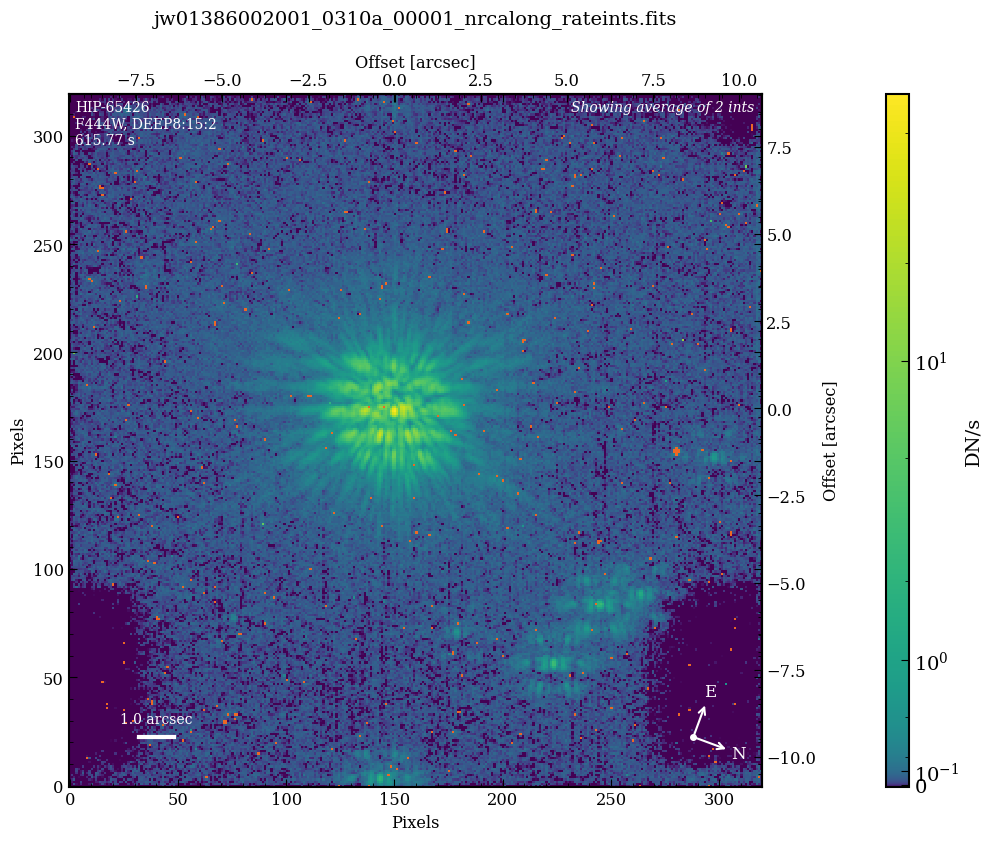

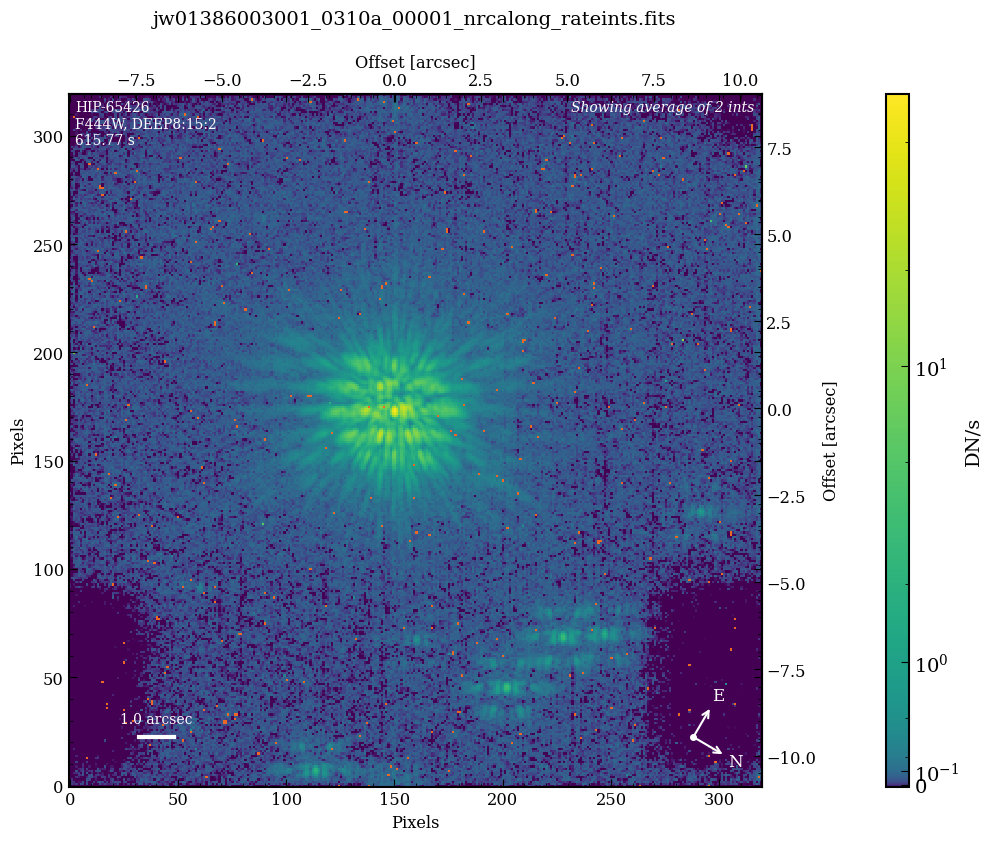

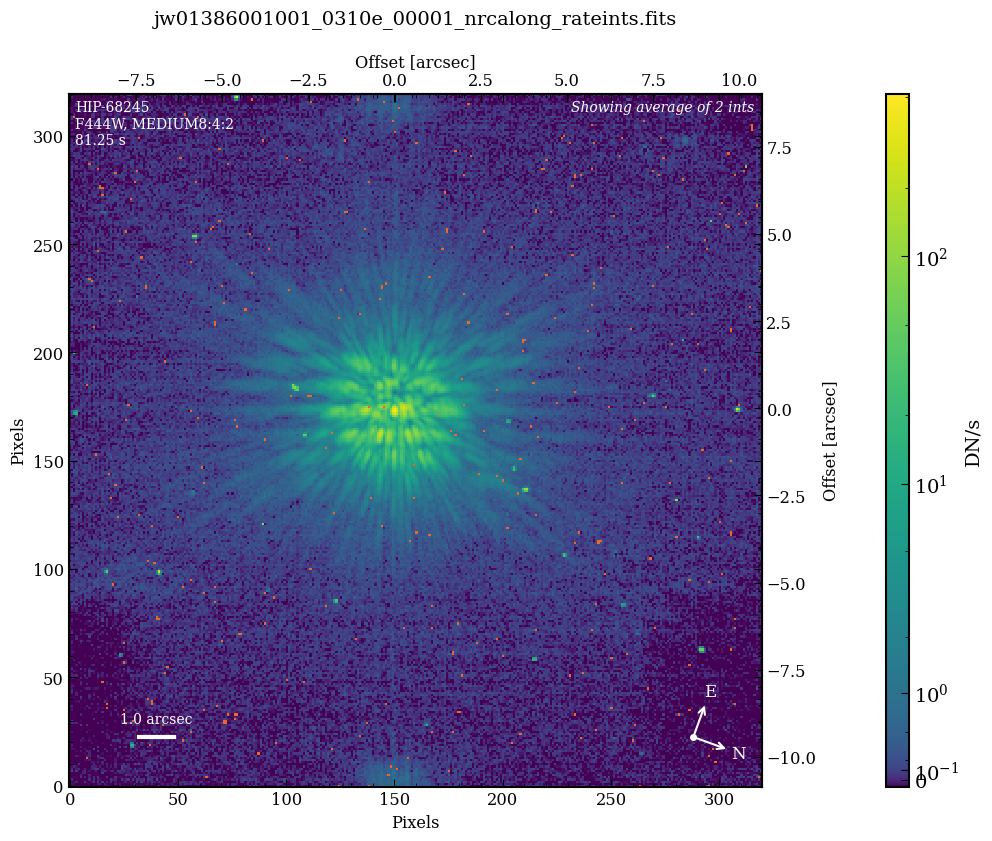

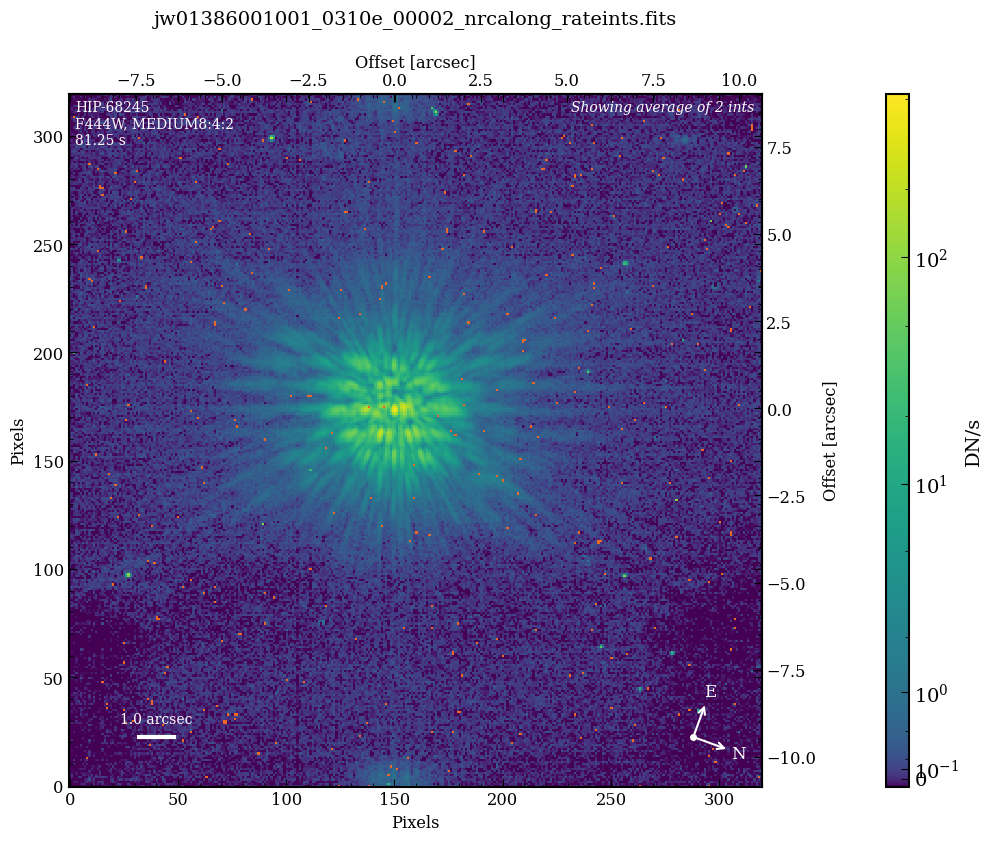

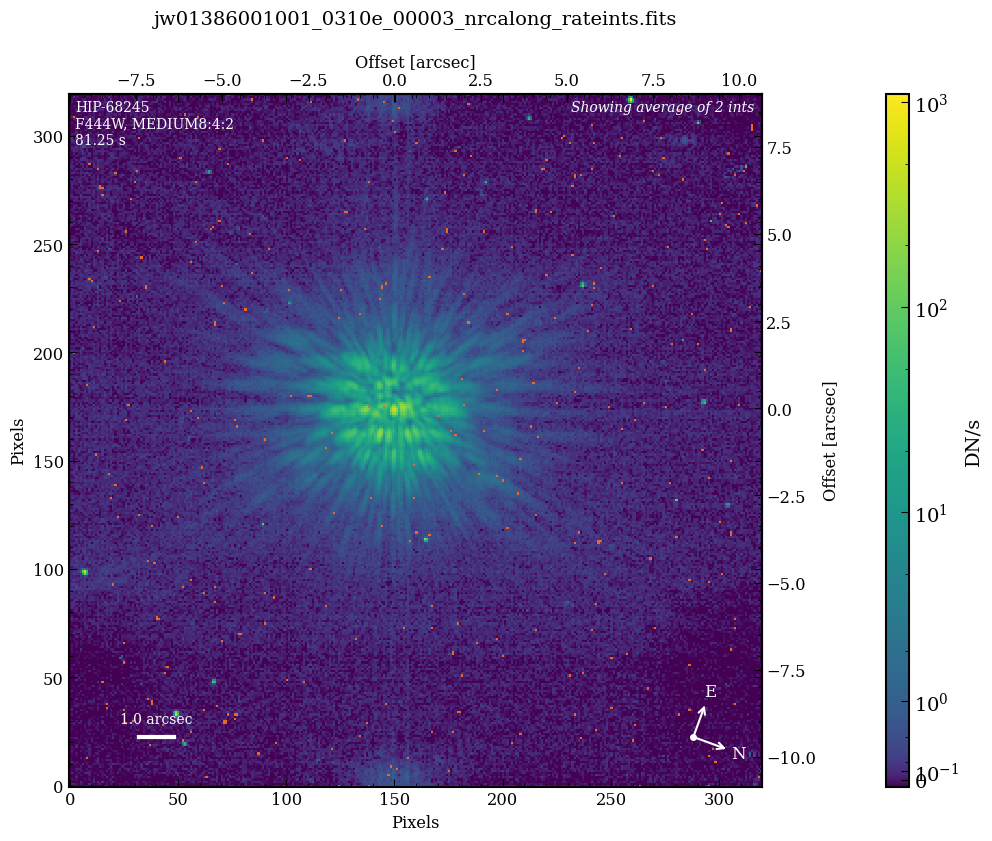

...

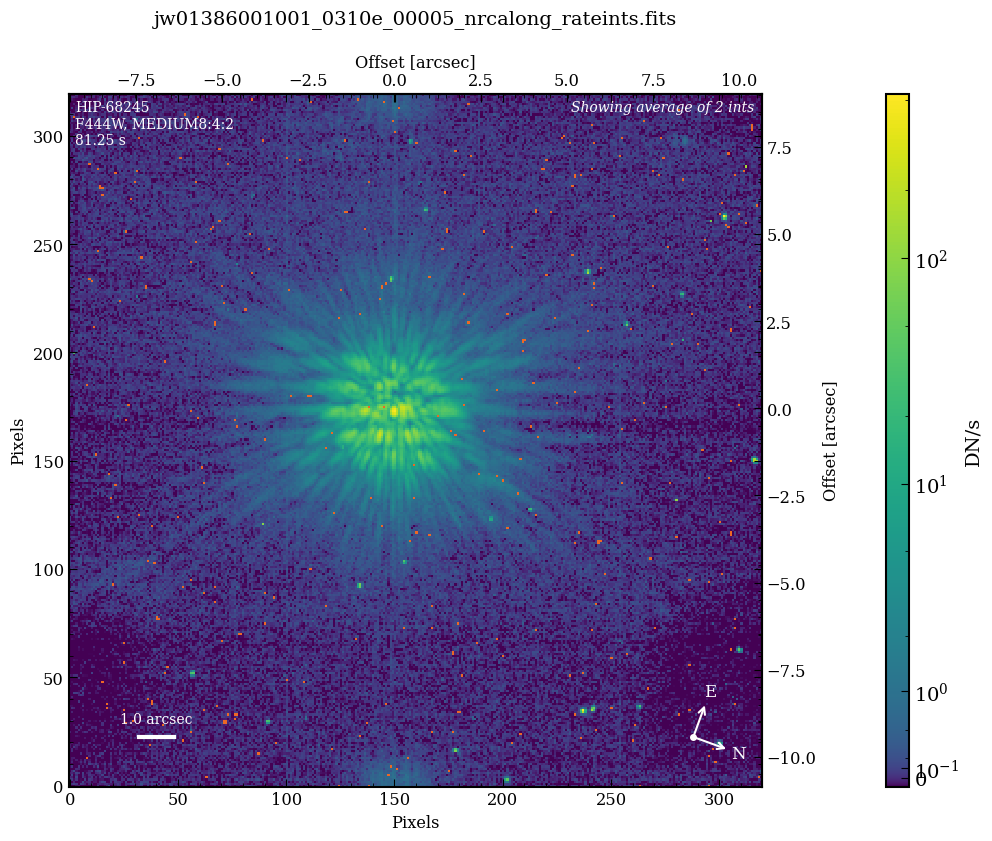

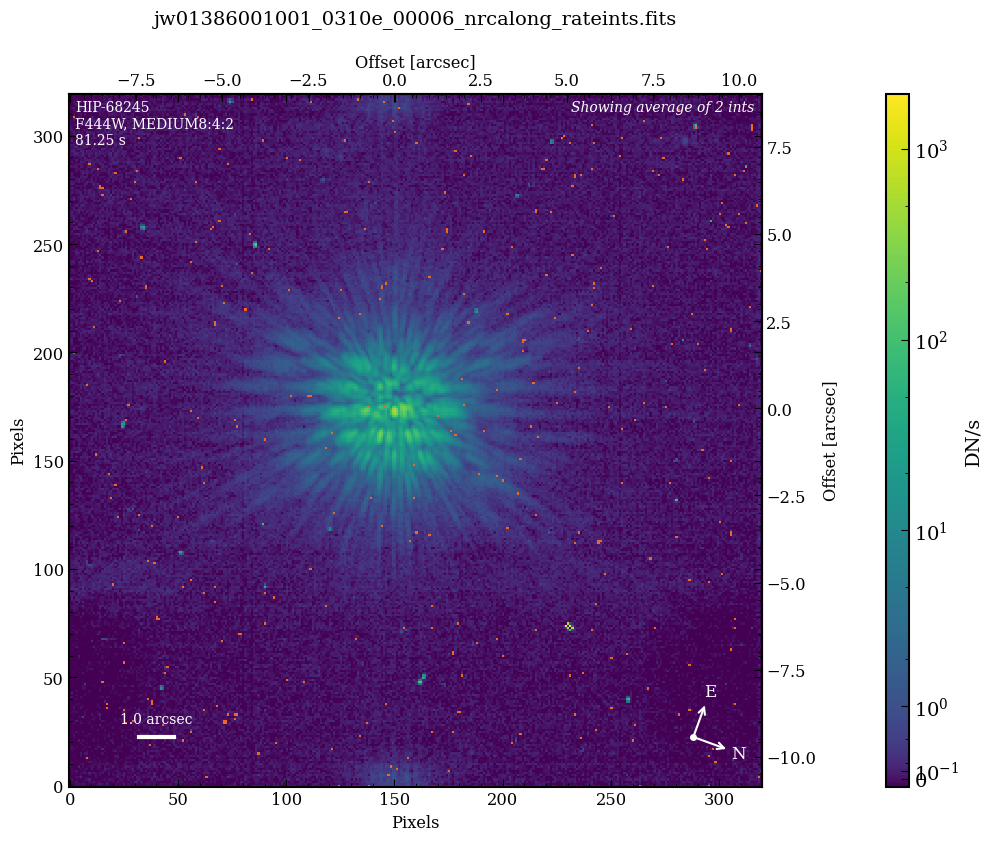

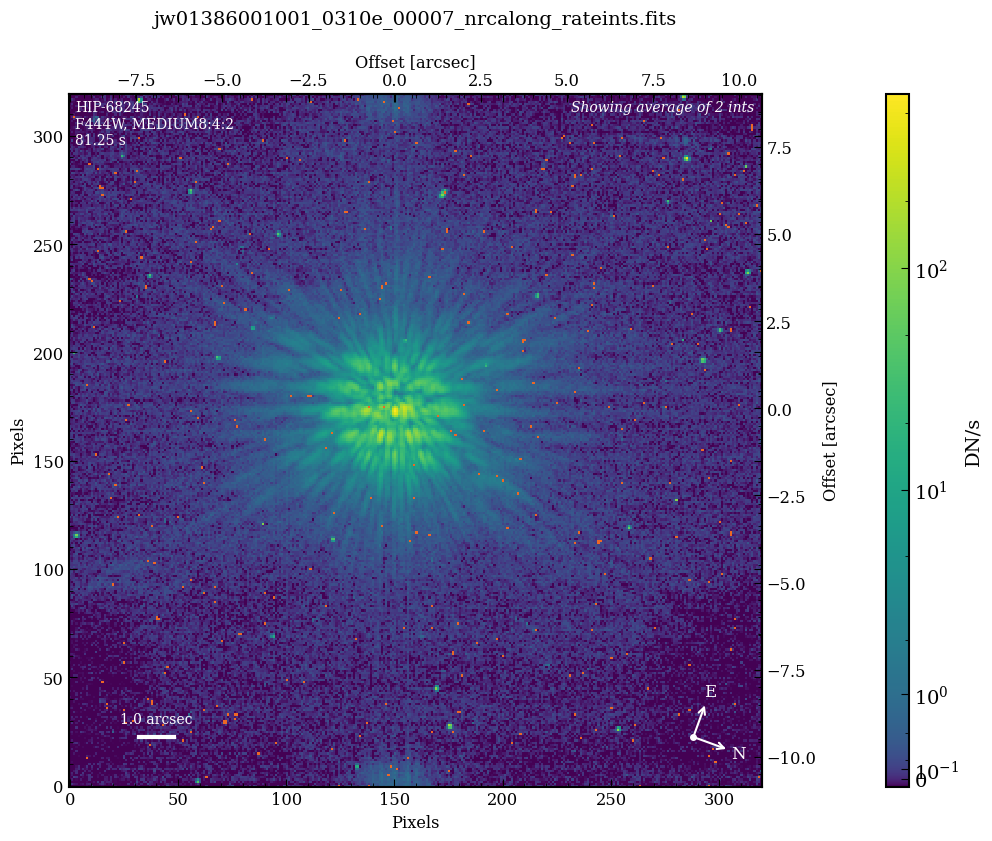

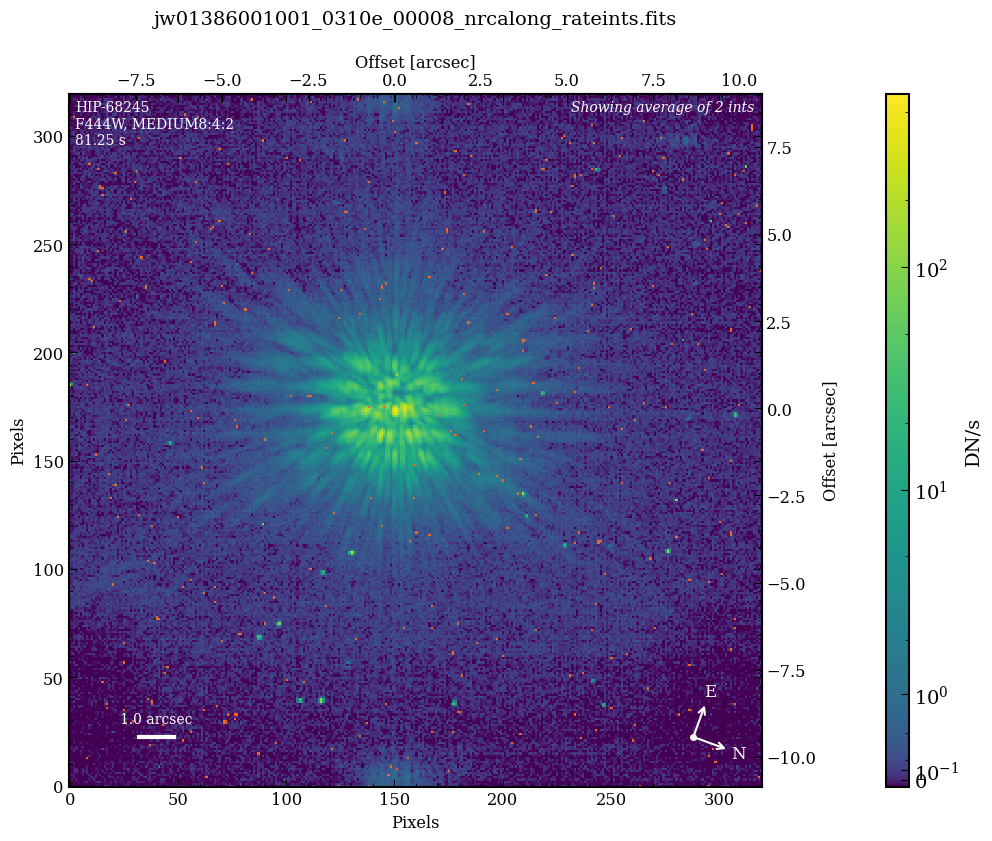

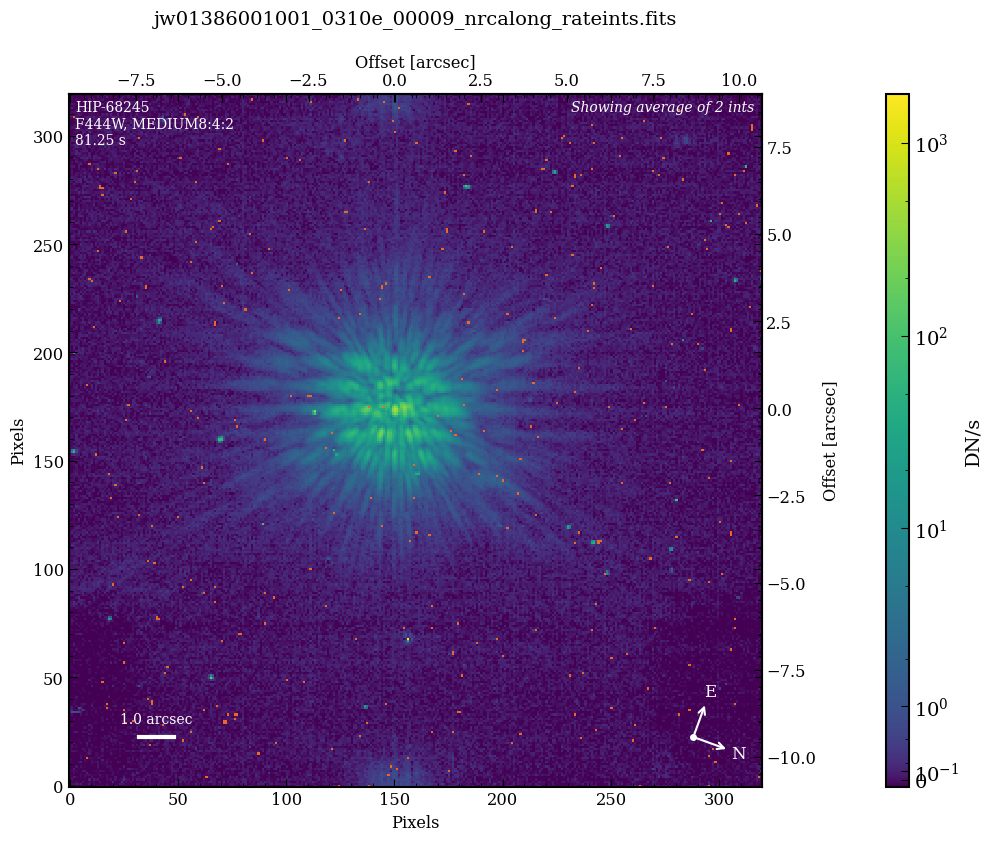

In [23]:
spaceKLIP.plotting.display_coron_dataset(database, 
                                         restrict_to='F444W', save_filename='plots_f444w_stage1.pdf')

# Level 2 reductions

### Optional: Re-read level 1 outputs into database 
This shows how you can start re-reductions at this point, once you have run the previous steps. 

In [25]:
input_dir = os.path.join(data_root, 'stage1')
    
fitsfiles = sorted(glob.glob(os.path.join(input_dir, "*_rateints.fits")))

database = spaceKLIP.database.Database(output_dir=output_dir)
database.read_jwst_s012_data(datapaths=fitsfiles,
                             assoc_using_targname=False)
 

[spaceKLIP.database:INFO] --> Identified 5 concatenation(s)
[spaceKLIP.database:INFO]   --> Concatenation 1: JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER      CWAVEL     ...      EFFINTTM       SUBARRAY  NUMDTHPT XOFFSET YOFFSET      PIXSCALE      BUNIT      ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ --------------- ... ----------------- ----------- -------- ------- ------- ------------------ ----- ------------------ --------
 SCI NRC_CORON   STAGE1     JWST HIP-65426   NIRCAM NRCALONG  F250M 2.5049391569476 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005  DN/s  110.2786614838192      nan
 SCI NRC_CORON   STAGE1     JWST HIP-65426   NIRCAM NRCALONG  F250M 2.5049391569476 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005  DN/s  120.3590367370958      nan
 REF NRC_CORON   STAGE1     JWST HIP-68245   NIRCA

TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER      CWAVEL     ...      EFFINTTM       SUBARRAY  NUMDTHPT XOFFSET YOFFSET      PIXSCALE      BUNIT      ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ --------------- ... ----------------- ----------- -------- ------- ------- ------------------ ----- ------------------ --------
 SCI NRC_CORON   STAGE1     JWST HIP-65426   NIRCAM NRCALONG  F444W 4.4393515120525 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005  DN/s  110.2786558985023      nan
 SCI NRC_CORON   STAGE1     JWST HIP-65426   NIRCAM NRCALONG  F444W 4.4393515120525 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005  DN/s  120.3590194808035      nan
 REF NRC_CORON   STAGE1     JWST HIP-68245   NIRCAM NRCALONG  F444W 4.4393515120525 ... 40.62352000000001 SUB320A335R        9     0.0     0.0 62.908505000000005  DN/s 110.00836165914811      nan
 REF NRC_CORON   STA

### Run level 2 pipeline

Now we run the stage 2 pipeline. Little customization is needed here. 

In [26]:
spaceKLIP.coron2pipeline.run_obs(database=database,
                           steps={'outlier_detection': {'skip': False}},
                           )


[spaceKLIP.coron2pipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386002001_03106_00001_nrcalong_rateints.fits


2023-08-02 23:59:25,611 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-02 23:59:25,614 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-02 23:59:25,616 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-02 23:59:25,618 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-02 23:59:25,620 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-02 23:59:25,622 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-02 23:59:25,625 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-02 23:59:26,094 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03106_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03106_00001_nrcalong_rateints.fits',).


2023-08-02 23:59:26,101 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-02 23:59:26,224 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386002001_03106_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386002001_03106_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-02 23:59:26,234 - CRDS - INFO -  Fetching  /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits   16.8 M bytes  (1 / 2 files) (0 / 16.8 M bytes)
2023-08-02 23:59:27,019 - CRDS - INFO -  Fetching  /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits   17.3 K bytes  (2 / 2 files) (16.8 M / 16.8 M bytes)
2023-08-02 23:59:27,181 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-02 23:59:27,182 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-02 23:59:27,184 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-02 23:59:27,185 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-02 23:59:27,186 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-02 23:59:27,187 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-02 23:59:27,189 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-02 23:59:27,191 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-02 23:59:27,192 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-02 23:59:27,193 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


2023-08-02 23:59:27,194 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-02 23:59:27,195 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-02 23:59:27,196 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-02 23:59:27,197 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-02 23:59:27,198 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-02 23:59:27,200 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-02 23:59:27,201 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-02 23:59:27,202 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-02 23:59:27,203 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-02 23:59:27,204 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-02 23:59:27,205 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-02 23:59:27,206 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-02 23:59:27,207 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-02 23:59:27,209 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03106_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03106_00001_nrcalong_rateints.fits ...


2023-08-02 23:59:27,504 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386002001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386002001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:27,506 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-02 23:59:28,106 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-02 23:59:28,281 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386002001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386002001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:28,283 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-02 23:59:28,728 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-02 23:59:28,910 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386002001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386002001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:28,913 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-02 23:59:28,962 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-02 23:59:28,963 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F250M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 9.35225


2023-08-02 23:59:29,201 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-02 23:59:29,202 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03106_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03106_00001_nrcalong


2023-08-02 23:59:29,374 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386002001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386002001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:29,377 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-02 23:59:29,393 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 24 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 31 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 34 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 35 (0.03%)


2023-08-02 23:59:30,318 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:59:30,723 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386002001_03106_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386002001_03106_00001_nrcalong_calints.fits


2023-08-02 23:59:30,725 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386003001_03106_00001_nrcalong_rateints.fits


2023-08-02 23:59:30,743 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-02 23:59:30,745 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-02 23:59:30,749 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-02 23:59:30,753 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-02 23:59:30,758 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-02 23:59:30,762 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-02 23:59:30,766 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-02 23:59:30,965 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03106_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03106_00001_nrcalong_rateints.fits',).


2023-08-02 23:59:30,973 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-02 23:59:31,099 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386003001_03106_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386003001_03106_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-02 23:59:31,107 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-02 23:59:31,108 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-02 23:59:31,110 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-02 23:59:31,111 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-02 23:59:31,113 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-02 23:59:31,114 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-02 23:59:31,116 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-02 23:59:31,118 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-02 23:59:31,119 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-02 23:59:31,122 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


2023-08-02 23:59:31,124 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-02 23:59:31,126 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-02 23:59:31,127 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-02 23:59:31,128 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-02 23:59:31,129 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-02 23:59:31,130 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-02 23:59:31,132 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-02 23:59:31,133 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-02 23:59:31,135 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-02 23:59:31,137 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-02 23:59:31,139 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-02 23:59:31,141 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-02 23:59:31,142 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-02 23:59:31,145 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03106_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03106_00001_nrcalong_rateints.fits ...


2023-08-02 23:59:31,439 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386003001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386003001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:31,441 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-02 23:59:31,982 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-02 23:59:32,158 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386003001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386003001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:32,160 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-02 23:59:32,531 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-02 23:59:32,712 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386003001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386003001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:32,714 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-02 23:59:32,762 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-02 23:59:32,763 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F250M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 9.35225


2023-08-02 23:59:32,983 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-02 23:59:32,984 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03106_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03106_00001_nrcalong


2023-08-02 23:59:33,165 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386003001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386003001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:33,167 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-02 23:59:33,183 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 24 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 12 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 19 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 19 (0.02%)


2023-08-02 23:59:33,928 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:59:34,219 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386003001_03106_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386003001_03106_00001_nrcalong_calints.fits


2023-08-02 23:59:34,220 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00001_nrcalong_rateints.fits


2023-08-02 23:59:34,233 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-02 23:59:34,235 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-02 23:59:34,238 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-02 23:59:34,240 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-02 23:59:34,243 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-02 23:59:34,246 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-02 23:59:34,249 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-02 23:59:34,425 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00001_nrcalong_rateints.fits',).


2023-08-02 23:59:34,431 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-02 23:59:34,554 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03106_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03106_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-02 23:59:34,562 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-02 23:59:34,564 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-02 23:59:34,565 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-02 23:59:34,567 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-02 23:59:34,568 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-02 23:59:34,569 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-02 23:59:34,570 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-02 23:59:34,572 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-02 23:59:34,573 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-02 23:59:34,574 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


2023-08-02 23:59:34,576 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-02 23:59:34,577 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-02 23:59:34,579 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-02 23:59:34,581 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-02 23:59:34,583 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-02 23:59:34,585 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-02 23:59:34,586 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-02 23:59:34,588 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-02 23:59:34,615 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-02 23:59:34,616 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-02 23:59:34,618 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-02 23:59:34,619 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-02 23:59:34,621 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-02 23:59:34,623 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00001_nrcalong_rateints.fits ...


2023-08-02 23:59:34,951 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:34,953 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-02 23:59:35,516 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-02 23:59:35,705 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:35,708 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-02 23:59:36,126 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-02 23:59:36,315 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:36,317 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-02 23:59:36,377 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-02 23:59:36,378 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F250M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 9.35225


2023-08-02 23:59:36,634 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-02 23:59:36,635 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00001_nrcalong


2023-08-02 23:59:36,825 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00001_nrcalong_rateints.fits>,).


2023-08-02 23:59:36,828 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-02 23:59:36,843 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 61 (0.06%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 14 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 54 (0.05%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 33 (0.03%)


2023-08-02 23:59:37,700 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:59:38,000 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00001_nrcalong_calints.fits


2023-08-02 23:59:38,001 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00002_nrcalong_rateints.fits


2023-08-02 23:59:38,015 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-02 23:59:38,017 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-02 23:59:38,019 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-02 23:59:38,022 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-02 23:59:38,024 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-02 23:59:38,026 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-02 23:59:38,029 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-02 23:59:38,244 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00002_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00002_nrcalong_rateints.fits',).


2023-08-02 23:59:38,251 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-02 23:59:38,368 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03106_00002_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03106_00002_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-02 23:59:38,375 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-02 23:59:38,376 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-02 23:59:38,377 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-02 23:59:38,378 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-02 23:59:38,379 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-02 23:59:38,380 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-02 23:59:38,382 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-02 23:59:38,383 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-02 23:59:38,384 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-02 23:59:38,386 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


2023-08-02 23:59:38,388 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-02 23:59:38,389 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-02 23:59:38,390 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-02 23:59:38,392 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-02 23:59:38,393 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-02 23:59:38,394 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-02 23:59:38,395 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-02 23:59:38,396 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-02 23:59:38,398 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-02 23:59:38,399 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-02 23:59:38,400 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-02 23:59:38,402 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-02 23:59:38,403 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-02 23:59:38,406 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00002_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00002_nrcalong_rateints.fits ...


2023-08-02 23:59:38,763 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00002_nrcalong_rateints.fits>,).


2023-08-02 23:59:38,766 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-02 23:59:39,316 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-02 23:59:39,484 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00002_nrcalong_rateints.fits>,).


2023-08-02 23:59:39,486 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-02 23:59:39,851 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-02 23:59:40,024 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00002_nrcalong_rateints.fits>,).


2023-08-02 23:59:40,026 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-02 23:59:40,084 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-02 23:59:40,085 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F250M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 9.35225


2023-08-02 23:59:40,332 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-02 23:59:40,333 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00002_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00002_nrcalong


2023-08-02 23:59:40,518 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00002_nrcalong_rateints.fits>,).


2023-08-02 23:59:40,521 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-02 23:59:40,539 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.32421875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 34 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 43 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 110 (0.11%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 28 (0.03%)


2023-08-02 23:59:41,357 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:59:41,652 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00002_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00002_nrcalong_calints.fits


2023-08-02 23:59:41,653 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00003_nrcalong_rateints.fits


2023-08-02 23:59:41,666 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-02 23:59:41,668 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-02 23:59:41,671 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-02 23:59:41,673 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-02 23:59:41,675 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-02 23:59:41,677 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-02 23:59:41,680 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-02 23:59:41,884 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00003_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00003_nrcalong_rateints.fits',).


2023-08-02 23:59:41,894 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-02 23:59:42,036 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03106_00003_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03106_00003_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-02 23:59:42,043 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-02 23:59:42,045 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-02 23:59:42,046 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-02 23:59:42,047 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-02 23:59:42,048 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-02 23:59:42,050 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-02 23:59:42,052 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-02 23:59:42,054 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-02 23:59:42,055 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-02 23:59:42,057 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


2023-08-02 23:59:42,059 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-02 23:59:42,061 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-02 23:59:42,063 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-02 23:59:42,065 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-02 23:59:42,067 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-02 23:59:42,068 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-02 23:59:42,069 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-02 23:59:42,071 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-02 23:59:42,073 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-02 23:59:42,074 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-02 23:59:42,075 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-02 23:59:42,077 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-02 23:59:42,078 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-02 23:59:42,081 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00003_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00003_nrcalong_rateints.fits ...


2023-08-02 23:59:42,388 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00003_nrcalong_rateints.fits>,).


2023-08-02 23:59:42,390 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-02 23:59:42,924 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-02 23:59:43,122 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00003_nrcalong_rateints.fits>,).


2023-08-02 23:59:43,124 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-02 23:59:43,482 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-02 23:59:43,658 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00003_nrcalong_rateints.fits>,).


2023-08-02 23:59:43,660 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-02 23:59:43,711 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-02 23:59:43,712 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F250M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 9.35225


2023-08-02 23:59:43,935 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-02 23:59:43,936 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00003_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00003_nrcalong


2023-08-02 23:59:44,107 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00003_nrcalong_rateints.fits>,).


2023-08-02 23:59:44,109 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-02 23:59:44,124 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.326171875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 25 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 19 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 42 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 20 (0.02%)


2023-08-02 23:59:44,810 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:59:45,099 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00003_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00003_nrcalong_calints.fits


2023-08-02 23:59:45,100 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00004_nrcalong_rateints.fits


2023-08-02 23:59:45,114 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-02 23:59:45,116 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-02 23:59:45,119 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-02 23:59:45,121 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-02 23:59:45,123 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-02 23:59:45,126 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-02 23:59:45,128 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-02 23:59:45,301 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00004_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00004_nrcalong_rateints.fits',).


2023-08-02 23:59:45,308 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-02 23:59:45,429 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03106_00004_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03106_00004_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-02 23:59:45,436 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-02 23:59:45,437 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-02 23:59:45,438 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-02 23:59:45,439 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-02 23:59:45,440 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-02 23:59:45,441 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-02 23:59:45,443 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-02 23:59:45,444 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-02 23:59:45,446 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-02 23:59:45,447 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


2023-08-02 23:59:45,449 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-02 23:59:45,450 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-02 23:59:45,452 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-02 23:59:45,453 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-02 23:59:45,454 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-02 23:59:45,455 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-02 23:59:45,457 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-02 23:59:45,458 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-02 23:59:45,486 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-02 23:59:45,487 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-02 23:59:45,488 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-02 23:59:45,489 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-02 23:59:45,491 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-02 23:59:45,493 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00004_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00004_nrcalong_rateints.fits ...


2023-08-02 23:59:45,794 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00004_nrcalong_rateints.fits>,).


2023-08-02 23:59:45,796 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-02 23:59:46,328 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-02 23:59:46,511 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00004_nrcalong_rateints.fits>,).


2023-08-02 23:59:46,513 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-02 23:59:46,893 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-02 23:59:47,070 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00004_nrcalong_rateints.fits>,).


2023-08-02 23:59:47,072 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-02 23:59:47,123 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-02 23:59:47,124 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F250M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 9.35225


2023-08-02 23:59:47,362 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-02 23:59:47,363 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00004_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00004_nrcalong


2023-08-02 23:59:47,543 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00004_nrcalong_rateints.fits>,).


2023-08-02 23:59:47,545 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-02 23:59:47,563 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 28 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 39 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 52 (0.05%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 31 (0.03%)


2023-08-02 23:59:48,312 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:59:48,583 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00004_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00004_nrcalong_calints.fits


2023-08-02 23:59:48,584 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00005_nrcalong_rateints.fits


2023-08-02 23:59:48,622 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-02 23:59:48,625 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-02 23:59:48,628 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-02 23:59:48,631 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-02 23:59:48,634 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-02 23:59:48,637 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-02 23:59:48,640 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-02 23:59:48,850 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00005_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00005_nrcalong_rateints.fits',).


2023-08-02 23:59:48,858 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-02 23:59:48,975 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03106_00005_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03106_00005_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-02 23:59:48,981 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-02 23:59:48,982 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-02 23:59:48,983 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-02 23:59:48,984 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-02 23:59:48,985 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-02 23:59:48,986 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-02 23:59:48,988 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-02 23:59:48,989 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-02 23:59:48,990 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-02 23:59:48,992 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


2023-08-02 23:59:48,994 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-02 23:59:48,995 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-02 23:59:48,997 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-02 23:59:48,998 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-02 23:59:48,999 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-02 23:59:49,001 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-02 23:59:49,002 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-02 23:59:49,003 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-02 23:59:49,004 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-02 23:59:49,005 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-02 23:59:49,007 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-02 23:59:49,008 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-02 23:59:49,009 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-02 23:59:49,012 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00005_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00005_nrcalong_rateints.fits ...


2023-08-02 23:59:49,314 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00005_nrcalong_rateints.fits>,).


2023-08-02 23:59:49,316 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-02 23:59:49,888 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-02 23:59:50,200 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00005_nrcalong_rateints.fits>,).


2023-08-02 23:59:50,204 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-02 23:59:50,619 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-02 23:59:50,830 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00005_nrcalong_rateints.fits>,).


2023-08-02 23:59:50,833 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-02 23:59:50,911 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-02 23:59:50,912 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F250M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 9.35225


2023-08-02 23:59:51,190 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-02 23:59:51,191 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00005_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00005_nrcalong


2023-08-02 23:59:51,372 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00005_nrcalong_rateints.fits>,).


2023-08-02 23:59:51,374 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-02 23:59:51,388 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3271484375
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3232421875
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 55 (0.05%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 43 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 46 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 32 (0.03%)


2023-08-02 23:59:52,069 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:59:52,384 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00005_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00005_nrcalong_calints.fits


2023-08-02 23:59:52,386 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00006_nrcalong_rateints.fits


2023-08-02 23:59:52,398 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-02 23:59:52,400 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-02 23:59:52,403 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-02 23:59:52,405 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-02 23:59:52,407 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-02 23:59:52,410 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-02 23:59:52,413 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-02 23:59:52,597 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00006_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00006_nrcalong_rateints.fits',).


2023-08-02 23:59:52,604 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-02 23:59:52,723 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03106_00006_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03106_00006_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-02 23:59:52,730 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-02 23:59:52,748 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-02 23:59:52,750 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-02 23:59:52,751 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-02 23:59:52,753 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-02 23:59:52,754 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-02 23:59:52,756 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-02 23:59:52,758 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-02 23:59:52,760 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-02 23:59:52,762 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


2023-08-02 23:59:52,764 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-02 23:59:52,765 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-02 23:59:52,767 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-02 23:59:52,768 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-02 23:59:52,769 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-02 23:59:52,771 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-02 23:59:52,773 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-02 23:59:52,774 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-02 23:59:52,775 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-02 23:59:52,777 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-02 23:59:52,778 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-02 23:59:52,779 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-02 23:59:52,780 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-02 23:59:52,783 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00006_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00006_nrcalong_rateints.fits ...


2023-08-02 23:59:53,068 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00006_nrcalong_rateints.fits>,).


2023-08-02 23:59:53,070 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-02 23:59:53,610 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-02 23:59:53,793 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00006_nrcalong_rateints.fits>,).


2023-08-02 23:59:53,796 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-02 23:59:54,155 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-02 23:59:54,328 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00006_nrcalong_rateints.fits>,).


2023-08-02 23:59:54,330 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-02 23:59:54,376 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-02 23:59:54,377 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F250M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 9.35225


2023-08-02 23:59:54,607 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-02 23:59:54,609 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00006_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00006_nrcalong


2023-08-02 23:59:54,793 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00006_nrcalong_rateints.fits>,).


2023-08-02 23:59:54,796 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-02 23:59:54,812 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 43 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 10 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 21 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 15 (0.01%)


2023-08-02 23:59:55,512 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:59:55,841 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00006_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00006_nrcalong_calints.fits


2023-08-02 23:59:55,842 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00007_nrcalong_rateints.fits


2023-08-02 23:59:55,873 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-02 23:59:55,876 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-02 23:59:55,879 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-02 23:59:55,881 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-02 23:59:55,884 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-02 23:59:55,888 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-02 23:59:55,890 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-02 23:59:56,071 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00007_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00007_nrcalong_rateints.fits',).


2023-08-02 23:59:56,080 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-02 23:59:56,192 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03106_00007_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03106_00007_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-02 23:59:56,199 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-02 23:59:56,200 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-02 23:59:56,201 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-02 23:59:56,202 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-02 23:59:56,203 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-02 23:59:56,204 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-02 23:59:56,205 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-02 23:59:56,206 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-02 23:59:56,207 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-02 23:59:56,209 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


2023-08-02 23:59:56,210 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-02 23:59:56,211 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-02 23:59:56,212 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-02 23:59:56,213 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-02 23:59:56,214 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-02 23:59:56,215 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-02 23:59:56,216 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-02 23:59:56,217 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-02 23:59:56,219 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-02 23:59:56,219 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-02 23:59:56,220 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-02 23:59:56,221 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-02 23:59:56,222 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-02 23:59:56,224 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00007_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00007_nrcalong_rateints.fits ...


2023-08-02 23:59:56,496 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00007_nrcalong_rateints.fits>,).


2023-08-02 23:59:56,498 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-02 23:59:57,022 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-02 23:59:57,217 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00007_nrcalong_rateints.fits>,).


2023-08-02 23:59:57,219 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-02 23:59:57,562 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-02 23:59:57,728 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00007_nrcalong_rateints.fits>,).


2023-08-02 23:59:57,730 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-02 23:59:57,781 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-02 23:59:57,782 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F250M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 9.35225


2023-08-02 23:59:57,997 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-02 23:59:57,998 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00007_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00007_nrcalong


2023-08-02 23:59:58,180 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00007_nrcalong_rateints.fits>,).


2023-08-02 23:59:58,183 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-02 23:59:58,199 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 22 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 27 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 19 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 61 (0.06%)


2023-08-02 23:59:58,885 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-02 23:59:59,182 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00007_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00007_nrcalong_calints.fits


2023-08-02 23:59:59,184 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00008_nrcalong_rateints.fits


2023-08-02 23:59:59,197 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-02 23:59:59,199 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-02 23:59:59,202 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-02 23:59:59,204 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-02 23:59:59,206 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-02 23:59:59,209 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-02 23:59:59,212 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-02 23:59:59,449 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00008_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00008_nrcalong_rateints.fits',).


2023-08-02 23:59:59,462 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-02 23:59:59,646 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03106_00008_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03106_00008_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-02 23:59:59,657 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-02 23:59:59,660 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-02 23:59:59,662 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-02 23:59:59,663 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-02 23:59:59,665 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-02 23:59:59,667 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-02 23:59:59,670 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-02 23:59:59,673 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-02 23:59:59,674 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-02 23:59:59,676 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


2023-08-02 23:59:59,678 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-02 23:59:59,679 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-02 23:59:59,680 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-02 23:59:59,682 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-02 23:59:59,683 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-02 23:59:59,684 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-02 23:59:59,685 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-02 23:59:59,687 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-02 23:59:59,691 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-02 23:59:59,693 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-02 23:59:59,695 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-02 23:59:59,696 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-02 23:59:59,698 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-02 23:59:59,700 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00008_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00008_nrcalong_rateints.fits ...


2023-08-03 00:00:00,241 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00008_nrcalong_rateints.fits>,).


2023-08-03 00:00:00,246 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:01,437 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:01,646 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00008_nrcalong_rateints.fits>,).


2023-08-03 00:00:01,649 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:02,024 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:02,230 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00008_nrcalong_rateints.fits>,).


2023-08-03 00:00:02,233 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:02,287 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:02,288 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F250M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 9.35225


2023-08-03 00:00:02,576 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:02,577 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00008_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00008_nrcalong


2023-08-03 00:00:02,746 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00008_nrcalong_rateints.fits>,).


2023-08-03 00:00:02,749 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:02,766 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3310546875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 34 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 40 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 17 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 23 (0.02%)


2023-08-03 00:00:03,509 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:03,831 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00008_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00008_nrcalong_calints.fits


2023-08-03 00:00:03,832 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03106_00009_nrcalong_rateints.fits


2023-08-03 00:00:03,847 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:03,850 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:03,853 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:03,857 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:03,859 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:03,862 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:03,864 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:04,057 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00009_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00009_nrcalong_rateints.fits',).


2023-08-03 00:00:04,064 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:04,198 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03106_00009_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03106_00009_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:04,205 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:04,207 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:04,208 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:04,209 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:04,210 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:04,211 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:04,212 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:04,214 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:04,215 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:04,216 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits'.


2023-08-03 00:00:04,218 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:04,219 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:04,220 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:04,221 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:04,222 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:04,223 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:04,224 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:04,225 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:04,226 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:04,227 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:04,228 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:04,229 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:04,230 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:04,232 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00009_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00009_nrcalong_rateints.fits ...


2023-08-03 00:00:04,505 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00009_nrcalong_rateints.fits>,).


2023-08-03 00:00:04,508 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:05,081 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:05,279 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00009_nrcalong_rateints.fits>,).


2023-08-03 00:00:05,281 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0441.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:05,654 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:05,830 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00009_nrcalong_rateints.fits>,).


2023-08-03 00:00:05,832 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:05,879 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:05,880 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F250M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 9.35225


2023-08-03 00:00:06,126 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:06,127 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00009_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03106_00009_nrcalong


2023-08-03 00:00:06,293 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03106_00009_nrcalong_rateints.fits>,).


2023-08-03 00:00:06,295 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:06,309 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 7 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 50 (0.05%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 29 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 34 (0.03%)


2023-08-03 00:00:07,054 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:07,370 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00009_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03106_00009_nrcalong_calints.fits


2023-08-03 00:00:07,371 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386002001_03107_00001_nrcalong_rateints.fits


2023-08-03 00:00:07,383 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:07,385 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:07,388 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:07,390 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:07,392 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:07,394 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:07,397 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:07,562 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03107_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03107_00001_nrcalong_rateints.fits',).


2023-08-03 00:00:07,568 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:07,708 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386002001_03107_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386002001_03107_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:07,717 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:07,718 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:07,719 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:07,720 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:07,721 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:07,722 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:07,723 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:07,724 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:07,725 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:07,726 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


2023-08-03 00:00:07,727 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:07,728 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:07,729 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:07,730 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:07,731 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:07,732 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:07,733 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:07,734 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:07,735 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:07,735 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:07,737 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:07,737 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:07,738 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:07,740 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03107_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03107_00001_nrcalong_rateints.fits ...


2023-08-03 00:00:08,024 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386002001_03107_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386002001_03107_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:08,026 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:08,548 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:08,736 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386002001_03107_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386002001_03107_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:08,738 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:09,114 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:09,272 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386002001_03107_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386002001_03107_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:09,274 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:09,338 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:09,340 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F300M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 7.04474


2023-08-03 00:00:09,549 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:09,551 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03107_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03107_00001_nrcalong


2023-08-03 00:00:09,729 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386002001_03107_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386002001_03107_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:09,731 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:09,746 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3369140625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.326171875
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 36 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 14 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 26 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 25 (0.02%)


2023-08-03 00:00:10,411 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:10,769 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386002001_03107_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386002001_03107_00001_nrcalong_calints.fits


2023-08-03 00:00:10,770 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386003001_03107_00001_nrcalong_rateints.fits


2023-08-03 00:00:10,783 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:10,785 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:10,787 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:10,790 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:10,791 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:10,794 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:10,798 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:10,978 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03107_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03107_00001_nrcalong_rateints.fits',).


2023-08-03 00:00:10,985 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:11,114 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386003001_03107_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386003001_03107_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:11,121 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:11,123 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:11,124 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:11,125 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:11,126 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:11,127 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:11,128 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:11,130 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:11,131 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:11,132 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


2023-08-03 00:00:11,133 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:11,134 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:11,136 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:11,137 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:11,137 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:11,138 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:11,139 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:11,140 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:11,141 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:11,142 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:11,143 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:11,144 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:11,145 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:11,147 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03107_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03107_00001_nrcalong_rateints.fits ...


2023-08-03 00:00:11,421 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386003001_03107_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386003001_03107_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:11,423 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:11,960 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:12,143 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386003001_03107_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386003001_03107_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:12,146 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:12,610 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:12,832 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386003001_03107_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386003001_03107_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:12,835 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:12,891 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:12,892 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F300M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 7.04474


2023-08-03 00:00:13,214 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:13,216 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03107_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03107_00001_nrcalong


2023-08-03 00:00:13,491 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386003001_03107_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386003001_03107_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:13,493 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:13,511 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.326171875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 41 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 24 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 13 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 26 (0.03%)


2023-08-03 00:00:14,522 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:14,816 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386003001_03107_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386003001_03107_00001_nrcalong_calints.fits


2023-08-03 00:00:14,817 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03108_00001_nrcalong_rateints.fits


2023-08-03 00:00:14,830 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:14,833 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:14,835 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:14,838 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:14,840 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:14,843 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:14,846 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:15,022 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00001_nrcalong_rateints.fits',).


2023-08-03 00:00:15,030 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:15,146 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03108_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03108_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:15,153 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:15,169 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:15,170 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:15,171 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:15,172 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:15,173 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:15,174 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:15,175 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:15,176 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:15,177 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


2023-08-03 00:00:15,179 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:15,179 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:15,180 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:15,181 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:15,182 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:15,184 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:15,185 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:15,187 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:15,188 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:15,190 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:15,191 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:15,192 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:15,193 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:15,194 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00001_nrcalong_rateints.fits ...


2023-08-03 00:00:15,460 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:15,462 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:15,974 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:16,159 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:16,161 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:16,642 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:16,922 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:16,925 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:16,987 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:16,989 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F300M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 7.04474


2023-08-03 00:00:17,273 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:17,274 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00001_nrcalong


2023-08-03 00:00:17,567 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:17,571 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:17,591 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 24 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 52 (0.05%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 27 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 17 (0.02%)


2023-08-03 00:00:18,389 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:18,793 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00001_nrcalong_calints.fits


2023-08-03 00:00:18,795 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03108_00002_nrcalong_rateints.fits


2023-08-03 00:00:18,831 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:18,834 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:18,837 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:18,839 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:18,842 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:18,845 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:18,848 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:19,040 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00002_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00002_nrcalong_rateints.fits',).


2023-08-03 00:00:19,047 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:19,154 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03108_00002_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03108_00002_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:19,163 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:19,164 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:19,165 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:19,167 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:19,168 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:19,169 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:19,171 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:19,172 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:19,173 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:19,174 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


2023-08-03 00:00:19,175 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:19,176 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:19,177 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:19,177 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:19,178 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:19,179 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:19,180 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:19,181 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:19,190 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:19,191 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:19,193 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:19,194 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:19,195 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:19,197 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00002_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00002_nrcalong_rateints.fits ...


2023-08-03 00:00:19,459 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00002_nrcalong_rateints.fits>,).


2023-08-03 00:00:19,461 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:19,980 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:20,167 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00002_nrcalong_rateints.fits>,).


2023-08-03 00:00:20,169 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:20,518 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:20,694 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00002_nrcalong_rateints.fits>,).


2023-08-03 00:00:20,696 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:20,742 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:20,744 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F300M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 7.04474


2023-08-03 00:00:21,006 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:21,007 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00002_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00002_nrcalong


2023-08-03 00:00:21,265 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00002_nrcalong_rateints.fits>,).


2023-08-03 00:00:21,267 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:21,283 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3251953125
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.326171875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 31 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 24 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 23 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 6 (0.01%)


2023-08-03 00:00:22,023 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:22,433 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00002_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00002_nrcalong_calints.fits


2023-08-03 00:00:22,434 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03108_00003_nrcalong_rateints.fits


2023-08-03 00:00:22,455 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:22,459 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:22,466 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:22,470 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:22,473 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:22,475 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:22,479 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:22,767 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00003_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00003_nrcalong_rateints.fits',).


2023-08-03 00:00:22,778 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:22,905 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03108_00003_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03108_00003_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:22,912 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:22,914 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:22,915 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:22,916 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:22,917 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:22,918 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:22,920 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:22,921 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:22,922 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:22,924 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


2023-08-03 00:00:22,925 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:22,926 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:22,927 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:22,928 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:22,929 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:22,931 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:22,931 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:22,933 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:22,934 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:22,935 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:22,936 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:22,937 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:22,938 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:22,940 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00003_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00003_nrcalong_rateints.fits ...


2023-08-03 00:00:23,227 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00003_nrcalong_rateints.fits>,).


2023-08-03 00:00:23,229 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:23,789 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:23,968 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00003_nrcalong_rateints.fits>,).


2023-08-03 00:00:23,970 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:24,312 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:24,476 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00003_nrcalong_rateints.fits>,).


2023-08-03 00:00:24,478 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:24,523 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:24,524 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F300M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 7.04474


2023-08-03 00:00:24,772 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:24,773 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00003_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00003_nrcalong


2023-08-03 00:00:24,951 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00003_nrcalong_rateints.fits>,).


2023-08-03 00:00:24,953 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:24,968 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 25 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 30 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 26 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 11 (0.01%)


2023-08-03 00:00:25,672 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:25,941 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00003_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00003_nrcalong_calints.fits


2023-08-03 00:00:25,942 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03108_00004_nrcalong_rateints.fits


2023-08-03 00:00:25,981 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:25,983 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:25,987 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:25,990 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:25,992 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:25,995 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:25,998 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:26,205 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00004_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00004_nrcalong_rateints.fits',).


2023-08-03 00:00:26,213 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:26,325 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03108_00004_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03108_00004_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:26,331 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:26,332 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:26,333 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:26,334 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:26,335 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:26,336 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:26,337 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:26,338 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:26,339 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:26,341 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


2023-08-03 00:00:26,342 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:26,343 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:26,344 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:26,345 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:26,345 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:26,346 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:26,348 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:26,349 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:26,350 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:26,351 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:26,352 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:26,352 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:26,353 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:26,355 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00004_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00004_nrcalong_rateints.fits ...


2023-08-03 00:00:26,758 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00004_nrcalong_rateints.fits>,).


2023-08-03 00:00:26,762 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:27,337 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:27,512 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00004_nrcalong_rateints.fits>,).


2023-08-03 00:00:27,514 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:27,975 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:28,281 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00004_nrcalong_rateints.fits>,).


2023-08-03 00:00:28,285 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:28,355 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:28,356 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F300M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 7.04474


2023-08-03 00:00:28,644 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:28,646 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00004_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00004_nrcalong


2023-08-03 00:00:28,823 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00004_nrcalong_rateints.fits>,).


2023-08-03 00:00:28,826 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:28,845 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 43 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 38 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 21 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 52 (0.05%)


2023-08-03 00:00:29,545 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:29,857 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00004_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00004_nrcalong_calints.fits


2023-08-03 00:00:29,858 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03108_00005_nrcalong_rateints.fits


2023-08-03 00:00:29,872 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:29,875 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:29,877 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:29,880 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:29,882 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:29,886 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:29,889 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:30,108 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00005_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00005_nrcalong_rateints.fits',).


2023-08-03 00:00:30,118 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:30,252 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03108_00005_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03108_00005_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:30,260 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:30,262 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:30,263 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:30,265 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:30,266 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:30,267 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:30,269 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:30,270 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:30,271 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:30,272 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


2023-08-03 00:00:30,274 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:30,275 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:30,277 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:30,278 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:30,279 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:30,280 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:30,281 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:30,283 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:30,284 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:30,286 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:30,287 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:30,288 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:30,289 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:30,291 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00005_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00005_nrcalong_rateints.fits ...


2023-08-03 00:00:30,588 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00005_nrcalong_rateints.fits>,).


2023-08-03 00:00:30,590 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:31,125 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:31,305 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00005_nrcalong_rateints.fits>,).


2023-08-03 00:00:31,307 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:31,648 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:31,814 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00005_nrcalong_rateints.fits>,).


2023-08-03 00:00:31,816 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:31,863 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:31,864 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F300M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 7.04474


2023-08-03 00:00:32,091 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:32,092 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00005_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00005_nrcalong


2023-08-03 00:00:32,259 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00005_nrcalong_rateints.fits>,).


2023-08-03 00:00:32,262 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:32,277 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.322265625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 27 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 29 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 76 (0.07%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 61 (0.06%)


2023-08-03 00:00:32,965 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:33,245 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00005_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00005_nrcalong_calints.fits


2023-08-03 00:00:33,247 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03108_00006_nrcalong_rateints.fits


2023-08-03 00:00:33,259 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:33,261 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:33,263 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:33,266 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:33,267 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:33,269 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:33,272 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:33,445 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00006_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00006_nrcalong_rateints.fits',).


2023-08-03 00:00:33,454 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:33,572 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03108_00006_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03108_00006_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:33,579 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:33,580 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:33,581 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:33,582 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:33,583 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:33,584 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:33,585 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:33,586 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:33,587 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:33,589 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


2023-08-03 00:00:33,590 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:33,591 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:33,592 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:33,593 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:33,594 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:33,595 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:33,596 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:33,597 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:33,604 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:33,606 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:33,607 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:33,608 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:33,609 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:33,610 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00006_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00006_nrcalong_rateints.fits ...


2023-08-03 00:00:33,883 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00006_nrcalong_rateints.fits>,).


2023-08-03 00:00:33,886 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:34,393 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:34,563 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00006_nrcalong_rateints.fits>,).


2023-08-03 00:00:34,564 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:34,907 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:35,070 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00006_nrcalong_rateints.fits>,).


2023-08-03 00:00:35,072 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:35,120 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:35,121 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F300M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 7.04474


2023-08-03 00:00:35,333 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:35,334 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00006_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00006_nrcalong


2023-08-03 00:00:35,497 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00006_nrcalong_rateints.fits>,).


2023-08-03 00:00:35,500 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:35,515 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3232421875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3232421875
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 7 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 13 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 14 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 59 (0.06%)


2023-08-03 00:00:36,225 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:36,515 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00006_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00006_nrcalong_calints.fits


2023-08-03 00:00:36,516 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03108_00007_nrcalong_rateints.fits


2023-08-03 00:00:36,528 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:36,530 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:36,532 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:36,534 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:36,536 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:36,538 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:36,540 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:36,720 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00007_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00007_nrcalong_rateints.fits',).


2023-08-03 00:00:36,728 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:36,839 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03108_00007_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03108_00007_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:36,845 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:36,846 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:36,847 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:36,848 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:36,849 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:36,850 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:36,851 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:36,852 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:36,853 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:36,855 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


2023-08-03 00:00:36,856 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:36,857 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:36,858 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:36,859 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:36,860 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:36,861 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:36,862 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:36,863 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:36,881 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:36,883 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:36,884 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:36,885 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:36,886 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:36,888 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00007_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00007_nrcalong_rateints.fits ...


2023-08-03 00:00:37,149 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00007_nrcalong_rateints.fits>,).


2023-08-03 00:00:37,152 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:37,673 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:37,855 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00007_nrcalong_rateints.fits>,).


2023-08-03 00:00:37,857 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:38,199 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:38,364 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00007_nrcalong_rateints.fits>,).


2023-08-03 00:00:38,366 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:38,421 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:38,422 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F300M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 7.04474


2023-08-03 00:00:38,635 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:38,636 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00007_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00007_nrcalong


2023-08-03 00:00:38,808 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00007_nrcalong_rateints.fits>,).


2023-08-03 00:00:38,811 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:38,827 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3251953125
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 8 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 52 (0.05%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 21 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 43 (0.04%)


2023-08-03 00:00:39,511 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:39,795 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00007_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00007_nrcalong_calints.fits


2023-08-03 00:00:39,797 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03108_00008_nrcalong_rateints.fits


2023-08-03 00:00:39,808 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:39,810 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:39,812 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:39,815 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:39,817 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:39,819 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:39,821 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:40,009 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00008_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00008_nrcalong_rateints.fits',).


2023-08-03 00:00:40,017 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:40,126 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03108_00008_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03108_00008_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:40,133 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:40,173 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:40,174 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:40,175 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:40,176 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:40,177 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:40,178 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:40,179 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:40,180 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:40,181 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


2023-08-03 00:00:40,182 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:40,183 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:40,184 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:40,185 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:40,186 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:40,186 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:40,187 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:40,188 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:40,194 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:40,195 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:40,197 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:40,198 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:40,199 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:40,200 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00008_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00008_nrcalong_rateints.fits ...


2023-08-03 00:00:40,465 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00008_nrcalong_rateints.fits>,).


2023-08-03 00:00:40,467 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:40,973 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:41,167 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00008_nrcalong_rateints.fits>,).


2023-08-03 00:00:41,169 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:41,525 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:41,698 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00008_nrcalong_rateints.fits>,).


2023-08-03 00:00:41,700 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:41,754 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:41,756 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F300M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 7.04474


2023-08-03 00:00:41,978 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:41,980 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00008_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00008_nrcalong


2023-08-03 00:00:42,154 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00008_nrcalong_rateints.fits>,).


2023-08-03 00:00:42,157 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:42,171 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.32421875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 26 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 18 (0.02%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 28 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 31 (0.03%)


2023-08-03 00:00:42,851 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:43,122 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00008_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00008_nrcalong_calints.fits


2023-08-03 00:00:43,124 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_03108_00009_nrcalong_rateints.fits


2023-08-03 00:00:43,137 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:43,139 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:43,141 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:43,143 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:43,145 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:43,147 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:43,150 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:43,324 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong_rateints.fits',).


2023-08-03 00:00:43,331 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:43,436 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_03108_00009_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_03108_00009_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:43,443 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:43,445 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:43,446 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:43,447 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:43,448 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:43,449 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:43,450 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:43,451 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:43,451 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:43,452 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits'.


2023-08-03 00:00:43,454 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:43,454 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:43,455 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:43,456 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:43,457 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:43,458 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:43,459 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:43,459 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:43,460 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:43,461 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:43,462 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:43,463 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:43,464 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:43,465 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong_rateints.fits ...


2023-08-03 00:00:43,734 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00009_nrcalong_rateints.fits>,).


2023-08-03 00:00:43,737 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:44,345 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:44,538 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00009_nrcalong_rateints.fits>,).


2023-08-03 00:00:44,540 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0464.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:45,055 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:45,364 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00009_nrcalong_rateints.fits>,).


2023-08-03 00:00:45,367 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:45,429 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:45,430 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F300M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 7.04474


2023-08-03 00:00:45,781 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:45,783 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_03108_00009_nrcalong


2023-08-03 00:00:46,018 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(4, 320, 320) from jw01386001001_03108_00009_nrcalong_rateints.fits>,).


2023-08-03 00:00:46,021 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:46,037 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 4 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 4 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 4 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/li

[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3232421875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 33 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 61 (0.06%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 38 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 20 (0.02%)


2023-08-03 00:00:46,774 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:47,046 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00009_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_03108_00009_nrcalong_calints.fits


2023-08-03 00:00:47,047 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F356W_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386002001_03109_00001_nrcalong_rateints.fits


2023-08-03 00:00:47,061 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:47,063 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:47,065 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:47,068 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:47,070 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:47,072 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:47,074 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:47,272 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong_rateints.fits',).


2023-08-03 00:00:47,280 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:47,389 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386002001_03109_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386002001_03109_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:47,396 - CRDS - INFO -  Fetching  /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits   50.4 M bytes  (1 / 1 files) (0 / 50.4 M bytes)
2023-08-03 00:00:50,321 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:50,323 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:50,324 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:50,325 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:50,326 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:50,327 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:50,328 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:50,329 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:50,330 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:50,331 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


2023-08-03 00:00:50,332 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:50,333 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:50,334 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:50,335 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:50,336 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:50,337 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:50,338 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:50,339 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:50,340 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:50,341 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:50,342 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:50,343 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:50,344 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:50,345 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong_rateints.fits ...


2023-08-03 00:00:50,649 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386002001_03109_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386002001_03109_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:50,651 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:51,160 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:51,331 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386002001_03109_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386002001_03109_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:51,333 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:51,677 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:51,844 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386002001_03109_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386002001_03109_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:51,846 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:51,897 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:51,898 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F356W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.49656


2023-08-03 00:00:52,139 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:52,141 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03109_00001_nrcalong


2023-08-03 00:00:52,302 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386002001_03109_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386002001_03109_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:52,305 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:52,318 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3232421875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 27 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 28 (0.03%)


2023-08-03 00:00:52,825 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:53,096 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386002001_03109_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386002001_03109_00001_nrcalong_calints.fits


2023-08-03 00:00:53,097 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386003001_03109_00001_nrcalong_rateints.fits


2023-08-03 00:00:53,129 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:53,131 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:53,134 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:53,136 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:53,139 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:53,141 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:53,144 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:53,315 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong_rateints.fits',).


2023-08-03 00:00:53,323 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:53,433 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386003001_03109_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386003001_03109_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:53,440 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:53,442 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:53,443 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:53,444 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:53,444 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:53,445 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:53,447 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:53,448 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:53,449 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:53,450 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


2023-08-03 00:00:53,451 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:53,452 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:53,453 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:53,454 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:53,455 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:53,456 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:53,457 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:53,458 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:53,459 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:53,460 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:53,461 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:53,462 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:53,463 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:53,465 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong_rateints.fits ...


2023-08-03 00:00:53,738 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386003001_03109_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386003001_03109_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:53,740 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:54,255 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:54,444 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386003001_03109_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386003001_03109_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:54,446 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:54,802 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:54,981 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386003001_03109_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386003001_03109_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:54,983 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:55,029 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:55,030 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F356W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.49656


2023-08-03 00:00:55,238 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:55,239 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03109_00001_nrcalong


2023-08-03 00:00:55,412 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386003001_03109_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386003001_03109_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:55,414 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:55,428 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.337890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 5 (0.00%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 9 (0.01%)


2023-08-03 00:00:55,960 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:56,209 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386003001_03109_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386003001_03109_00001_nrcalong_calints.fits


2023-08-03 00:00:56,210 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310c_00001_nrcalong_rateints.fits


2023-08-03 00:00:56,223 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:56,225 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:56,227 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:56,229 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:56,231 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:56,233 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:56,235 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:56,406 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong_rateints.fits',).


2023-08-03 00:00:56,413 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:56,524 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:56,531 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:56,532 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:56,533 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:56,534 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:56,535 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:56,536 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:56,538 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:56,539 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:56,541 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:56,542 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


2023-08-03 00:00:56,544 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:56,545 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:56,546 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:56,547 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:56,548 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:56,549 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:56,550 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:56,551 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:56,553 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:56,554 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:56,555 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:56,556 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:56,557 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:56,559 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong_rateints.fits ...


2023-08-03 00:00:56,852 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:56,854 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:00:57,394 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:00:57,576 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:57,578 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:00:57,943 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:00:58,135 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:58,137 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:00:58,195 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:00:58,196 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F356W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.49656


2023-08-03 00:00:58,432 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:00:58,434 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00001_nrcalong


2023-08-03 00:00:58,615 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00001_nrcalong_rateints.fits>,).


2023-08-03 00:00:58,618 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:00:58,634 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 67 (0.07%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 73 (0.07%)


2023-08-03 00:00:59,156 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:00:59,396 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00001_nrcalong_calints.fits


2023-08-03 00:00:59,398 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310c_00002_nrcalong_rateints.fits


2023-08-03 00:00:59,449 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:00:59,452 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:00:59,455 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:00:59,457 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:00:59,460 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:00:59,462 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:00:59,465 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:00:59,644 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong_rateints.fits',).


2023-08-03 00:00:59,651 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:00:59,769 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00002_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00002_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:00:59,777 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:00:59,778 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:00:59,779 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:00:59,780 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:00:59,781 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:00:59,782 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:00:59,783 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:00:59,784 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:00:59,785 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:00:59,786 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


2023-08-03 00:00:59,787 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:00:59,788 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:00:59,789 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:00:59,790 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:00:59,791 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:00:59,792 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:00:59,793 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:00:59,794 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:00:59,795 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:00:59,796 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:00:59,797 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:00:59,797 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:00:59,798 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:00:59,800 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong_rateints.fits ...


2023-08-03 00:01:00,085 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00002_nrcalong_rateints.fits>,).


2023-08-03 00:01:00,088 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:00,666 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:00,845 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00002_nrcalong_rateints.fits>,).


2023-08-03 00:01:00,847 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:01,197 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:01,353 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00002_nrcalong_rateints.fits>,).


2023-08-03 00:01:01,354 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:01,415 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:01,417 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F356W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.49656


2023-08-03 00:01:01,640 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:01,641 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00002_nrcalong


2023-08-03 00:01:01,812 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00002_nrcalong_rateints.fits>,).


2023-08-03 00:01:01,815 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:01,832 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 44 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 50 (0.05%)


2023-08-03 00:01:02,362 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:02,616 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00002_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00002_nrcalong_calints.fits


2023-08-03 00:01:02,617 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310c_00003_nrcalong_rateints.fits


2023-08-03 00:01:02,631 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:02,633 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:02,636 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:02,639 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:02,641 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:02,643 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:02,647 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:02,891 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong_rateints.fits',).


2023-08-03 00:01:02,900 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:03,018 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00003_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00003_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:03,024 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:03,027 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:03,028 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:03,029 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:03,030 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:03,031 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:03,032 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:03,033 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:03,034 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:03,035 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


2023-08-03 00:01:03,037 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:03,038 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:03,039 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:03,040 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:03,041 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:03,042 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:03,044 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:03,045 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:03,046 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:03,047 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:03,048 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:03,049 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:03,050 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:03,053 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong_rateints.fits ...


2023-08-03 00:01:03,357 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00003_nrcalong_rateints.fits>,).


2023-08-03 00:01:03,359 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:03,937 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:04,168 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00003_nrcalong_rateints.fits>,).


2023-08-03 00:01:04,170 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:04,552 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:04,742 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00003_nrcalong_rateints.fits>,).


2023-08-03 00:01:04,744 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:04,791 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:04,792 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F356W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.49656


2023-08-03 00:01:05,027 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:05,028 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00003_nrcalong


2023-08-03 00:01:05,241 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00003_nrcalong_rateints.fits>,).


2023-08-03 00:01:05,244 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:05,258 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 60 (0.06%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 55 (0.05%)


2023-08-03 00:01:05,767 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:06,025 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00003_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00003_nrcalong_calints.fits


2023-08-03 00:01:06,026 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310c_00004_nrcalong_rateints.fits


2023-08-03 00:01:06,040 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:06,042 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:06,045 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:06,048 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:06,051 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:06,054 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:06,057 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:06,244 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong_rateints.fits',).


2023-08-03 00:01:06,251 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:06,359 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00004_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00004_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:06,366 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:06,367 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:06,368 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:06,369 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:06,369 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:06,370 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:06,371 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:06,372 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:06,373 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:06,374 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


2023-08-03 00:01:06,375 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:06,376 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:06,377 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:06,378 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:06,379 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:06,379 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:06,380 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:06,381 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:06,383 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:06,384 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:06,385 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:06,385 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:06,386 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:06,404 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong_rateints.fits ...


2023-08-03 00:01:06,657 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00004_nrcalong_rateints.fits>,).


2023-08-03 00:01:06,659 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:07,186 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:07,368 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00004_nrcalong_rateints.fits>,).


2023-08-03 00:01:07,370 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:07,732 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:07,896 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00004_nrcalong_rateints.fits>,).


2023-08-03 00:01:07,899 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:07,946 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:07,947 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F356W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.49656


2023-08-03 00:01:08,222 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:08,224 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00004_nrcalong


2023-08-03 00:01:08,389 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00004_nrcalong_rateints.fits>,).


2023-08-03 00:01:08,391 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:08,405 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.326171875
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 53 (0.05%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 59 (0.06%)


2023-08-03 00:01:08,947 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:09,203 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00004_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00004_nrcalong_calints.fits


2023-08-03 00:01:09,204 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310c_00005_nrcalong_rateints.fits


2023-08-03 00:01:09,239 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:09,242 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:09,245 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:09,247 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:09,249 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:09,252 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:09,254 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:09,425 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong_rateints.fits',).


2023-08-03 00:01:09,432 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:09,553 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00005_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00005_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:09,561 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:09,564 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:09,566 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:09,568 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:09,569 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:09,571 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:09,572 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:09,573 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:09,574 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:09,575 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


2023-08-03 00:01:09,593 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:09,594 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:09,595 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:09,597 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:09,598 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:09,600 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:09,601 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:09,602 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:09,603 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:09,604 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:09,606 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:09,607 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:09,608 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:09,611 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong_rateints.fits ...


2023-08-03 00:01:09,878 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00005_nrcalong_rateints.fits>,).


2023-08-03 00:01:09,880 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:10,440 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:10,630 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00005_nrcalong_rateints.fits>,).


2023-08-03 00:01:10,631 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:10,995 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:11,166 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00005_nrcalong_rateints.fits>,).


2023-08-03 00:01:11,168 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:11,215 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:11,216 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F356W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.49656


2023-08-03 00:01:11,453 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:11,454 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00005_nrcalong


2023-08-03 00:01:11,622 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00005_nrcalong_rateints.fits>,).


2023-08-03 00:01:11,624 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:11,637 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 38 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 46 (0.04%)


2023-08-03 00:01:12,176 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:12,433 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00005_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00005_nrcalong_calints.fits


2023-08-03 00:01:12,434 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310c_00006_nrcalong_rateints.fits


2023-08-03 00:01:12,445 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:12,447 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:12,449 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:12,451 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:12,453 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:12,455 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:12,457 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:12,644 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong_rateints.fits',).


2023-08-03 00:01:12,653 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:12,767 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00006_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00006_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:12,774 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:12,776 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:12,776 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:12,777 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:12,778 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:12,779 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:12,780 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:12,781 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:12,782 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:12,783 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


2023-08-03 00:01:12,784 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:12,785 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:12,786 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:12,787 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:12,788 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:12,789 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:12,789 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:12,790 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:12,791 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:12,792 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:12,793 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:12,793 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:12,794 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:12,796 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong_rateints.fits ...


2023-08-03 00:01:13,129 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00006_nrcalong_rateints.fits>,).


2023-08-03 00:01:13,132 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:13,653 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:13,849 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00006_nrcalong_rateints.fits>,).


2023-08-03 00:01:13,851 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:14,198 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:14,356 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00006_nrcalong_rateints.fits>,).


2023-08-03 00:01:14,358 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:14,398 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:14,399 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F356W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.49656


2023-08-03 00:01:14,641 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:14,642 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00006_nrcalong


2023-08-03 00:01:14,803 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00006_nrcalong_rateints.fits>,).


2023-08-03 00:01:14,806 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:14,819 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 45 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 46 (0.04%)


2023-08-03 00:01:15,345 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:15,583 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00006_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00006_nrcalong_calints.fits


2023-08-03 00:01:15,584 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310c_00007_nrcalong_rateints.fits


2023-08-03 00:01:15,596 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:15,599 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:15,601 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:15,603 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:15,605 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:15,607 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:15,609 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:15,774 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong_rateints.fits',).


2023-08-03 00:01:15,781 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:15,886 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00007_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00007_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:15,893 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:15,894 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:15,895 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:15,896 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:15,897 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:15,897 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:15,899 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:15,900 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:15,900 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:15,902 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


2023-08-03 00:01:15,903 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:15,904 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:15,905 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:15,905 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:15,906 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:15,907 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:15,908 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:15,909 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:15,910 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:15,911 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:15,912 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:15,913 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:15,914 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:15,915 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong_rateints.fits ...


2023-08-03 00:01:16,210 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00007_nrcalong_rateints.fits>,).


2023-08-03 00:01:16,212 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:16,721 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:16,891 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00007_nrcalong_rateints.fits>,).


2023-08-03 00:01:16,893 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:17,254 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:17,408 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00007_nrcalong_rateints.fits>,).


2023-08-03 00:01:17,410 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:17,471 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:17,472 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F356W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.49656


2023-08-03 00:01:17,695 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:17,696 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00007_nrcalong


2023-08-03 00:01:17,886 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00007_nrcalong_rateints.fits>,).


2023-08-03 00:01:17,889 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:17,902 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 90 (0.09%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 101 (0.10%)


2023-08-03 00:01:18,546 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:18,803 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00007_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00007_nrcalong_calints.fits


2023-08-03 00:01:18,804 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310c_00008_nrcalong_rateints.fits


2023-08-03 00:01:18,836 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:18,839 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:18,841 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:18,844 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:18,846 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:18,849 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:18,852 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:19,030 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong_rateints.fits',).


2023-08-03 00:01:19,037 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:19,166 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00008_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00008_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:19,174 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:19,176 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:19,177 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:19,179 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:19,180 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:19,182 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:19,183 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:19,184 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:19,186 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:19,187 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


2023-08-03 00:01:19,208 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:19,210 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:19,212 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:19,213 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:19,215 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:19,216 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:19,217 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:19,218 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:19,220 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:19,221 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:19,222 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:19,223 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:19,225 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:19,227 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong_rateints.fits ...


2023-08-03 00:01:19,518 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00008_nrcalong_rateints.fits>,).


2023-08-03 00:01:19,521 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:20,088 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:20,281 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00008_nrcalong_rateints.fits>,).


2023-08-03 00:01:20,283 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:20,758 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:20,955 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00008_nrcalong_rateints.fits>,).


2023-08-03 00:01:20,957 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:21,009 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:21,011 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F356W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.49656


2023-08-03 00:01:21,307 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:21,308 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00008_nrcalong


2023-08-03 00:01:21,465 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00008_nrcalong_rateints.fits>,).


2023-08-03 00:01:21,468 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:21,482 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 39 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 37 (0.04%)


2023-08-03 00:01:22,021 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:22,288 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00008_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00008_nrcalong_calints.fits


2023-08-03 00:01:22,289 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310c_00009_nrcalong_rateints.fits


2023-08-03 00:01:22,302 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:22,304 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:22,306 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:22,308 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:22,310 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:22,312 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:22,315 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:22,494 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong_rateints.fits',).


2023-08-03 00:01:22,502 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:22,609 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310c_00009_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310c_00009_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:22,616 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:22,617 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:22,618 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:22,619 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:22,620 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:22,621 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:22,622 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:22,624 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:22,625 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:22,626 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits'.


2023-08-03 00:01:22,627 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:22,628 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:22,629 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:22,631 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:22,633 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:22,635 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:22,637 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:22,638 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:22,640 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:22,642 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:22,643 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:22,645 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:22,647 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:22,649 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong_rateints.fits ...


2023-08-03 00:01:23,021 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00009_nrcalong_rateints.fits>,).


2023-08-03 00:01:23,024 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:23,548 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:23,729 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00009_nrcalong_rateints.fits>,).


2023-08-03 00:01:23,731 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0453.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:24,076 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:24,252 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00009_nrcalong_rateints.fits>,).


2023-08-03 00:01:24,255 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:24,336 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:24,337 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F356W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.49656


2023-08-03 00:01:24,553 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:24,555 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310c_00009_nrcalong


2023-08-03 00:01:24,725 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310c_00009_nrcalong_rateints.fits>,).


2023-08-03 00:01:24,727 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:24,740 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.322265625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 45 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 47 (0.05%)


2023-08-03 00:01:25,247 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:25,525 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00009_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310c_00009_nrcalong_calints.fits


2023-08-03 00:01:25,526 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F410M_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386002001_03108_00001_nrcalong_rateints.fits


2023-08-03 00:01:25,539 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:25,541 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:25,544 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:25,546 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:25,549 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:25,551 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:25,554 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:25,746 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong_rateints.fits',).


2023-08-03 00:01:25,755 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:25,867 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386002001_03108_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386002001_03108_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:25,874 - CRDS - INFO -  Fetching  /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits   50.4 M bytes  (1 / 1 files) (0 / 50.4 M bytes)
2023-08-03 00:01:27,479 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:27,480 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:27,481 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:27,482 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:27,483 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:27,484 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:27,485 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:27,486 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:27,487 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:27,488 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


2023-08-03 00:01:27,489 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:27,490 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:27,491 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:27,492 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:27,493 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:27,494 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:27,495 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:27,496 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:27,497 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:27,498 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:27,499 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:27,500 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:27,501 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:27,502 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong_rateints.fits ...


2023-08-03 00:01:27,813 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386002001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386002001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:27,816 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:28,366 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:28,563 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386002001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386002001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:28,565 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:28,906 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:29,078 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386002001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386002001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:29,080 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:29,156 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:29,158 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F410M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 5.2467


2023-08-03 00:01:29,410 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:29,411 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_03108_00001_nrcalong


2023-08-03 00:01:29,585 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386002001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386002001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:29,588 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:29,602 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 7 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 11 (0.01%)


2023-08-03 00:01:30,147 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:30,396 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386002001_03108_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386002001_03108_00001_nrcalong_calints.fits


2023-08-03 00:01:30,397 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386003001_03108_00001_nrcalong_rateints.fits


2023-08-03 00:01:30,410 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:30,412 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:30,415 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:30,417 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:30,419 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:30,422 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:30,424 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:30,602 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong_rateints.fits',).


2023-08-03 00:01:30,613 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:30,735 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386003001_03108_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386003001_03108_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:30,742 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:30,744 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:30,745 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:30,746 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:30,747 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:30,748 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:30,750 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:30,752 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:30,753 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:30,754 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


2023-08-03 00:01:30,756 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:30,757 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:30,758 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:30,759 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:30,760 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:30,761 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:30,763 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:30,763 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:30,765 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:30,766 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:30,767 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:30,768 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:30,769 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:30,771 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong_rateints.fits ...


2023-08-03 00:01:31,065 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386003001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386003001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:31,068 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:31,618 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:31,810 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386003001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386003001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:31,812 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:32,210 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:32,379 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386003001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386003001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:32,382 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:32,428 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:32,429 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F410M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 5.2467


2023-08-03 00:01:32,678 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:32,679 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_03108_00001_nrcalong


2023-08-03 00:01:32,847 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386003001_03108_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386003001_03108_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:32,849 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:32,865 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.326171875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 12 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 10 (0.01%)


2023-08-03 00:01:33,422 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:33,706 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386003001_03108_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386003001_03108_00001_nrcalong_calints.fits


2023-08-03 00:01:33,707 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310a_00001_nrcalong_rateints.fits


2023-08-03 00:01:33,720 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:33,722 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:33,725 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:33,728 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:33,730 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:33,732 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:33,735 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:33,939 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong_rateints.fits',).


2023-08-03 00:01:33,947 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:34,153 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:34,161 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:34,163 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:34,165 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:34,166 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:34,168 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:34,170 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:34,172 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:34,174 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:34,175 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:34,177 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


2023-08-03 00:01:34,179 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:34,181 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:34,183 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:34,184 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:34,185 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:34,187 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:34,188 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:34,190 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:34,193 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:34,195 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:34,196 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:34,198 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:34,199 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:34,202 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong_rateints.fits ...


2023-08-03 00:01:34,479 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:34,481 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:35,045 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:35,233 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:35,236 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:35,622 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:35,794 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:35,797 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:35,870 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:35,871 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F410M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 5.2467


2023-08-03 00:01:36,101 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:36,102 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00001_nrcalong


2023-08-03 00:01:36,366 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:01:36,369 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:36,389 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3291015625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 60 (0.06%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 50 (0.05%)


2023-08-03 00:01:37,088 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:37,379 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00001_nrcalong_calints.fits


2023-08-03 00:01:37,380 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310a_00002_nrcalong_rateints.fits


2023-08-03 00:01:37,413 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:37,415 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:37,417 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:37,420 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:37,422 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:37,424 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:37,426 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:37,594 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong_rateints.fits',).


2023-08-03 00:01:37,602 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:37,728 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00002_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00002_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:37,735 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:37,737 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:37,738 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:37,739 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:37,741 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:37,742 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:37,744 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:37,746 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:37,747 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:37,748 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


2023-08-03 00:01:37,750 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:37,751 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:37,752 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:37,754 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:37,755 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:37,756 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:37,757 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:37,758 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:37,760 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:37,761 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:37,762 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:37,763 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:37,765 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:37,767 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong_rateints.fits ...


2023-08-03 00:01:38,064 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00002_nrcalong_rateints.fits>,).


2023-08-03 00:01:38,067 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:38,697 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:38,881 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00002_nrcalong_rateints.fits>,).


2023-08-03 00:01:38,883 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:39,283 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:39,459 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00002_nrcalong_rateints.fits>,).


2023-08-03 00:01:39,461 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:39,514 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:39,515 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F410M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 5.2467


2023-08-03 00:01:39,834 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:39,835 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00002_nrcalong


2023-08-03 00:01:40,037 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00002_nrcalong_rateints.fits>,).


2023-08-03 00:01:40,040 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:40,057 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.32421875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 70 (0.07%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 70 (0.07%)


2023-08-03 00:01:40,595 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:40,851 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00002_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00002_nrcalong_calints.fits


2023-08-03 00:01:40,852 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310a_00003_nrcalong_rateints.fits


2023-08-03 00:01:40,866 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:40,868 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:40,870 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:40,872 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:40,874 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:40,876 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:40,879 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:41,064 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong_rateints.fits',).


2023-08-03 00:01:41,073 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:41,202 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00003_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00003_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:41,209 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:41,225 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:41,226 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:41,227 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:41,229 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:41,230 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:41,231 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:41,233 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:41,234 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:41,235 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


2023-08-03 00:01:41,237 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:41,238 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:41,239 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:41,240 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:41,241 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:41,242 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:41,243 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:41,245 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:41,246 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:41,247 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:41,248 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:41,249 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:41,250 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:41,252 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong_rateints.fits ...


2023-08-03 00:01:41,546 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00003_nrcalong_rateints.fits>,).


2023-08-03 00:01:41,549 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:42,082 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:42,263 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00003_nrcalong_rateints.fits>,).


2023-08-03 00:01:42,265 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:42,639 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:42,813 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00003_nrcalong_rateints.fits>,).


2023-08-03 00:01:42,815 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:42,859 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:42,860 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F410M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 5.2467


2023-08-03 00:01:43,080 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:43,081 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00003_nrcalong


2023-08-03 00:01:43,273 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00003_nrcalong_rateints.fits>,).


2023-08-03 00:01:43,276 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:43,292 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 52 (0.05%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 39 (0.04%)


2023-08-03 00:01:43,827 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:44,126 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00003_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00003_nrcalong_calints.fits


2023-08-03 00:01:44,127 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310a_00004_nrcalong_rateints.fits


2023-08-03 00:01:44,142 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:44,145 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:44,149 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:44,152 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:44,156 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:44,159 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:44,163 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:44,337 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong_rateints.fits',).


2023-08-03 00:01:44,345 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:44,457 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00004_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00004_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:44,464 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:44,481 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:44,482 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:44,483 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:44,484 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:44,485 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:44,487 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:44,488 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:44,490 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:44,492 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


2023-08-03 00:01:44,493 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:44,495 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:44,496 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:44,497 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:44,499 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:44,500 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:44,502 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:44,503 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:44,505 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:44,507 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:44,508 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:44,510 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:44,511 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:44,513 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong_rateints.fits ...


2023-08-03 00:01:44,834 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00004_nrcalong_rateints.fits>,).


2023-08-03 00:01:44,837 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:45,494 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:45,699 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00004_nrcalong_rateints.fits>,).


2023-08-03 00:01:45,701 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:46,052 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:46,219 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00004_nrcalong_rateints.fits>,).


2023-08-03 00:01:46,221 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:46,281 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:46,282 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F410M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 5.2467


2023-08-03 00:01:46,506 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:46,507 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00004_nrcalong


2023-08-03 00:01:46,679 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00004_nrcalong_rateints.fits>,).


2023-08-03 00:01:46,682 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:46,699 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3251953125
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.322265625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 81 (0.08%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 85 (0.08%)


2023-08-03 00:01:47,240 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:47,582 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00004_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00004_nrcalong_calints.fits


2023-08-03 00:01:47,583 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310a_00005_nrcalong_rateints.fits


2023-08-03 00:01:47,633 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:47,638 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:47,644 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:47,650 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:47,653 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:47,659 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:47,665 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:47,984 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong_rateints.fits',).


2023-08-03 00:01:47,997 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:48,181 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00005_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00005_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:48,194 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:48,196 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:48,198 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:48,200 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:48,202 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:48,205 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:48,208 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:48,214 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:48,217 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:48,220 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


2023-08-03 00:01:48,222 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:48,224 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:48,226 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:48,229 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:48,231 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:48,233 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:48,234 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:48,236 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:48,238 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:48,239 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:48,240 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:48,242 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:48,243 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:48,245 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong_rateints.fits ...


2023-08-03 00:01:48,525 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00005_nrcalong_rateints.fits>,).


2023-08-03 00:01:48,527 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:49,229 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:49,401 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00005_nrcalong_rateints.fits>,).


2023-08-03 00:01:49,403 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:49,736 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:49,896 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00005_nrcalong_rateints.fits>,).


2023-08-03 00:01:49,898 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:49,941 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:49,942 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F410M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 5.2467


2023-08-03 00:01:50,196 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:50,197 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00005_nrcalong


2023-08-03 00:01:50,371 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00005_nrcalong_rateints.fits>,).


2023-08-03 00:01:50,374 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:50,393 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 67 (0.07%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 63 (0.06%)


2023-08-03 00:01:50,930 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:51,187 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00005_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00005_nrcalong_calints.fits


2023-08-03 00:01:51,188 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310a_00006_nrcalong_rateints.fits


2023-08-03 00:01:51,203 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:51,206 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:51,209 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:51,211 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:51,214 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:51,217 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:51,220 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:51,478 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong_rateints.fits',).


2023-08-03 00:01:51,491 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:51,642 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00006_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00006_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:51,650 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:51,652 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:51,654 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:51,658 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:51,659 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:51,661 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:51,663 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:51,664 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:51,666 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:51,667 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


2023-08-03 00:01:51,669 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:51,672 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:51,674 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:51,676 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:51,678 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:51,680 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:51,681 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:51,683 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:51,686 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:51,688 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:51,689 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:51,692 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:51,694 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:51,697 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong_rateints.fits ...


2023-08-03 00:01:52,169 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00006_nrcalong_rateints.fits>,).


2023-08-03 00:01:52,172 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:52,922 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:53,128 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00006_nrcalong_rateints.fits>,).


2023-08-03 00:01:53,130 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:53,505 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:53,675 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00006_nrcalong_rateints.fits>,).


2023-08-03 00:01:53,677 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:53,736 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:53,737 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F410M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 5.2467


2023-08-03 00:01:53,965 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:53,966 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00006_nrcalong


2023-08-03 00:01:54,151 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00006_nrcalong_rateints.fits>,).


2023-08-03 00:01:54,153 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:54,170 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3232421875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3232421875
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 212 (0.21%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 227 (0.22%)


2023-08-03 00:01:54,728 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:54,974 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00006_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00006_nrcalong_calints.fits


2023-08-03 00:01:54,976 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310a_00007_nrcalong_rateints.fits


2023-08-03 00:01:54,989 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:54,991 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:54,994 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:54,997 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:54,999 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:55,001 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:55,004 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:55,194 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong_rateints.fits',).


2023-08-03 00:01:55,204 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:55,316 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00007_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00007_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:55,322 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:55,324 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:55,324 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:55,325 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:55,326 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:55,327 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:55,328 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:55,329 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:55,330 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:55,331 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


2023-08-03 00:01:55,332 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:55,333 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:55,334 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:55,335 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:55,336 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:55,337 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:55,338 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:55,338 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:55,340 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:55,340 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:55,341 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:55,342 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:55,344 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:55,345 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong_rateints.fits ...


2023-08-03 00:01:55,622 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00007_nrcalong_rateints.fits>,).


2023-08-03 00:01:55,624 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:56,146 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:01:56,336 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00007_nrcalong_rateints.fits>,).


2023-08-03 00:01:56,339 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:01:56,891 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:01:57,179 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00007_nrcalong_rateints.fits>,).


2023-08-03 00:01:57,181 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:01:57,230 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:01:57,231 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F410M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 5.2467


2023-08-03 00:01:57,571 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:01:57,572 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00007_nrcalong


2023-08-03 00:01:57,897 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00007_nrcalong_rateints.fits>,).


2023-08-03 00:01:57,901 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:01:57,922 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 82 (0.08%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 84 (0.08%)


2023-08-03 00:01:58,521 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:01:58,800 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00007_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00007_nrcalong_calints.fits


2023-08-03 00:01:58,801 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310a_00008_nrcalong_rateints.fits


2023-08-03 00:01:58,814 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:01:58,816 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:01:58,818 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:01:58,821 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:01:58,823 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:01:58,825 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:01:58,827 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:01:59,006 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong_rateints.fits',).


2023-08-03 00:01:59,014 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:01:59,132 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00008_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00008_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:01:59,138 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:01:59,140 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:01:59,141 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:01:59,142 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:01:59,143 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:01:59,144 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:01:59,145 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:01:59,146 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:01:59,148 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:01:59,149 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


2023-08-03 00:01:59,151 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:01:59,152 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:01:59,153 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:01:59,154 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:01:59,155 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:01:59,156 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:01:59,157 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:01:59,157 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:01:59,159 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:01:59,160 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:01:59,161 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:01:59,162 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:01:59,162 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:01:59,164 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong_rateints.fits ...


2023-08-03 00:01:59,453 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00008_nrcalong_rateints.fits>,).


2023-08-03 00:01:59,455 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:01:59,984 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:00,171 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00008_nrcalong_rateints.fits>,).


2023-08-03 00:02:00,173 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:00,523 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:00,705 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00008_nrcalong_rateints.fits>,).


2023-08-03 00:02:00,707 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:00,756 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:00,757 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F410M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 5.2467


2023-08-03 00:02:00,973 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:00,975 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00008_nrcalong


2023-08-03 00:02:01,156 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00008_nrcalong_rateints.fits>,).


2023-08-03 00:02:01,159 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:01,175 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 62 (0.06%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 59 (0.06%)


2023-08-03 00:02:01,710 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:02,033 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00008_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00008_nrcalong_calints.fits


2023-08-03 00:02:02,034 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310a_00009_nrcalong_rateints.fits


2023-08-03 00:02:02,050 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:02,052 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:02,055 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:02,059 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:02,062 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:02,068 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:02,071 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:02,268 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong_rateints.fits',).


2023-08-03 00:02:02,278 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:02,399 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310a_00009_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310a_00009_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:02,405 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:02,411 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:02,412 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:02,413 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:02,415 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:02,416 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:02,418 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:02,420 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:02,421 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:02,423 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits'.


2023-08-03 00:02:02,424 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:02,425 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:02,426 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:02,427 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:02,428 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:02,430 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:02,431 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:02,432 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:02,434 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:02,435 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:02,436 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:02,437 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:02,438 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:02,440 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong_rateints.fits ...


2023-08-03 00:02:02,748 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00009_nrcalong_rateints.fits>,).


2023-08-03 00:02:02,750 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:03,309 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:03,501 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00009_nrcalong_rateints.fits>,).


2023-08-03 00:02:03,502 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0444.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:03,877 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:04,050 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00009_nrcalong_rateints.fits>,).


2023-08-03 00:02:04,052 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:04,104 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:04,105 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F410M
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 5.2467


2023-08-03 00:02:04,326 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:04,328 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310a_00009_nrcalong


2023-08-03 00:02:04,500 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310a_00009_nrcalong_rateints.fits>,).


2023-08-03 00:02:04,502 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:04,520 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.326171875
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 38 (0.04%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 29 (0.03%)


2023-08-03 00:02:05,161 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:05,463 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00009_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310a_00009_nrcalong_calints.fits


2023-08-03 00:02:05,465 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386002001_0310a_00001_nrcalong_rateints.fits


2023-08-03 00:02:05,477 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:05,479 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:05,482 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:05,483 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:05,485 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:05,487 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:05,490 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:05,656 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong_rateints.fits',).


2023-08-03 00:02:05,663 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:05,778 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386002001_0310a_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386002001_0310a_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:05,785 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:05,787 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:05,788 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:05,789 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:05,790 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:05,791 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:05,793 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:05,794 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:05,795 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:05,797 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


2023-08-03 00:02:05,798 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:05,799 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:05,800 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:05,802 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:05,803 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:05,804 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:05,805 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:05,806 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:05,808 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:05,809 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:05,810 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:05,812 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:05,813 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:05,815 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong_rateints.fits ...


2023-08-03 00:02:06,241 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386002001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386002001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:06,244 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:06,778 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:06,969 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386002001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386002001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:06,972 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:07,403 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:07,590 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386002001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386002001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:07,593 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:07,655 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:07,656 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F444W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.58444


2023-08-03 00:02:07,917 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:07,919 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386002001_0310a_00001_nrcalong


2023-08-03 00:02:08,098 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386002001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386002001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:08,101 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:08,113 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3291015625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 8 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 7 (0.01%)


2023-08-03 00:02:08,656 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:08,921 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386002001_0310a_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386002001_0310a_00001_nrcalong_calints.fits


2023-08-03 00:02:08,922 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386003001_0310a_00001_nrcalong_rateints.fits


2023-08-03 00:02:08,935 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:08,937 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:08,941 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:08,944 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:08,946 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:08,949 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:08,951 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:09,132 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong_rateints.fits',).


2023-08-03 00:02:09,141 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:09,256 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386003001_0310a_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386003001_0310a_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:09,262 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:09,272 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:09,273 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:09,274 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:09,275 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:09,276 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:09,277 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:09,279 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:09,280 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:09,281 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


2023-08-03 00:02:09,283 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:09,284 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:09,285 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:09,286 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:09,287 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:09,288 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:09,289 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:09,290 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:09,291 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:09,292 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:09,293 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:09,294 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:09,295 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:09,297 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong_rateints.fits ...


2023-08-03 00:02:09,574 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386003001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386003001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:09,576 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:10,106 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:10,339 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386003001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386003001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:10,341 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:10,688 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:10,849 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386003001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386003001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:10,851 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:10,917 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:10,920 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F444W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.58444


2023-08-03 00:02:11,134 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:11,135 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386003001_0310a_00001_nrcalong


2023-08-03 00:02:11,300 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386003001_0310a_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386003001_0310a_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:11,303 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:11,317 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 9 (0.01%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 8 (0.01%)


2023-08-03 00:02:11,856 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:12,133 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386003001_0310a_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386003001_0310a_00001_nrcalong_calints.fits


2023-08-03 00:02:12,134 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310e_00001_nrcalong_rateints.fits


2023-08-03 00:02:12,149 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:12,151 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:12,154 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:12,157 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:12,159 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:12,162 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:12,164 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:12,356 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong_rateints.fits',).


2023-08-03 00:02:12,364 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:12,534 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00001_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:12,545 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:12,547 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:12,548 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:12,550 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:12,551 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:12,553 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:12,555 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:12,557 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:12,559 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:12,561 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


2023-08-03 00:02:12,563 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:12,565 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:12,566 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:12,568 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:12,569 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:12,571 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:12,572 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:12,573 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:12,575 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:12,577 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:12,578 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:12,579 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:12,580 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:12,582 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong_rateints.fits ...


2023-08-03 00:02:12,876 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:12,878 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:13,401 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:13,584 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:13,586 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:14,018 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:14,233 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:14,236 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:14,306 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:14,307 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F444W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.58444


2023-08-03 00:02:14,538 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:14,539 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00001_nrcalong


2023-08-03 00:02:14,697 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00001_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00001_nrcalong_rateints.fits>,).


2023-08-03 00:02:14,700 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:14,715 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 63 (0.06%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 69 (0.07%)


2023-08-03 00:02:15,259 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:15,505 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00001_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00001_nrcalong_calints.fits


2023-08-03 00:02:15,507 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310e_00002_nrcalong_rateints.fits


2023-08-03 00:02:15,518 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:15,520 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:15,522 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:15,524 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:15,526 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:15,528 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:15,530 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:15,703 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong_rateints.fits',).


2023-08-03 00:02:15,709 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:15,831 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00002_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00002_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:15,838 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:15,839 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:15,840 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:15,841 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:15,842 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:15,844 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:15,846 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:15,847 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:15,848 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:15,851 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


2023-08-03 00:02:15,855 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:15,856 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:15,858 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:15,860 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:15,861 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:15,863 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:15,864 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:15,865 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:15,867 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:15,868 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:15,870 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:15,871 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:15,873 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:15,877 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong_rateints.fits ...


2023-08-03 00:02:16,219 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00002_nrcalong_rateints.fits>,).


2023-08-03 00:02:16,222 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:16,775 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:16,981 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00002_nrcalong_rateints.fits>,).


2023-08-03 00:02:16,984 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:17,374 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:17,573 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00002_nrcalong_rateints.fits>,).


2023-08-03 00:02:17,575 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:17,636 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:17,638 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F444W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.58444


2023-08-03 00:02:17,902 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:17,903 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00002_nrcalong


2023-08-03 00:02:18,074 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00002_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00002_nrcalong_rateints.fits>,).


2023-08-03 00:02:18,077 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:18,092 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 30 (0.03%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 32 (0.03%)


2023-08-03 00:02:18,648 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:18,915 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00002_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00002_nrcalong_calints.fits


2023-08-03 00:02:18,916 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310e_00003_nrcalong_rateints.fits


2023-08-03 00:02:18,932 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:18,935 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:18,938 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:18,941 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:18,944 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:18,948 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:18,951 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:19,153 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong_rateints.fits',).


2023-08-03 00:02:19,161 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:19,278 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00003_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00003_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:19,285 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:19,286 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:19,288 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:19,289 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:19,290 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:19,291 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:19,293 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:19,295 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:19,296 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:19,297 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


2023-08-03 00:02:19,299 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:19,300 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:19,302 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:19,303 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:19,304 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:19,305 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:19,306 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:19,308 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:19,309 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:19,311 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:19,312 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:19,313 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:19,314 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:19,317 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong_rateints.fits ...


2023-08-03 00:02:19,599 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00003_nrcalong_rateints.fits>,).


2023-08-03 00:02:19,602 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:20,179 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:20,397 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00003_nrcalong_rateints.fits>,).


2023-08-03 00:02:20,399 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:20,754 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:20,913 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00003_nrcalong_rateints.fits>,).


2023-08-03 00:02:20,915 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:20,974 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:20,976 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F444W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.58444


2023-08-03 00:02:21,222 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:21,223 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00003_nrcalong


2023-08-03 00:02:21,411 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00003_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00003_nrcalong_rateints.fits>,).


2023-08-03 00:02:21,414 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:21,429 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 50 (0.05%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 54 (0.05%)


2023-08-03 00:02:21,953 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:22,221 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00003_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00003_nrcalong_calints.fits


2023-08-03 00:02:22,222 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310e_00004_nrcalong_rateints.fits


2023-08-03 00:02:22,233 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:22,235 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:22,238 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:22,240 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:22,243 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:22,245 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:22,248 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:22,430 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong_rateints.fits',).


2023-08-03 00:02:22,438 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:22,559 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00004_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00004_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:22,568 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:22,570 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:22,571 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:22,572 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:22,573 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:22,574 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:22,575 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:22,577 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:22,578 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:22,579 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


2023-08-03 00:02:22,580 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:22,581 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:22,582 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:22,583 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:22,584 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:22,585 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:22,586 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:22,587 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:22,589 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:22,590 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:22,591 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:22,592 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:22,593 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:22,595 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong_rateints.fits ...


2023-08-03 00:02:22,867 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00004_nrcalong_rateints.fits>,).


2023-08-03 00:02:22,870 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:23,381 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:23,557 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00004_nrcalong_rateints.fits>,).


2023-08-03 00:02:23,560 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:23,962 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:24,136 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00004_nrcalong_rateints.fits>,).


2023-08-03 00:02:24,138 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:24,182 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:24,183 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F444W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.58444


2023-08-03 00:02:24,433 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:24,434 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00004_nrcalong


2023-08-03 00:02:24,621 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00004_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00004_nrcalong_rateints.fits>,).


2023-08-03 00:02:24,624 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:24,639 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 65 (0.06%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 68 (0.07%)


2023-08-03 00:02:25,282 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:25,527 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00004_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00004_nrcalong_calints.fits


2023-08-03 00:02:25,528 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310e_00005_nrcalong_rateints.fits


2023-08-03 00:02:25,540 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:25,542 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:25,544 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:25,546 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:25,548 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:25,550 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:25,552 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:25,725 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong_rateints.fits',).


2023-08-03 00:02:25,733 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:25,852 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00005_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00005_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:25,859 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:25,862 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:25,863 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:25,865 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:25,866 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:25,867 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:25,869 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:25,870 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:25,871 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:25,872 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


2023-08-03 00:02:25,874 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:25,875 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:25,876 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:25,877 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:25,878 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:25,879 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:25,880 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:25,881 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:25,883 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:25,884 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:25,885 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:25,886 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:25,887 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:25,890 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong_rateints.fits ...


2023-08-03 00:02:26,255 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00005_nrcalong_rateints.fits>,).


2023-08-03 00:02:26,258 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:26,833 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:27,037 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00005_nrcalong_rateints.fits>,).


2023-08-03 00:02:27,039 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:27,410 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:27,627 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00005_nrcalong_rateints.fits>,).


2023-08-03 00:02:27,629 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:27,694 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:27,696 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F444W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.58444


2023-08-03 00:02:27,936 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:27,937 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00005_nrcalong


2023-08-03 00:02:28,143 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00005_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00005_nrcalong_rateints.fits>,).


2023-08-03 00:02:28,146 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:28,162 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 71 (0.07%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 71 (0.07%)


2023-08-03 00:02:28,760 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:29,039 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00005_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00005_nrcalong_calints.fits


2023-08-03 00:02:29,040 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310e_00006_nrcalong_rateints.fits


2023-08-03 00:02:29,054 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:29,057 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:29,060 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:29,063 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:29,065 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:29,068 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:29,070 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:29,272 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong_rateints.fits',).


2023-08-03 00:02:29,280 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:29,402 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00006_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00006_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:29,409 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:29,410 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:29,411 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:29,412 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:29,414 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:29,415 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:29,416 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:29,418 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:29,419 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:29,420 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


2023-08-03 00:02:29,421 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:29,422 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:29,423 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:29,424 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:29,425 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:29,426 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:29,427 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:29,428 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:29,429 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:29,430 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:29,431 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:29,432 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:29,432 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:29,434 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong_rateints.fits ...


2023-08-03 00:02:29,719 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00006_nrcalong_rateints.fits>,).


2023-08-03 00:02:29,721 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:30,285 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:30,467 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00006_nrcalong_rateints.fits>,).


2023-08-03 00:02:30,469 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:30,846 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:31,008 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00006_nrcalong_rateints.fits>,).


2023-08-03 00:02:31,011 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:31,065 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:31,067 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F444W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.58444


2023-08-03 00:02:31,322 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:31,323 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00006_nrcalong


2023-08-03 00:02:31,497 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00006_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00006_nrcalong_rateints.fits>,).


2023-08-03 00:02:31,500 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:31,514 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.322265625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3232421875
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 48 (0.05%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 54 (0.05%)


2023-08-03 00:02:32,010 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:32,281 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00006_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00006_nrcalong_calints.fits


2023-08-03 00:02:32,282 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310e_00007_nrcalong_rateints.fits


2023-08-03 00:02:32,294 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:32,297 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:32,299 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:32,301 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:32,304 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:32,306 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:32,310 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:32,477 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong_rateints.fits',).


2023-08-03 00:02:32,484 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:32,594 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00007_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00007_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:32,601 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:32,621 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:32,623 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:32,624 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:32,625 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:32,627 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:32,629 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:32,630 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:32,631 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:32,633 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


2023-08-03 00:02:32,634 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:32,635 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:32,636 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:32,637 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:32,638 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:32,639 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:32,640 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:32,641 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:32,643 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:32,644 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:32,645 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:32,645 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:32,647 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:32,668 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong_rateints.fits ...


2023-08-03 00:02:32,920 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00007_nrcalong_rateints.fits>,).


2023-08-03 00:02:32,922 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:33,446 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:33,630 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00007_nrcalong_rateints.fits>,).


2023-08-03 00:02:33,632 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:33,976 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:34,156 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00007_nrcalong_rateints.fits>,).


2023-08-03 00:02:34,158 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:34,204 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:34,205 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F444W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.58444


2023-08-03 00:02:34,448 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:34,449 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00007_nrcalong


2023-08-03 00:02:34,630 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00007_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00007_nrcalong_rateints.fits>,).


2023-08-03 00:02:34,633 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:34,647 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 74 (0.07%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 84 (0.08%)


2023-08-03 00:02:35,156 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:35,401 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00007_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00007_nrcalong_calints.fits


2023-08-03 00:02:35,403 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310e_00008_nrcalong_rateints.fits


2023-08-03 00:02:35,415 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:35,417 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:35,419 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:35,421 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:35,423 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:35,425 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:35,427 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:35,605 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong_rateints.fits',).


2023-08-03 00:02:35,613 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:35,721 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00008_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00008_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:35,728 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:35,729 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:35,730 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:35,731 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:35,732 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:35,733 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:35,734 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:35,735 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:35,737 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:35,738 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


2023-08-03 00:02:35,739 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:35,740 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:35,741 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:35,742 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:35,743 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:35,744 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:35,744 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:35,745 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:35,756 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:35,757 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:35,759 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:35,760 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:35,761 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:35,763 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong_rateints.fits ...


2023-08-03 00:02:36,026 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00008_nrcalong_rateints.fits>,).


2023-08-03 00:02:36,028 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:36,538 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:36,715 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00008_nrcalong_rateints.fits>,).


2023-08-03 00:02:36,717 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:37,056 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:37,248 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00008_nrcalong_rateints.fits>,).


2023-08-03 00:02:37,250 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:37,301 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:37,302 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F444W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.58444


2023-08-03 00:02:37,519 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:37,520 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00008_nrcalong


2023-08-03 00:02:37,683 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00008_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00008_nrcalong_rateints.fits>,).


2023-08-03 00:02:37,686 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:37,703 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 56 (0.05%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 61 (0.06%)


2023-08-03 00:02:38,284 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:38,537 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00008_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00008_nrcalong_calints.fits


2023-08-03 00:02:38,539 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done
[spaceKLIP.coron2pipeline:INFO]   --> Coron2Pipeline: processing jw01386001001_0310e_00009_nrcalong_rateints.fits


2023-08-03 00:02:38,552 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Coron2Pipeline_spaceKLIP instance created.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Coron2Pipeline_spaceKLIP instance created.


2023-08-03 00:02:38,554 - stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract - INFO - BackgroundStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.bkg_subtract:INFO] BackgroundStep instance created.


2023-08-03 00:02:38,557 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - AssignWcsStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] AssignWcsStep instance created.


2023-08-03 00:02:38,560 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - FlatFieldStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] FlatFieldStep instance created.


2023-08-03 00:02:38,563 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - PhotomStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] PhotomStep instance created.


2023-08-03 00:02:38,565 - stpipe.Coron2Pipeline_spaceKLIP.resample - INFO - ResampleStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.resample:INFO] ResampleStep instance created.


2023-08-03 00:02:38,568 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - OutlierDetectionStep instance created.


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] OutlierDetectionStep instance created.


2023-08-03 00:02:38,749 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong_rateints.fits',).


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP running with args ('/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong_rateints.fits',).


2023-08-03 00:02:38,757 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None

[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': 'data_nircam_hd65426/stage2', 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': False, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': False, 'sigma': 3.0, 'maxiters': None, 'wfss_mmag_extract': None}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True

2023-08-03 00:02:38,878 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetching reference files for dataset: 'jw01386001001_0310e_00009_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetching reference files for dataset: 'jw01386001001_0310e_00009_nrcalong_rateints.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'drizpars', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange', 'wfssbkg']


2023-08-03 00:02:38,885 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for AREA reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits'.


2023-08-03 00:02:38,887 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for CAMERA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for CAMERA reference file is 'N/A'.


2023-08-03 00:02:38,888 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for COLLIMATOR reference file is 'N/A'.


2023-08-03 00:02:38,889 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DFLAT reference file is 'N/A'.


2023-08-03 00:02:38,890 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISPERSER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISPERSER reference file is 'N/A'.


2023-08-03 00:02:38,891 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DISTORTION reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf'.


2023-08-03 00:02:38,893 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for DRIZPARS reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_drizpars_0001.fits'.


2023-08-03 00:02:38,894 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FFLAT reference file is 'N/A'.


2023-08-03 00:02:38,895 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FILTEROFFSET reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf'.


2023-08-03 00:02:38,897 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FLAT reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits'.


2023-08-03 00:02:38,898 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FORE reference file is 'N/A'.


2023-08-03 00:02:38,899 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for FPA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for FPA reference file is 'N/A'.


2023-08-03 00:02:38,900 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUFORE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUFORE reference file is 'N/A'.


2023-08-03 00:02:38,901 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUPOST reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUPOST reference file is 'N/A'.


2023-08-03 00:02:38,902 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for IFUSLICER reference file is 'N/A'.


2023-08-03 00:02:38,903 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for MSA reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for MSA reference file is 'N/A'.


2023-08-03 00:02:38,904 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for OTE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for OTE reference file is 'N/A'.


2023-08-03 00:02:38,905 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for PHOTOM reference file is '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits'.


2023-08-03 00:02:38,907 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for REGIONS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for REGIONS reference file is 'N/A'.


2023-08-03 00:02:38,908 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SFLAT reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SFLAT reference file is 'N/A'.


2023-08-03 00:02:38,909 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for SPECWCS reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for SPECWCS reference file is 'N/A'.


2023-08-03 00:02:38,910 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2023-08-03 00:02:38,911 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Prefetch for WFSSBKG reference file is 'N/A'.


2023-08-03 00:02:38,913 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong_rateints.fits ...


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Working on input /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong_rateints.fits ...


2023-08-03 00:02:39,207 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00009_nrcalong_rateints.fits>,).


2023-08-03 00:02:39,209 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'sip_approx': True, 'sip_max_pix_error': 0.1, 'sip_degree': None, 'sip_max_inv_pix_error': 0.1, 'sip_inv_degree': None, 'sip_npoints': 12, 'slit_y_low': -0.55, 'slit_y_high': 0.55}
[jwst.assign_wcs.assign_wcs_step:DEBUG] reference files used in assign_wcs: {'distortion': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_distortion_0173.asdf', 'filteroffset': '/Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_filteroffset_0007.asdf', 'specwcs': 'N/A', 'regions': 'N/A', 'wavelengthrange': 'N/A', 'camera': 'N/A', 'collimator': 

2023-08-03 00:02:39,788 - stpipe.Coron2Pipeline_spaceKLIP.assign_wcs - INFO - Step assign_wcs done


[stpipe.Coron2Pipeline_spaceKLIP.assign_wcs:INFO] Step assign_wcs done


2023-08-03 00:02:39,985 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00009_nrcalong_rateints.fits>,).


2023-08-03 00:02:39,987 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Input is CubeModel of exposure type NRC_CORON
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] Using FLAT reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_flat_0465.fits
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type FFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No reference found for type SFLAT
[stpipe.Coron2Pipeline_spaceKLIP.flat_field:DEBUG] No refe

2023-08-03 00:02:40,363 - stpipe.Coron2Pipeline_spaceKLIP.flat_field - INFO - Step flat_field done


[stpipe.Coron2Pipeline_spaceKLIP.flat_field:INFO] Step flat_field done


2023-08-03 00:02:40,548 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00009_nrcalong_rateints.fits>,).


2023-08-03 00:02:40,551 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'inverse': False, 'source_type': None}
[stpipe.Coron2Pipeline_spaceKLIP.photom:DEBUG] Input is CubeModel


2023-08-03 00:02:40,615 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using photom reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_photom_0136.fits


2023-08-03 00:02:40,617 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Using area reference file: /Users/mperrin/data/crds_cache/references/jwst/nircam/jwst_nircam_area_0042.fits
[jwst.photom.photom:INFO] Using instrument: NIRCAM
[jwst.photom.photom:INFO]  detector: NRCALONG
[jwst.photom.photom:INFO]  exp_type: NRC_CORON
[jwst.photom.photom:INFO]  filter: F444W
[jwst.photom.photom:INFO]  pupil: MASKRND
[jwst.photom.photom:INFO] Pixel area map copied to output.
[jwst.photom.photom:DEBUG] PIXAR_SR = 9.20944023299612e-14, PIXAR_A2 = 0.003918172030450555
[jwst.photom.photom:INFO] PHOTMJSR value: 2.58444


2023-08-03 00:02:40,862 - stpipe.Coron2Pipeline_spaceKLIP.photom - INFO - Step photom done


[stpipe.Coron2Pipeline_spaceKLIP.photom:INFO] Step photom done


2023-08-03 00:02:40,864 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Finished processing product /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1/jw01386001001_0310e_00009_nrcalong


2023-08-03 00:02:41,058 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00009_nrcalong_rateints.fits>,).


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection running with args (<CubeModel(2, 320, 320) from jw01386001001_0310e_00009_nrcalong_rateints.fits>,).


2023-08-03 00:02:41,061 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': False, 'input_dir': '/Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/stage1', 'weight_type': 'ivm', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'nlow': 0, 'nhigh': 0, 'maskpt': 0.7, 'grow': 1, 'snr': '5.0 4.0', 'scale': '1.2 0.7', 'backg': 0.0, 'save_intermediate_results': False, 'resample_data': True, 'good_bits': '~DO_NOT_USE', 'scale_detection': False, 'allowed_memory': None, 'in_memory': False}


2023-08-03 00:02:41,080 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Performing outlier detection with 2 inputs


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Performing outlier detection with 2 inputs
[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:DEBUG] Using OutlierDetection class for outlier_detection
[jwst.outlier_detection.outlier_detection:DEBUG] Converting CubeModel to ModelContainer with 2 images


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/jwst/resample/resample_utils.py:195: RuntimeWarning: var_rnoise array not available. Setting drizzle weight map to 1
  warnings.warn("var_rnoise array not available. Setting drizzle weight map to 1",



[jwst.outlier_detection.outlier_detection:DEBUG] Defined output product suffix as: _outlier_i2d.fits
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.3212890625
[jwst.outlier_detection.outlier_detection:DEBUG] Percentage of pixels with low weight: 0.32421875
[jwst.outlier_detection.outlier_detection:INFO] Flagging outliers
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 57 (0.06%)
[jwst.outlier_detection.outlier_detection:INFO] New pixels flagged as outliers: 60 (0.06%)


2023-08-03 00:02:41,696 - stpipe.Coron2Pipeline_spaceKLIP.outlier_detection - INFO - Step outlier_detection done


[stpipe.Coron2Pipeline_spaceKLIP.outlier_detection:INFO] Step outlier_detection done
[jwst.stpipe.core:INFO] Results used CRDS context: jwst_1100.pmap


2023-08-03 00:02:42,009 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00009_nrcalong_calints.fits


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Saved model in data_nircam_hd65426/stage2/jw01386001001_0310e_00009_nrcalong_calints.fits


2023-08-03 00:02:42,011 - stpipe.Coron2Pipeline_spaceKLIP - INFO - Step Coron2Pipeline_spaceKLIP done


[stpipe.Coron2Pipeline_spaceKLIP:INFO] Step Coron2Pipeline_spaceKLIP done


And again, we can check the database now contains level 2 reduces versions of all the files:

In [27]:
database.summarize()

NIRCAM_F250M_MASKA335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F300M_MASKA335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F356W_MASKA335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F410M_MASKA335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F444W_MASKA335R
	STAGE2: 11 files;	2 SCI, 9 REF


### Display the results of the level 2 reductions

[py.warnings:WARNING] /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP_new/spaceKLIP/plotting.py:193: RuntimeWarning: Mean of empty slice
  image = np.nanmean(model.data, axis=0)

[astroquery:WARNING] Input data contains invalid values (NaNs or infs), which were automatically clipped.
[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/astropy/wcs/wcsapi/fitswcs.py:347: UserWarning: 'WCS.all_world2pix' failed to converge to the requested accuracy.
After 20 iterations, the solution is diverging at least for one input point.
  warnings.warn(str(e))

[py.warnings:WARNING] /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP_new/spaceKLIP/plotting.py:193: RuntimeWarning: Mean of empty slice
  image = np.nanmean(model.data, axis=0)

[astroquery:WARNING] Input data contains invalid values (NaNs or infs), which were automatically clipped.
[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023

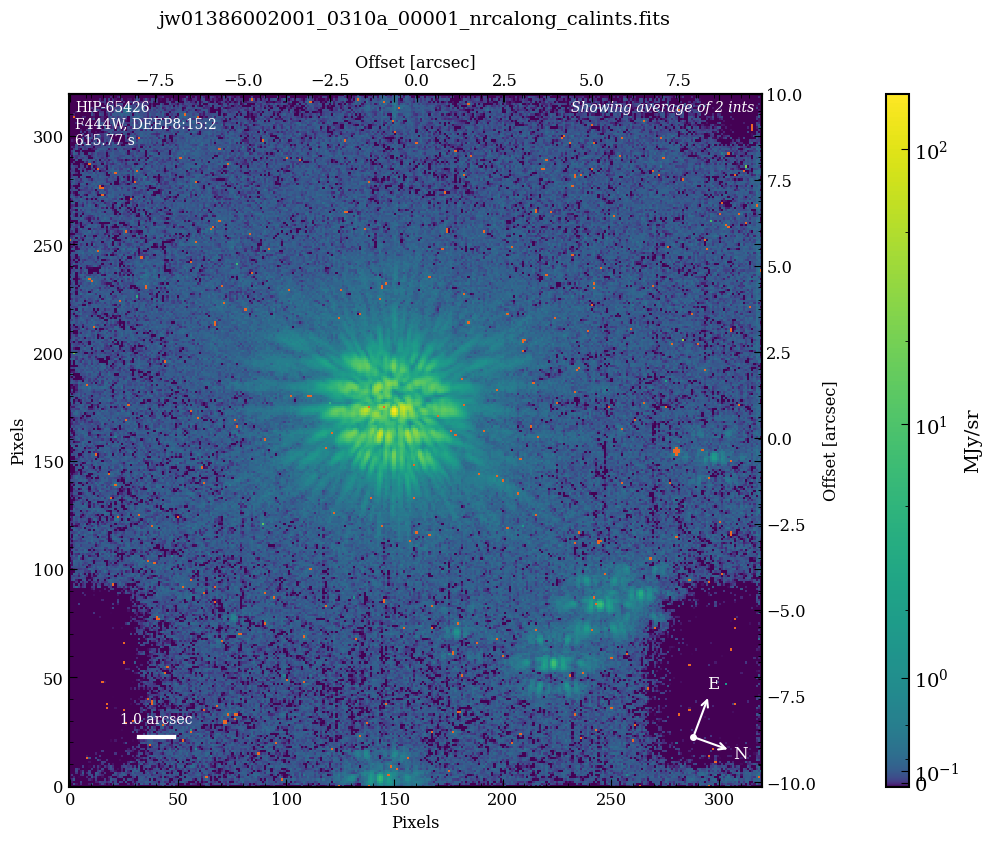

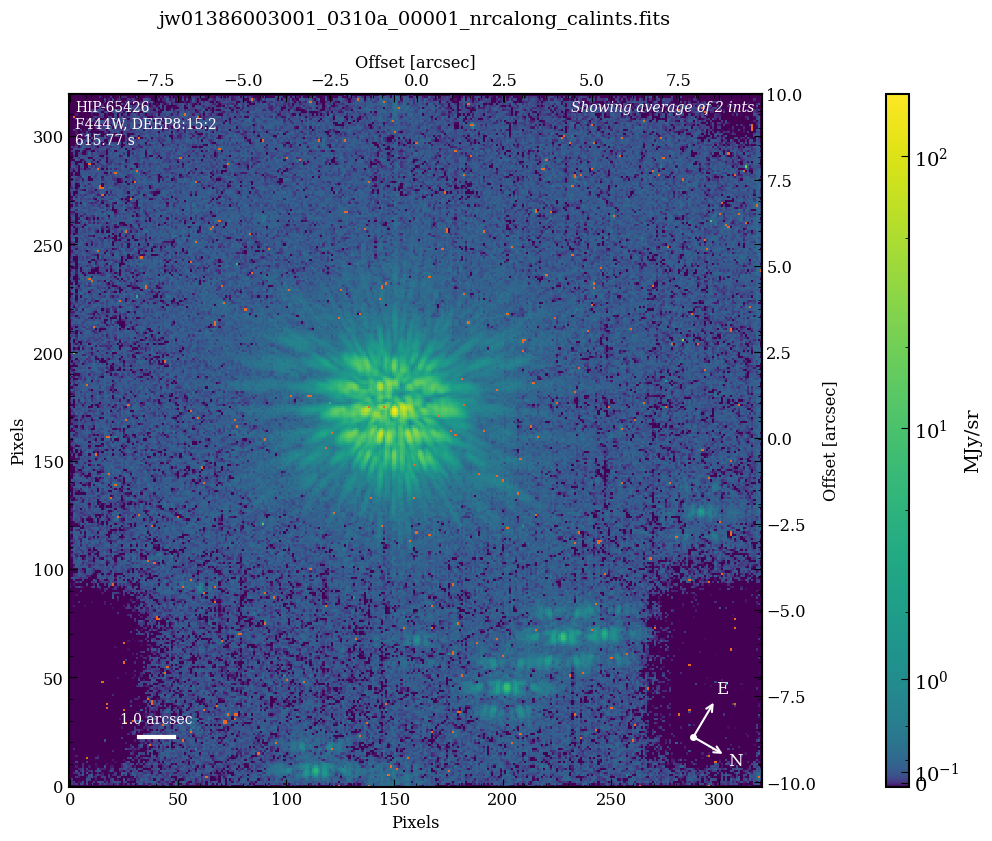

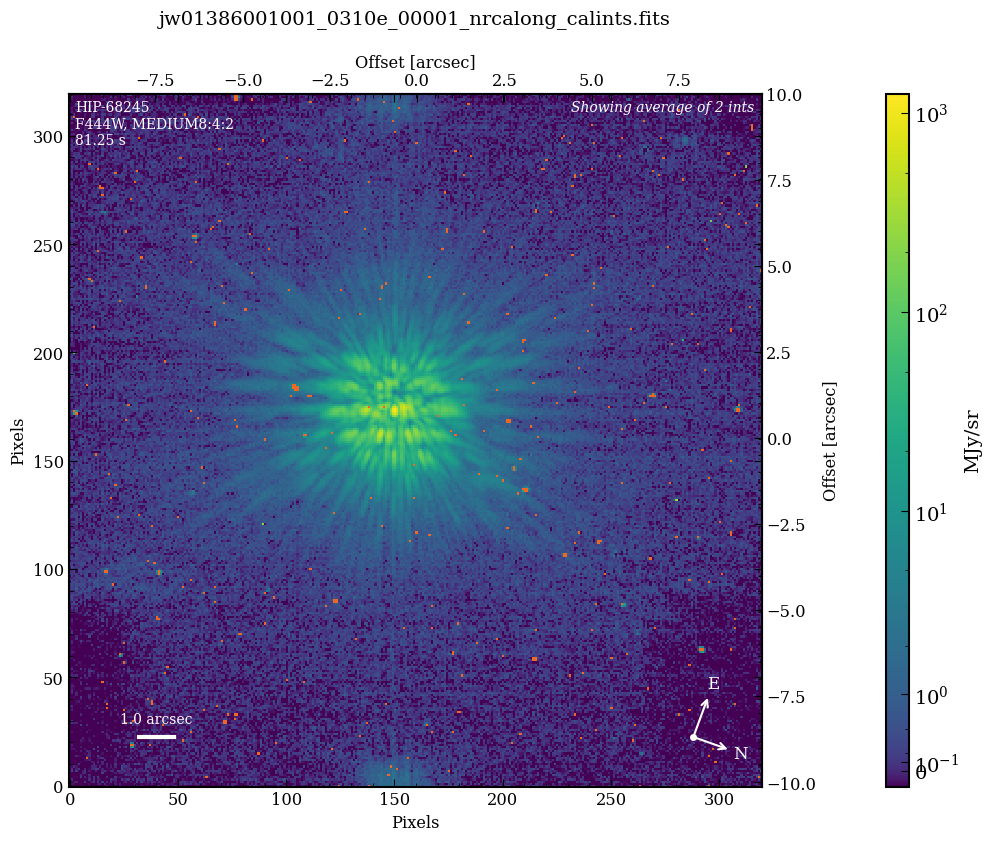

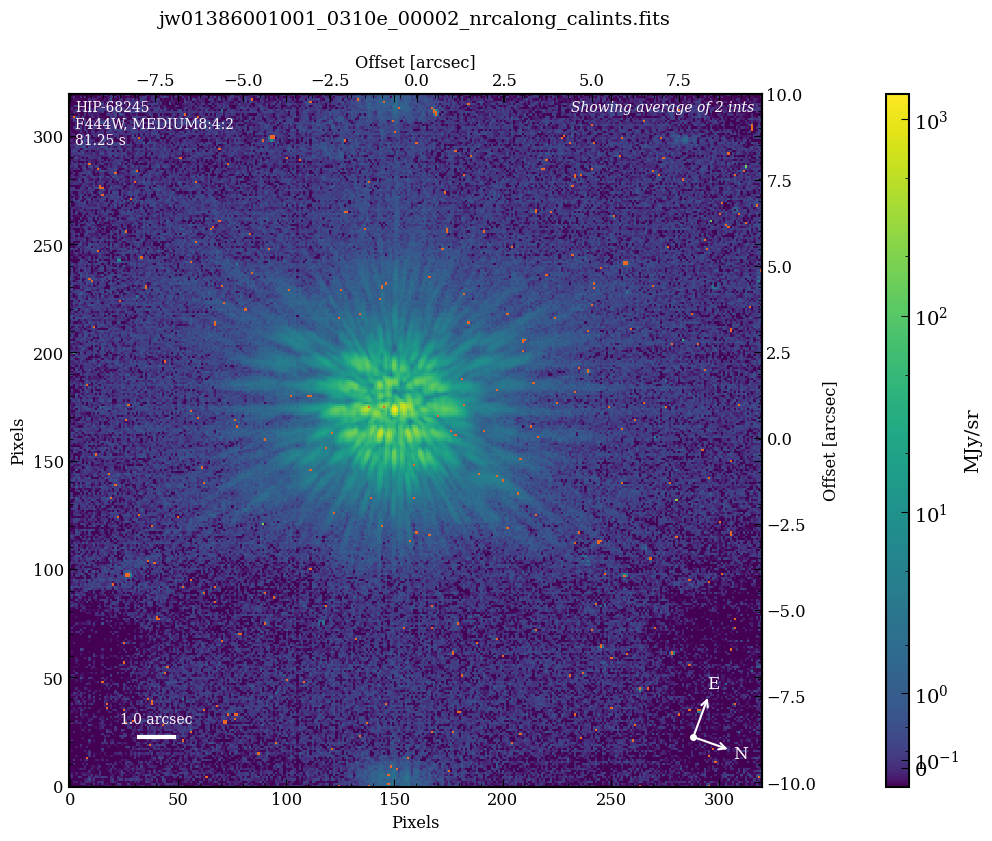

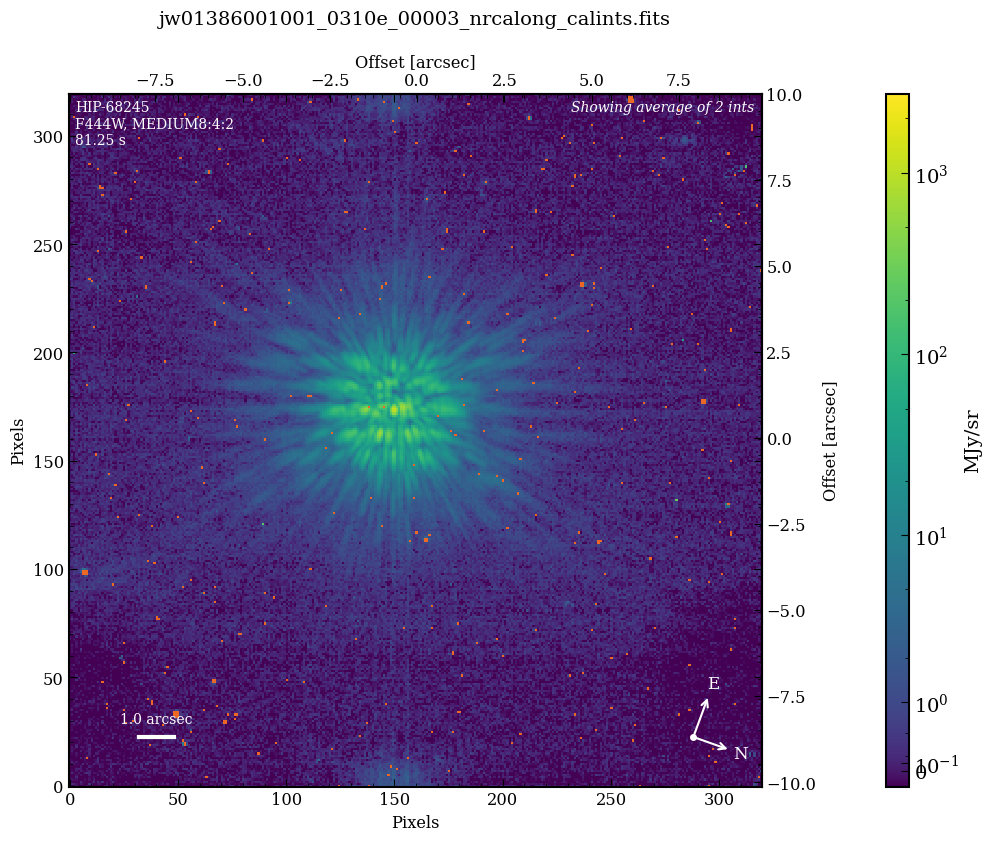

...

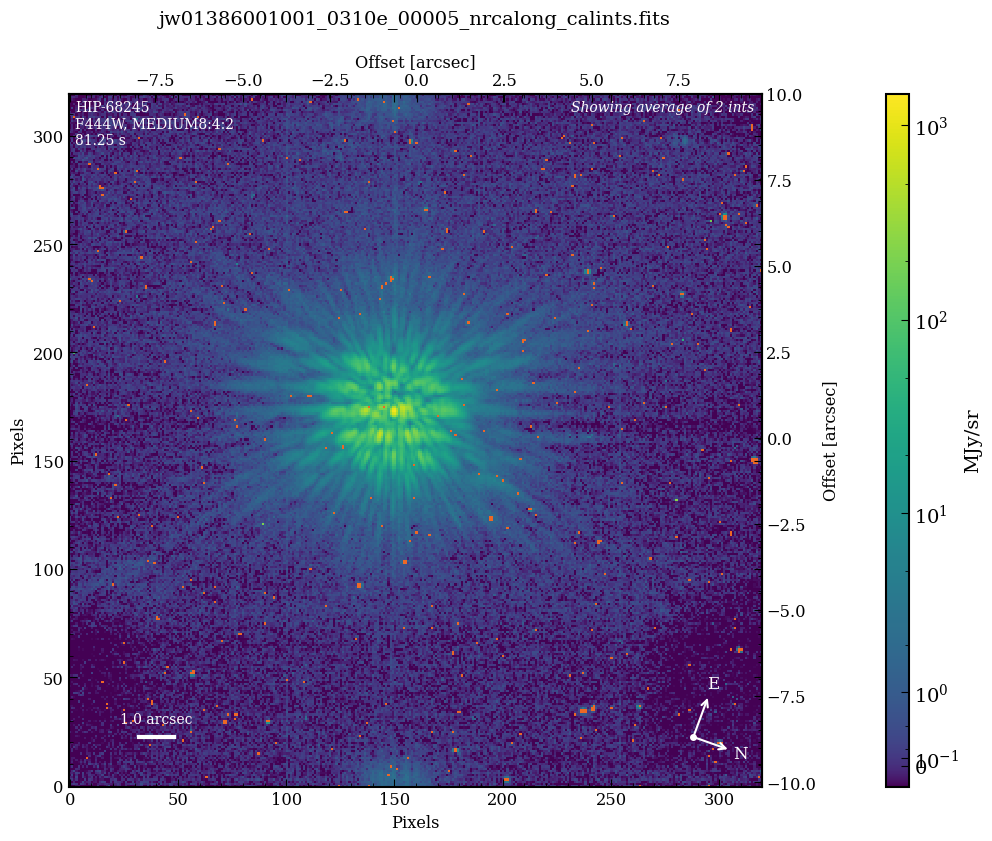

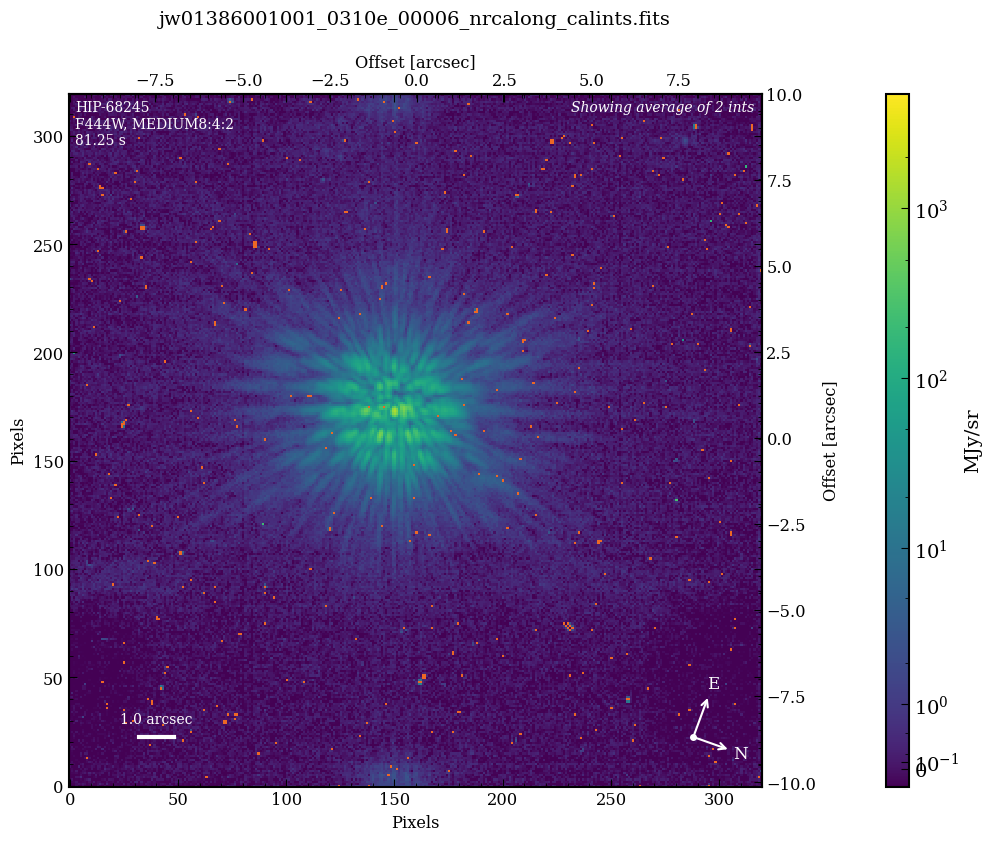

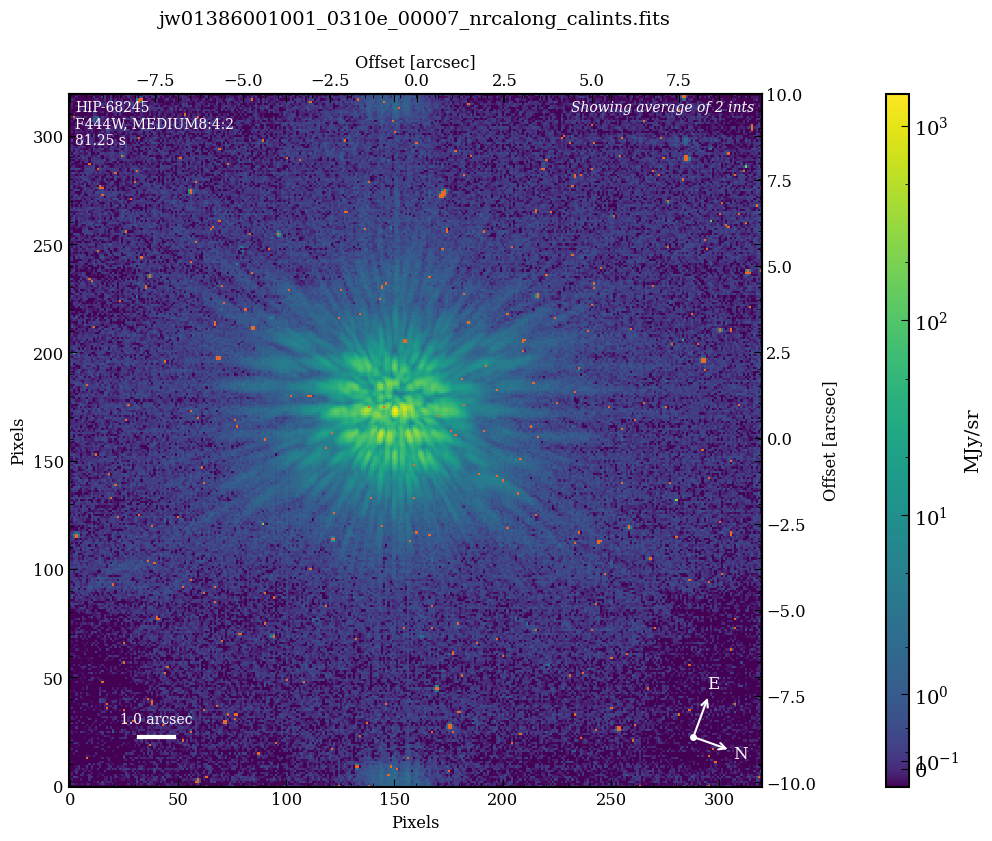

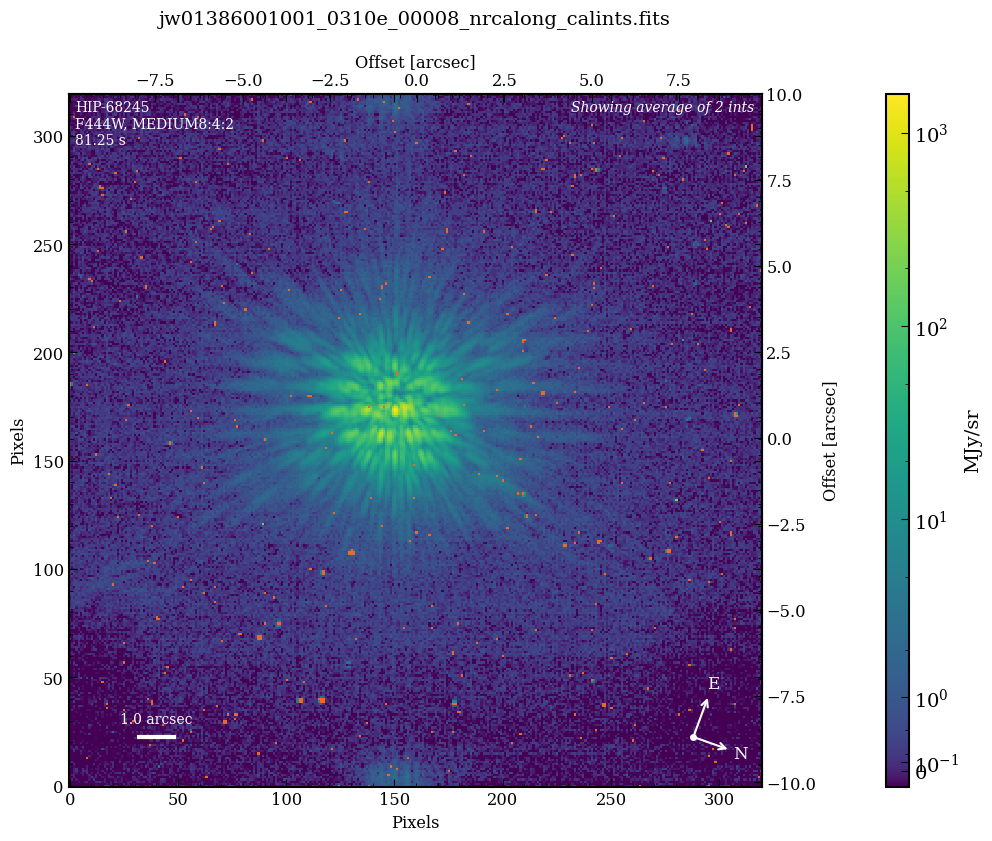

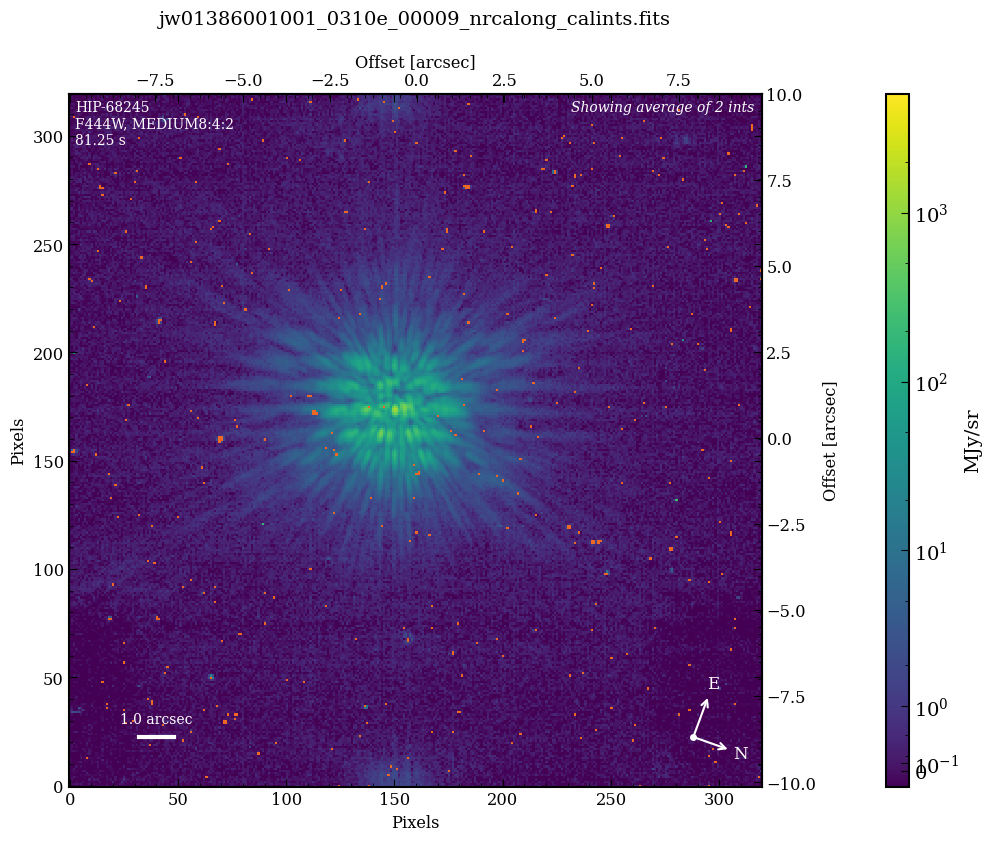

In [28]:
spaceKLIP.plotting.display_coron_dataset(database, 
                                         restrict_to='F444W', save_filename='plots_f444w_stage2.pdf')

# Level 3 reductions

### Preparations for PSF subtraction:

As is often the case in high contrast imaging, getting good PSF subtractions depends sensitively on preparing the data ahead of time. 

Here we take special care about image centering, background subtractions, and bad pixel replacement/interpolation, all prior to the PSF subtraction steps

### Optional: Re-read level 2 outputs into database 
This shows how you can start re-reductions at this point, once you have run the previous steps. 

In [29]:
input_dir = os.path.join(data_root, 'stage2')
    
fitsfiles = sorted(glob.glob(os.path.join(input_dir, "*_calints.fits")))

database = spaceKLIP.database.Database(output_dir=output_dir)
database.read_jwst_s012_data(datapaths=fitsfiles,
                             assoc_using_targname=False)
 

[spaceKLIP.database:INFO] --> Identified 5 concatenation(s)
[spaceKLIP.database:INFO]   --> Concatenation 1: JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER      CWAVEL     ...      EFFINTTM       SUBARRAY  NUMDTHPT XOFFSET YOFFSET      PIXSCALE      BUNIT       ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ --------------- ... ----------------- ----------- -------- ------- ------- ------------------ ------ ------------------ --------
 SCI NRC_CORON   STAGE2     JWST HIP-65426   NIRCAM NRCALONG  F250M 2.5049391569476 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005 MJy/sr  110.2786614838192      nan
 SCI NRC_CORON   STAGE2     JWST HIP-65426   NIRCAM NRCALONG  F250M 2.5049391569476 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005 MJy/sr  120.3590367370958      nan
 REF NRC_CORON   STAGE2     JWST HIP-68245   N

TYPE  EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER      CWAVEL     ...      EFFINTTM       SUBARRAY  NUMDTHPT XOFFSET YOFFSET      PIXSCALE      BUNIT       ROLL_REF      BLURFWHM
---- --------- -------- -------- --------- -------- -------- ------ --------------- ... ----------------- ----------- -------- ------- ------- ------------------ ------ ------------------ --------
 SCI NRC_CORON   STAGE2     JWST HIP-65426   NIRCAM NRCALONG  F444W 4.4393515120525 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005 MJy/sr  110.2786558985023      nan
 SCI NRC_CORON   STAGE2     JWST HIP-65426   NIRCAM NRCALONG  F444W 4.4393515120525 ...         307.88352 SUB320A335R        1     0.0     0.0 62.908505000000005 MJy/sr  120.3590194808035      nan
 REF NRC_CORON   STAGE2     JWST HIP-68245   NIRCAM NRCALONG  F444W 4.4393515120525 ... 40.62352000000001 SUB320A335R        9     0.0     0.0 62.908505000000005 MJy/sr 110.00836165914811      nan
 REF NRC_CORON 

### Extra image processing to improve coronagraphic reductions

In [30]:
# Initialize spaceKLIP image manipulation tools class.
imageTools = spaceKLIP.imagetools.ImageTools(database=database)



<div class="alert alert-block alert-info">
    <b>NIRCam-specific information:</b> The <tt>subtract_median</tt> background subtraction step is only recommended for NIRCam, not MIRI.</div>

In [31]:
# Median-subtract each frame to mitigate uncalibrated bias drifts. Only
# required for NIRCam.
imageTools.subtract_median(types=['SCI', 'SCI_TA', 'SCI_BG', 'REF', 'REF_TA', 'REF_BG'],
                           subdir='medsub')


[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.08
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.09
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.18
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_03106_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.20
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_03106_00003_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean 

[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.17
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_0310a_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.14
[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386002001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.08
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386003001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.09
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_0310e_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Median subtraction: mean of frame median = 0.17
[spaceKLIP.imagetools:INFO]   --> Median subtraction: jw01386001001_0310e_00002

For NIRCam, the JWST pipeline does not sufficiently repair bad pixels (i.e. anomalous outliers) within the coronagraphic subarrays. 

Here we use custom functions within spaceKLIP to detect and repair bad pixels. 


<div class="alert alert-block alert-info">
    <b>NIRCam-specific information:</b> The <tt>fix_bad_pixels</tt> step was developed originally for NIRCam
and is tuned to work pretty well on NIRCam data. </div>

In [32]:
# Fix bad pixels using custom spaceKLIP routines. Multiple routines can be
# combined in a custom order by joining them with a + sign.
# - bpclean: use sigma clipping to find additional bad pixels.
# - custom: use custom map to find additional bad pixels.
# - timemed: replace pixels which are only bad in some frames with their
#            median value from the good frames.
# - dqmed:   replace bad pixels with the median of surrounding good
#            pixels.
# - medfilt: replace bad pixels with an image plane median filter.


imageTools.fix_bad_pixels(method='bpclean+timemed+dqmed+medfilt',
                          bpclean_kwargs={'sigclip': 3,
                                          'shift_x': [-1, 0, 1],
                                          'shift_y': [-1, 0, 1]},
                          custom_kwargs={},
                          timemed_kwargs={},
                          dqmed_kwargs={'shift_x': [-1, 0, 1],
                                        'shift_y': [-1, 0, 1]},
                          medfilt_kwargs={'size': 4},
                          subdir='bpcleaned')

[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386002001_03106_00001_nrcalong_calints.fits
Frame 4/4, iteration 5
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 8712 additional bad pixel(s) -- 2.13%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 8384 bad pixel(s) -- 2.05%


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,



[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 1768 bad pixel(s) -- 0.43%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386003001_03106_00001_nrcalong_calints.fits
Frame 4/4, iteration 5
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 8412 additional bad pixel(s) -- 2.05%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 8038 bad pixel(s) -- 1.96%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 1764 bad pixel(s) -- 0.43%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386003001

[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,



Frame 4/4, iteration 5
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 9060 additional bad pixel(s) -- 2.21%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 8918 bad pixel(s) -- 2.18%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 1620 bad pixel(s) -- 0.40%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386001001_03106_00002_nrcalong_calints.fits
Frame 4/4, iteration 5
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 8948 additional bad pixel(s) -- 2.18%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386001001_03106_00002_nrcalong_calints.fits
[spaceKLIP.imagetools

[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386001001_03108_00001_nrcalong_calints.fits
Frame 4/4, iteration 4
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 8730 additional bad pixel(s) -- 2.13%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386001001_03108_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 8670 bad pixel(s) -- 2.12%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386001001_03108_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 1496 bad pixel(s) -- 0.37%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386001001_03108_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386001001_03108_00002_nrcalong_calints.fits
Frame 4/4, iteration 4
[spaceKLIP.imagetools:INFO]   --> Metho

[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 968 bad pixel(s) -- 0.47%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386003001_03109_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386001001_0310c_00001_nrcalong_calints.fits
Frame 2/2, iteration 5
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 4008 additional bad pixel(s) -- 1.96%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386001001_0310c_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 3768 bad pixel(s) -- 1.84%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386001001_0310c_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 1038 bad pixel(s) -- 0.51%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386001001_0310c_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad

[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 3648 bad pixel(s) -- 1.78%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386003001_03108_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 966 bad pixel(s) -- 0.47%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386003001_03108_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386001001_0310a_00001_nrcalong_calints.fits
Frame 2/2, iteration 6
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 4304 additional bad pixel(s) -- 2.10%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386001001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 4070 bad pixel(s) -- 1.99%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386001001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 1010 ba

Frame 2/2, iteration 4
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 5047 additional bad pixel(s) -- 2.46%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386003001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method timemed: fixing 4102 bad pixel(s) -- 2.00%
[spaceKLIP.imagetools:INFO]   --> Method dqmed: jw01386003001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method dqmed: fixing 1620 bad pixel(s) -- 0.79%
[spaceKLIP.imagetools:INFO]   --> Method medfilt: jw01386003001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Method medfilt: fixing 0 bad pixel(s) -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Method bpclean: jw01386001001_0310e_00001_nrcalong_calints.fits
Frame 2/2, iteration 5
[spaceKLIP.imagetools:INFO]   --> Method bpclean: identified 3975 additional bad pixel(s) -- 1.94%
[spaceKLIP.imagetools:INFO]   --> Method timemed: jw01386001001_0310e_00001_nrcalong_calints.fits
[spaceKLIP.imagetools

### Finish pixel cleanup

In [33]:
# Replace nans.
imageTools.replace_nans(cval=0.,
                        types=['SCI', 'SCI_BG', 'REF', 'REF_BG'],
                        subdir='nanreplaced')


[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_03106_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_03106_00003_nrcalong_calints.fits
[space

[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_0310a_00006_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_0310a_00007_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_0310a_00008_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO]   --> Nan replacement: jw01386001001_0310a_00009_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Nan replacement: replaced 0 nan pixel(s) with value 0.0 -- 0.00%
[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASKA335R_SUB320A335R
[space

### Align Frames

In [35]:
#Align Frames Use image registration to align all frames in a concatenation to the
# first science frame in that concatenation.
imageTools.align_frames(method='fourier',
                        kwargs={},
                        subdir='aligned')

[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 0.19 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 3.10 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 10.69 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_03106_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 30.72 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_03106_00003_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 21.07 mas
[spaceKLI

[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386002001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 0.10 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386003001_0310a_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 12.41 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_0310e_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 17.96 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_0310e_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 39.86 mas
[spaceKLIP.imagetools:INFO]   --> Align frames: jw01386001001_0310e_00003_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Align frames: median required shift = 31.73 mas
[spaceKL

In [36]:
# Pad all frames.
imageTools.pad_frames(npix=160,
                      cval=np.nan,
                      types=['SCI', 'SCI_BG', 'REF', 'REF_BG'],
                      subdir='padded')


[spaceKLIP.imagetools:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386002001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (640, 640), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386003001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (640, 640), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_03106_00001_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (640, 640), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_03106_00002_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (640, 640), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01

[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_0310a_00003_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (640, 640), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_0310a_00004_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (640, 640), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_0310a_00005_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (640, 640), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_0310a_00006_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape = (320, 320), new shape = (640, 640), fill value = nan
[spaceKLIP.imagetools:INFO]   --> Frame padding: jw01386001001_0310a_00007_nrcalong_calints.fits
[spaceKLIP.imagetools:INFO]   --> Frame padding: old shape 

### Display the cleaned datasets after all of the above

[py.warnings:WARNING] /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP_new/spaceKLIP/plotting.py:193: RuntimeWarning: Mean of empty slice
  image = np.nanmean(model.data, axis=0)

[astroquery:WARNING] Input data contains invalid values (NaNs or infs), which were automatically clipped.
[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/astropy/wcs/wcsapi/fitswcs.py:347: UserWarning: 'WCS.all_world2pix' failed to converge to the requested accuracy.
After 20 iterations, the solution is diverging at least for one input point.
  warnings.warn(str(e))

[py.warnings:WARNING] /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP_new/spaceKLIP/plotting.py:193: RuntimeWarning: Mean of empty slice
  image = np.nanmean(model.data, axis=0)

[astroquery:WARNING] Input data contains invalid values (NaNs or infs), which were automatically clipped.
[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023

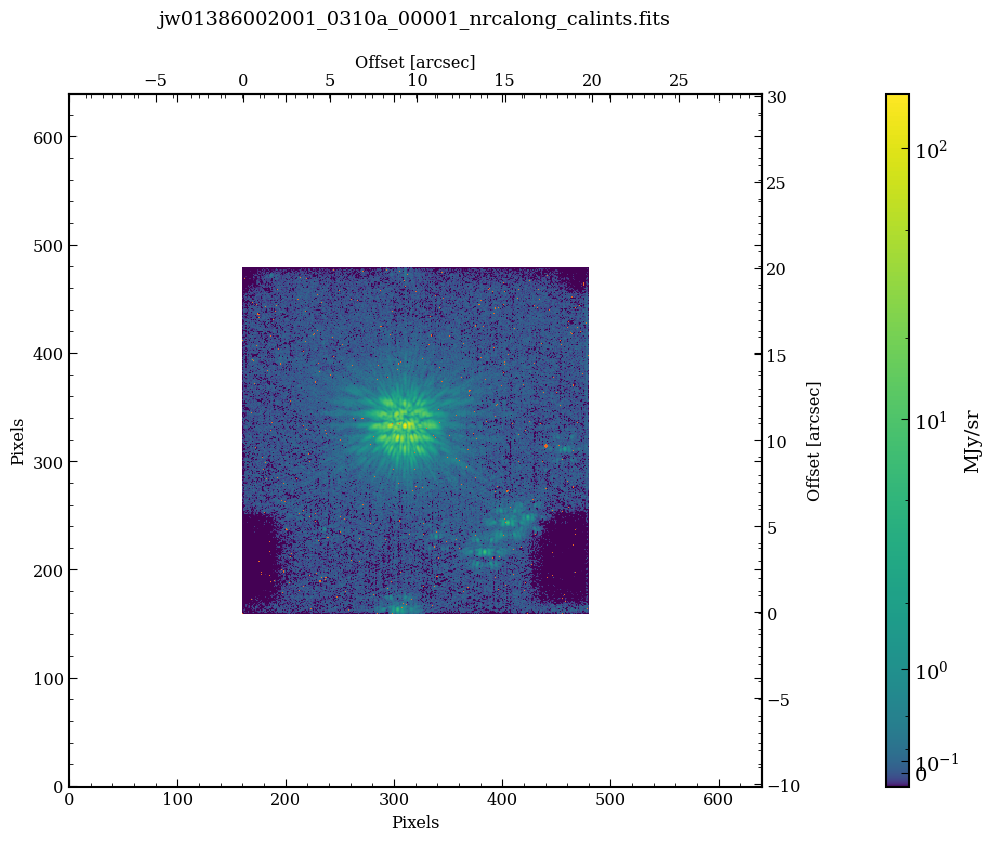

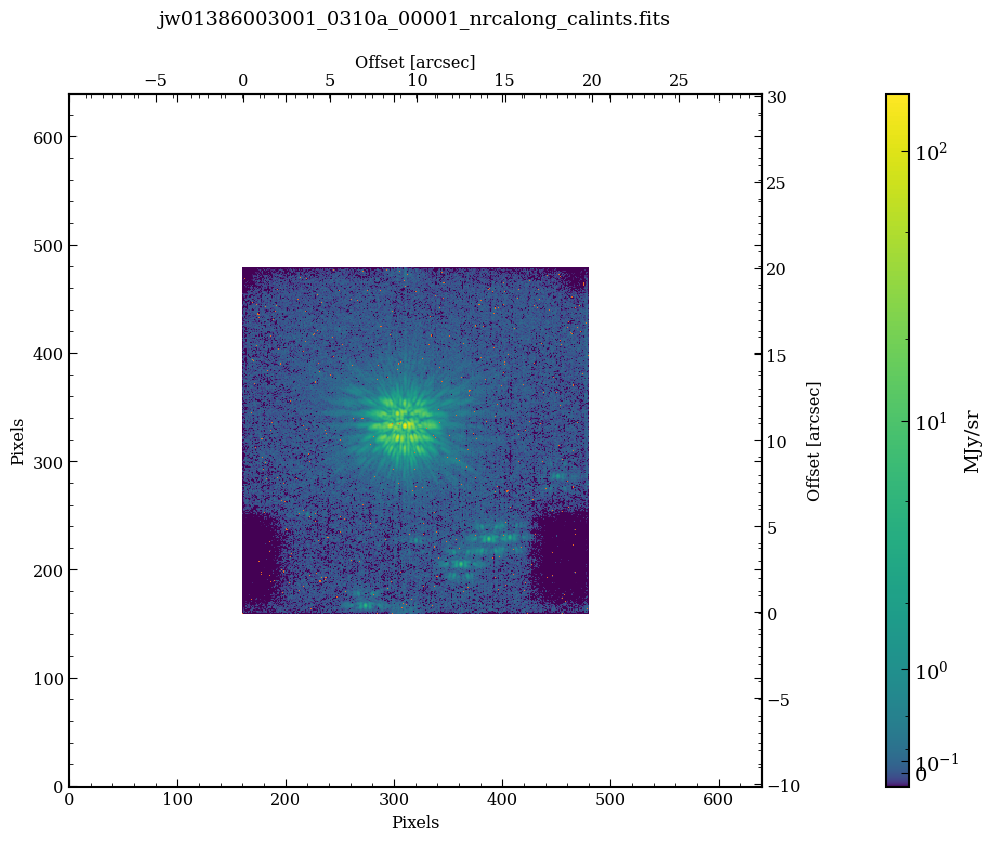

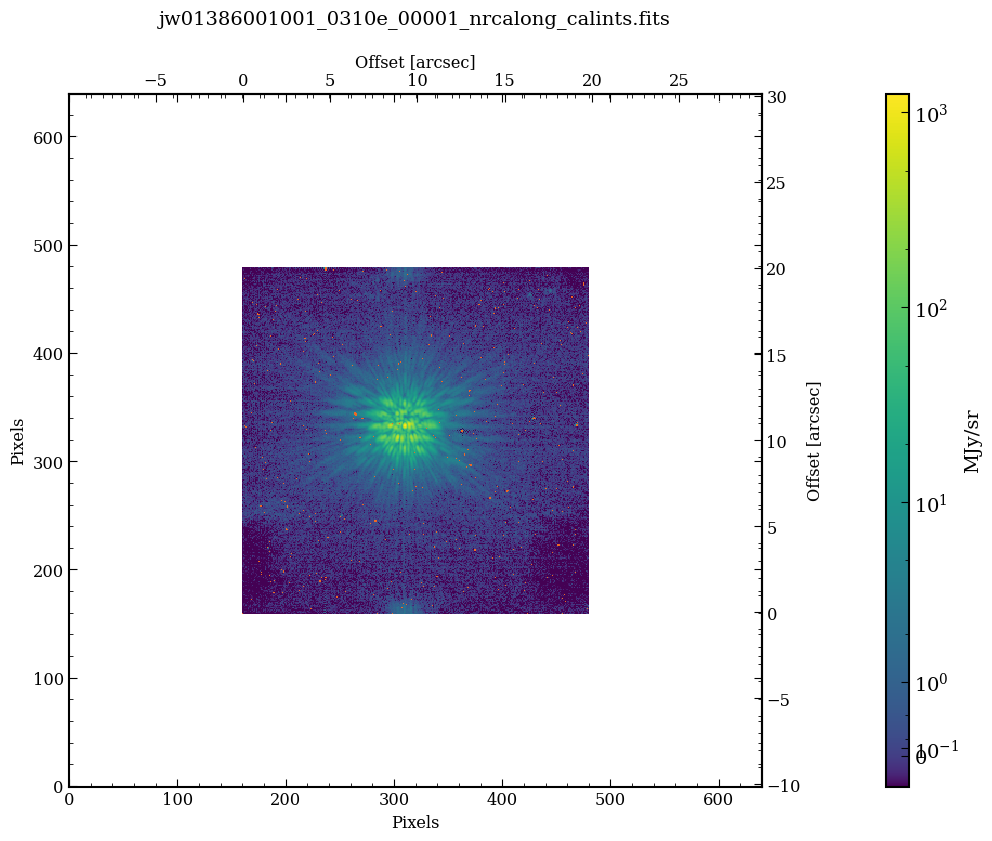

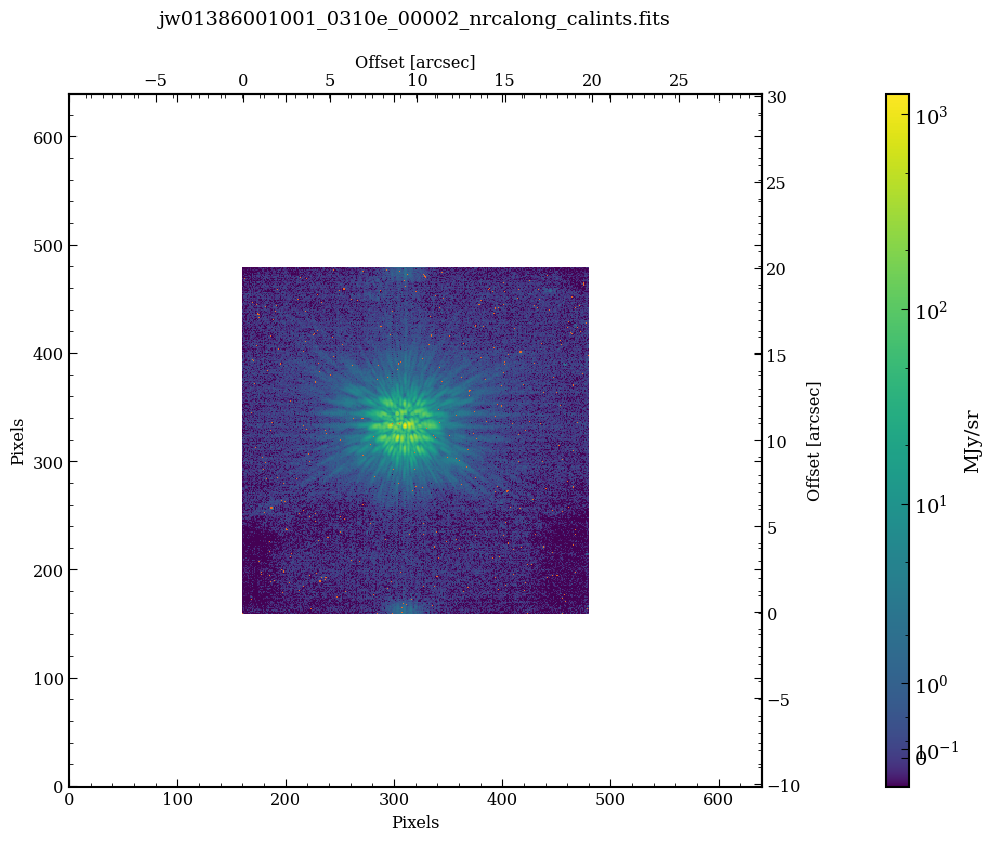

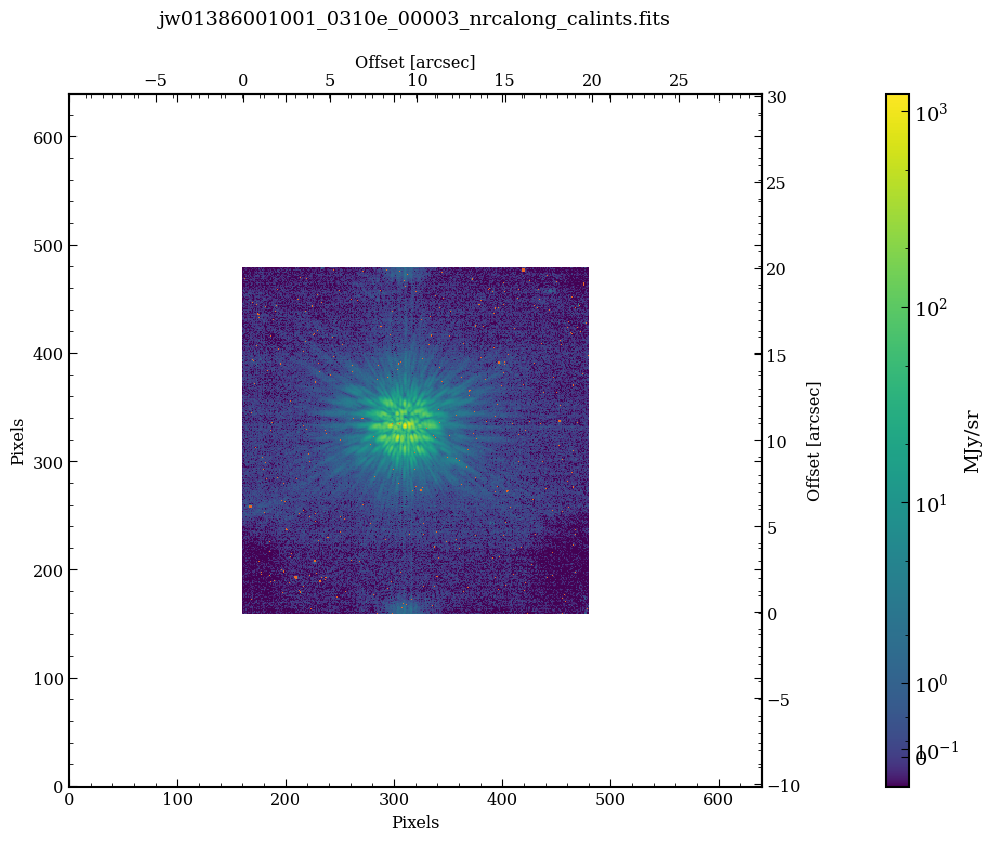

...

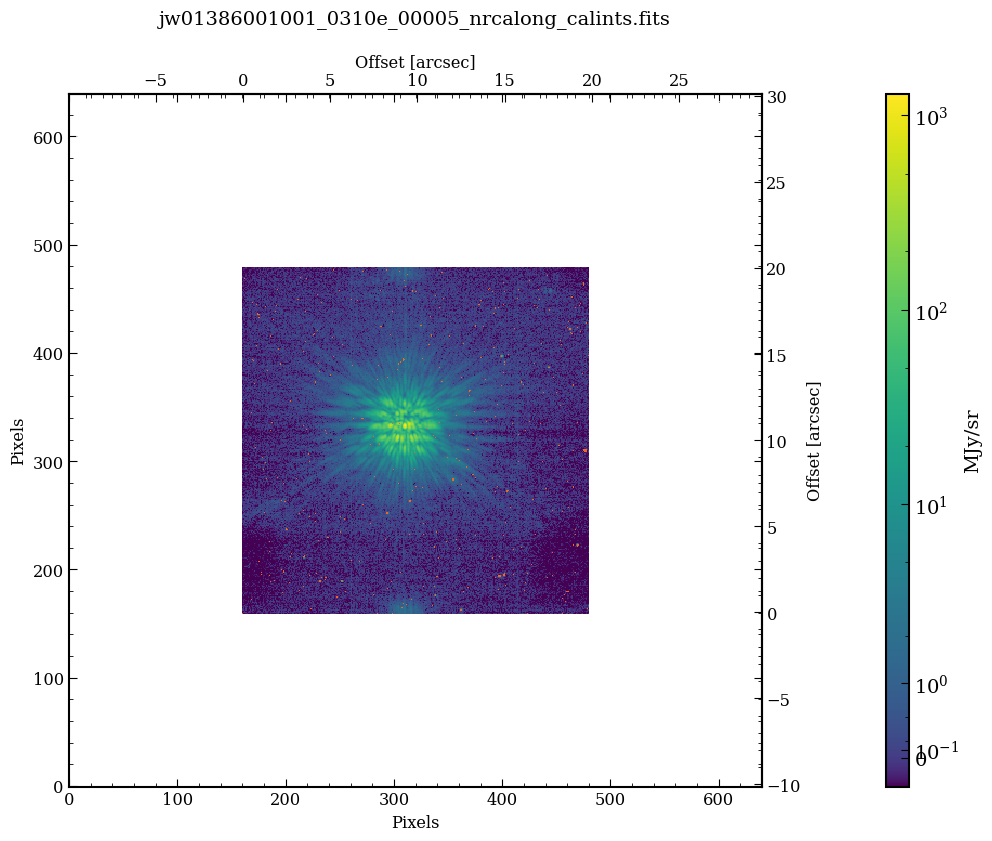

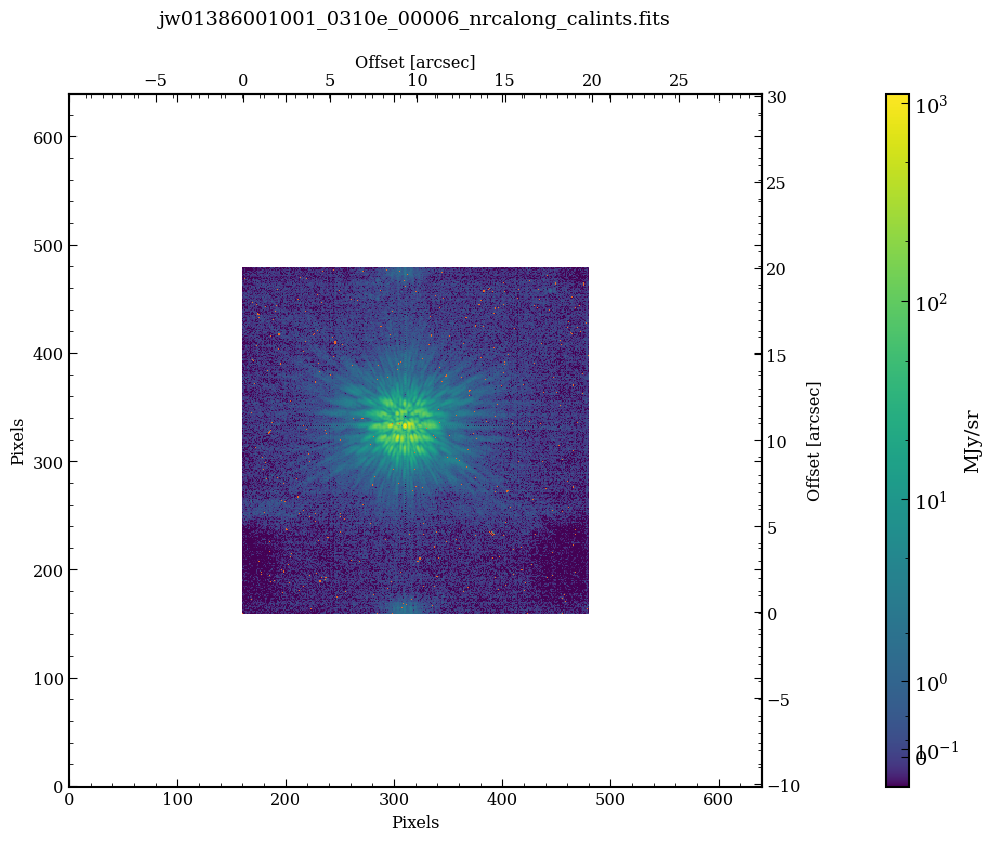

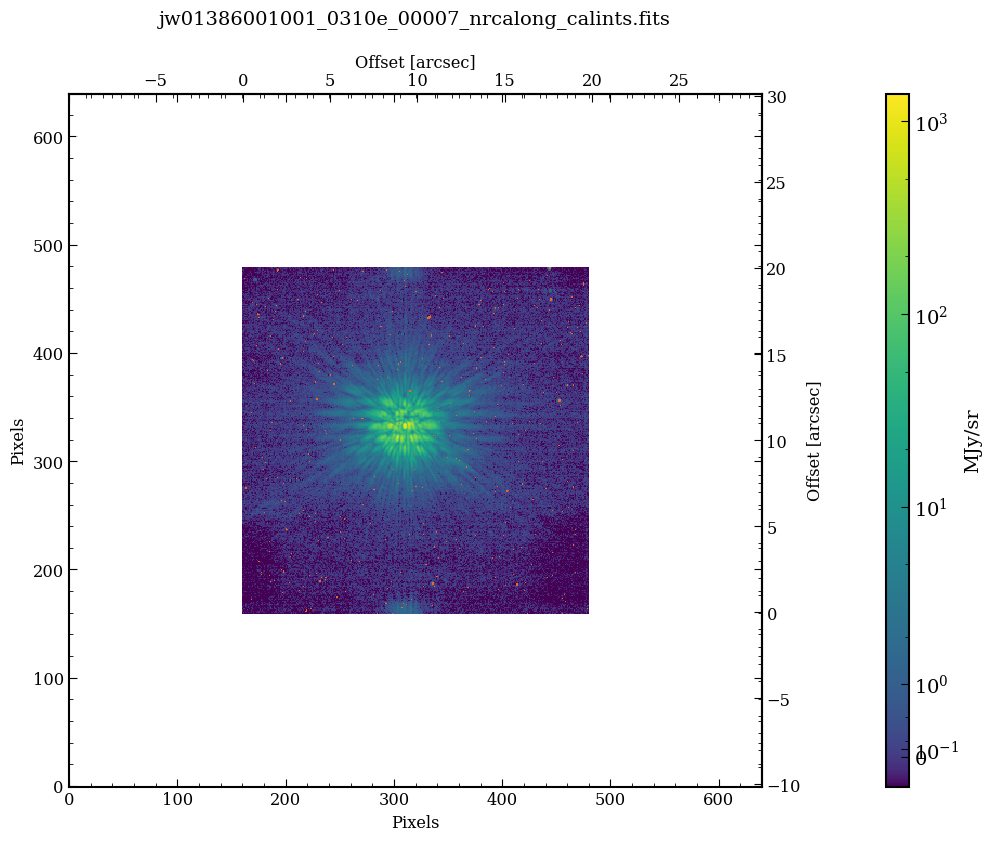

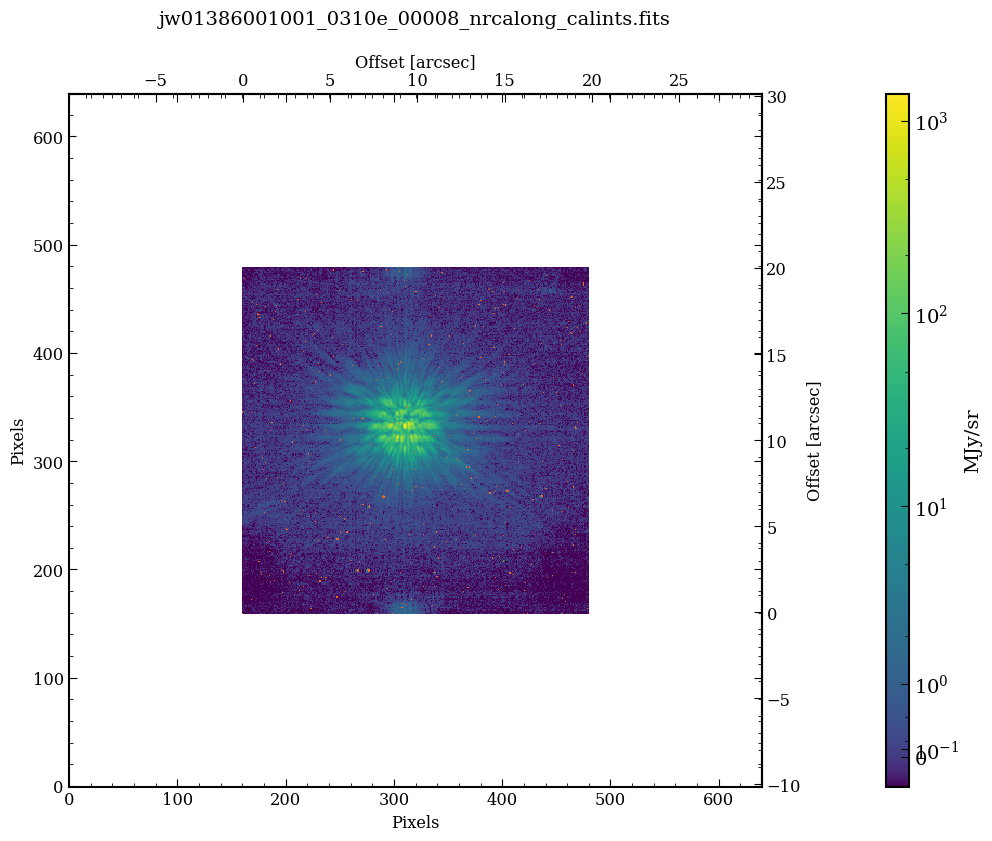

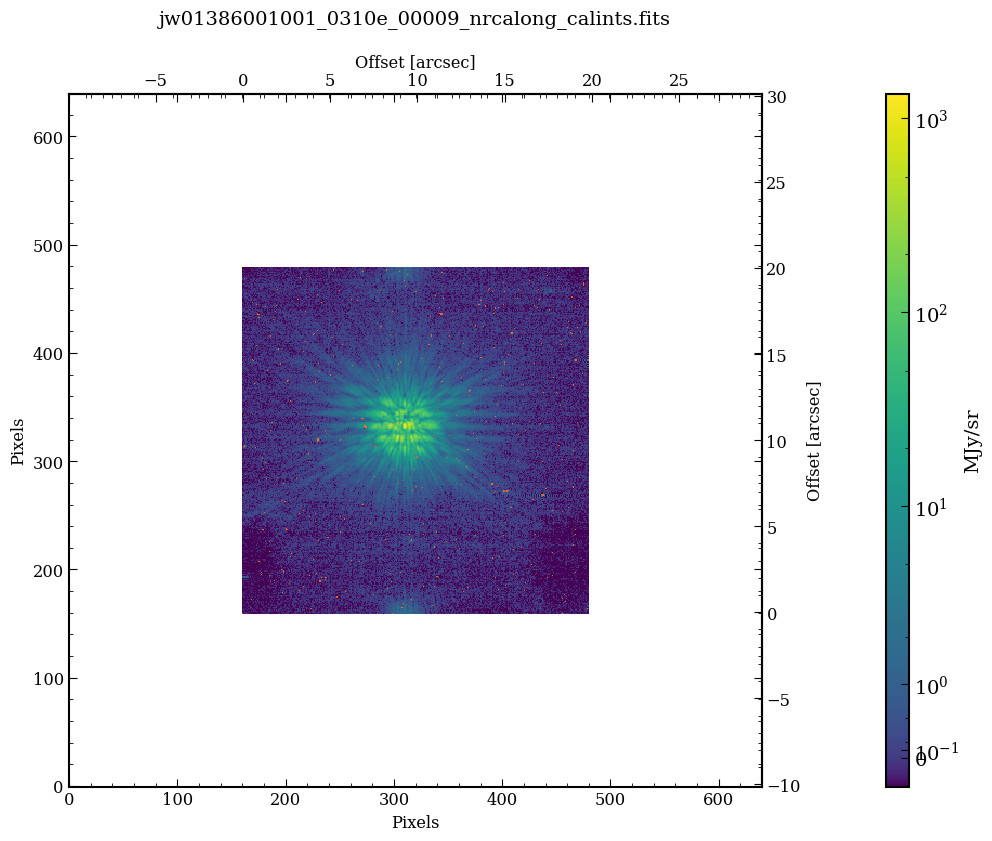

In [37]:
spaceKLIP.plotting.display_coron_dataset(database, 
                                         restrict_to='F444W', save_filename='plots_f444w_stage2_cleaned.pdf')

## PSF Subtraction: option using KLIP

SpaceKLIP supports multiple algorithms for PSF subtraction, including pyKLIP (recommended) as well as the 
 jwst pipeline Coron3Pipeline. Here we use a pyKLIP subtraction. 

In [38]:
# Run pyKLIP pipeline. Additional parameters for klip_dataset function can
# be passed using kwargs parameter.
spaceKLIP.pyklippipeline.run_obs(database=database,
                       kwargs={'mode': ['ADI', 'RDI', 'ADI+RDI'],
                               'annuli': [1, 5],
                               'subsections': [1],
                               'numbasis': [1, 2, 5, 10, 20, 50],
                               'algo': 'klip',
                               'save_rolls': True},
                       subdir='klipsub')


[spaceKLIP.pyklippipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R


Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.395270 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'.
Set OBSGEO-B to   -35.194064 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706240147.863 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.372585 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.194064 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706240147.863 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T01:54:23.183' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'.
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.395270 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T01:54:23.183' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'.
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.395270 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T01:54:23.183' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'.
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.395270 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T01:54:23.183' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'.
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.395270 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T01:54:23.183' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'.
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.395270 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.505e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T01:54:23.183' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:04:41.088' from MJD-AVG.
Set DATE-END to '2022-07-30T02:14:58.993' from MJD-END'.
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.395270 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.218416 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706457085.839 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F300M_MASKRND_MASKA335R_SUB320A335R


Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.390994 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'.
Set OBSGEO-B to   -35.189422 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706198895.066 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.368257 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.189422 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706198895.066 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:17:11.949' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'.
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.390994 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:17:11.949' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'.
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.390994 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:17:11.949' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'.
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.390994 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:17:11.949' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'.
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.390994 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:17:11.949' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'.
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.390994 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 2.994e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 8, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:17:11.949' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:27:29.854' from MJD-AVG.
Set DATE-END to '2022-07-30T02:37:47.759' from MJD-END'.
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.390994 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.213823 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706416105.011 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F356W_MASKRND_MASKA335R_SUB320A335R


Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.385314 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'.
Set OBSGEO-B to   -35.183312 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706144631.810 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.362558 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.183312 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706144631.810 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...


Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:52:36.861' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'.
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.385314 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'.


Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:52:36.861' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'.
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.385314 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...


Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:52:36.861' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'.
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.385314 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'.


Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:52:36.861' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'.
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.385314 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...


Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:52:36.861' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'.
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.385314 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'.


Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 3.593e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...


Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:52:36.861' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:57:45.813' from MJD-AVG.
Set DATE-END to '2022-07-30T03:02:54.766' from MJD-END'.
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.385314 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.207724 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706361731.693 from OBSGEO-[XYZ]'.


Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)
[spaceKLIP.pyklippipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F410M_MASKRND_MASKA335R_SUB320A335R


Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.387673 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'.
Set OBSGEO-B to   -35.185849 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706167152.529 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.364924 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.185849 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706167152.529 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...


Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:40:02.814' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'.
Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.387673 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'.


Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...


Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:40:02.814' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'.


Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)


Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.387673 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...


Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:40:02.814' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'.
Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.387673 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'.


Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...


Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:40:02.814' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'.


Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)


Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.387673 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...


Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:40:02.814' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'.
Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.387673 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'.


Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.089e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)


Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T02:40:02.814' from MJD-BEG.
Set DATE-AVG to '2022-07-30T02:45:11.766' from MJD-AVG.
Set DATE-END to '2022-07-30T02:50:20.719' from MJD-END'.
Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.387673 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.210257 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706384309.811 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F444W_MASKRND_MASKA335R_SUB320A335R


Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.382959 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'.
Set OBSGEO-B to   -35.180767 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706122045.054 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.360184 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.180767 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706122045.054 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...


Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T03:05:08.796' from MJD-BEG.
Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'.
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.382959 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'.


Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)


Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T03:05:08.796' from MJD-BEG.
Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'.
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.382959 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)


Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T03:05:08.796' from MJD-BEG.
Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'.
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.382959 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)


Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T03:05:08.796' from MJD-BEG.
Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'.
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.382959 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'.


[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 1, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 1


  0%|          | 0/1 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...


Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T03:05:08.796' from MJD-BEG.
Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'.
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.382959 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'.


Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)
[spaceKLIP.pyklippipeline:INFO]   --> pyKLIP: mode = ADI+RDI, annuli = 5, subsections = 1
Begin align and scale images for each wavelength


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/ipykernel/comm/comm.py:79: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  warn(



Wavelength 4.439e-06 with index 0 has finished align and scale. Queuing for KLIP
Total number of tasks for KLIP processing is 5


  0%|          | 0/5 [00:00<?, ?it/s]

Closing threadpool
Derotating Images...
Writing Images to directory /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP/notebooks/data_nircam_hd65426/klipsub
wavelength collapsing reduced data of shape (b, N, wv, y, x):(6, 4, 1, 640, 640)


Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-07-30T03:05:08.796' from MJD-BEG.
Set DATE-AVG to '2022-07-30T03:10:17.748' from MJD-AVG.
Set DATE-END to '2022-07-30T03:15:26.701' from MJD-END'.
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
[astroquery:WARNING] FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -67.382959 from OBSGEO-[XYZ].
Set OBSGEO-B to   -35.205196 from OBSGEO-[XYZ].
Set OBSGEO-H to 1706339216.087 from OBSGEO-[XYZ]'.


[spaceKLIP.database:INFO] --> Identified 5 concatenation(s)
[spaceKLIP.database:INFO]   --> Concatenation 1: JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
 TYPE   EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER      CWAVEL          DWAVEL      ...  EFFINTTM   SUBARRAY       PIXSCALE        MODE  ANNULI SUBSECTS    KLMODES     BUNIT  BLURFWHM
------ --------- -------- -------- --------- -------- -------- ------ --------------- ---------------- ... --------- ----------- ------------------ ------- ------ -------- -------------- ------ --------
PYKLIP NRC_CORON   STAGE3     JWST HIP-65426   NIRCAM NRCALONG  F250M 2.5049391569476 0.17829583911921 ... 307.88352 SUB320A335R 62.908505000000005     ADI      1        1 1,2,5,10,20,50 MJy/sr      nan
PYKLIP NRC_CORON   STAGE3     JWST HIP-65426   NIRCAM NRCALONG  F250M 2.5049391569476 0.17829583911921 ... 307.88352 SUB320A335R 62.908505000000005     ADI      5        1 1,2,5,10,20,50 MJy/sr      nan
PYKLIP NRC_CORON   STA

In [41]:
database.summarize()

NIRCAM_F250M_MASKA335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F300M_MASKA335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F356W_MASKA335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F410M_MASKA335R
	STAGE2: 11 files;	2 SCI, 9 REF
NIRCAM_F444W_MASKA335R
	STAGE2: 11 files;	2 SCI, 9 REF


### Optional: Re-read level 3 outputs into database 
This shows how you can start re-analyses at this point, once you have run the previous steps. 

In [40]:
input_dir = os.path.join(data_root, 'klipsub')
    
fitsfiles = sorted(glob.glob(os.path.join(input_dir, "*KLmodes-all.fits")))

database = spaceKLIP.database.Database(output_dir=output_dir)
database.read_jwst_s3_data(fitsfiles)

[spaceKLIP.database:INFO] --> Identified 5 concatenation(s)
[spaceKLIP.database:INFO]   --> Concatenation 1: JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R
 TYPE   EXP_TYPE DATAMODL TELESCOP  TARGPROP INSTRUME DETECTOR FILTER      CWAVEL          DWAVEL      ...  EFFINTTM   SUBARRAY       PIXSCALE        MODE  ANNULI SUBSECTS    KLMODES     BUNIT  BLURFWHM
------ --------- -------- -------- --------- -------- -------- ------ --------------- ---------------- ... --------- ----------- ------------------ ------- ------ -------- -------------- ------ --------
PYKLIP NRC_CORON   STAGE3     JWST HIP-65426   NIRCAM NRCALONG  F250M 2.5049391569476 0.17829583911921 ... 307.88352 SUB320A335R 62.908505000000005 ADI+RDI      1        1 1,2,5,10,20,50 MJy/sr      nan
PYKLIP NRC_CORON   STAGE3     JWST HIP-65426   NIRCAM NRCALONG  F250M 2.5049391569476 0.17829583911921 ... 307.88352 SUB320A335R 62.908505000000005 ADI+RDI      5        1 1,2,5,10,20,50 MJy/sr      nan
PYKLIP NRC_CORON   STA

UnboundLocalError: cannot access local variable 'cube' where it is not associated with a value

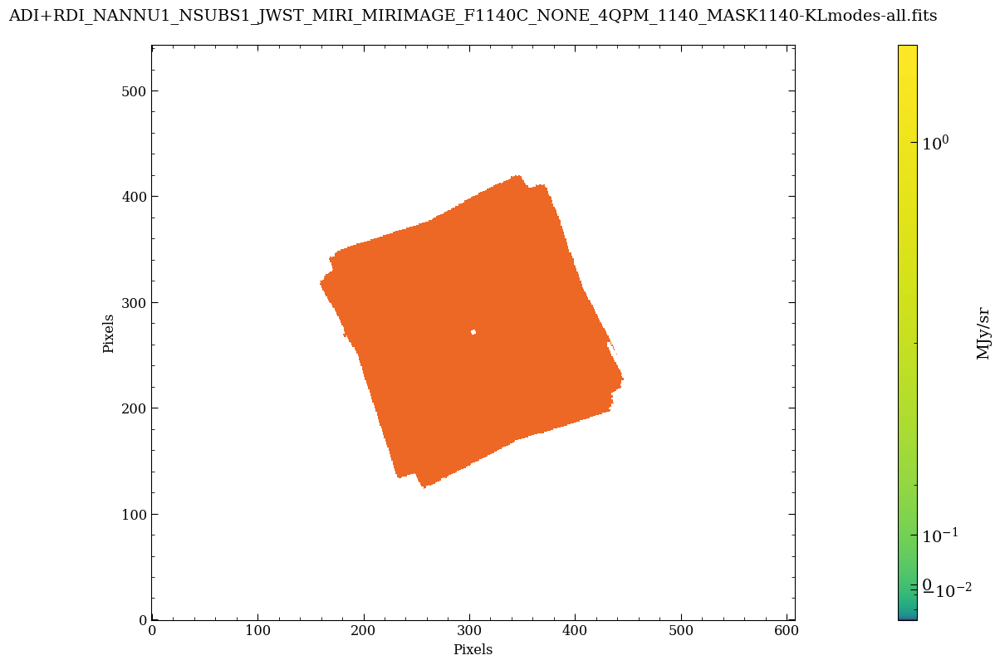

In [8]:
spaceKLIP.plotting.display_coron_dataset(database, 
                                         restrict_to='F444W', save_filename='plots_f444w_pyklip.pdf')

In [1]:
%pdb

Automatic pdb calling has been turned ON


In [11]:
database.red.keys()

dict_keys(['JWST_MIRI_MIRIMAGE_F1140C_NONE_4QPM_1140_MASK1140', 'JWST_MIRI_MIRIMAGE_F1550C_NONE_4QPM_1550_MASK1550'])

## PSF Subtraction: option using classical PSF subtraction

In some cases, simple classical PSF subtraction is a robust and effective approach. 

We also demonstrate here the ``save_rolls`` parameter, which causes the PSF-subtracted versions of each individual science roll to also be saved, in addition to the roll-combined final product. 

In [42]:
spaceKLIP.classpsfsubpipeline.run_obs(database, 
                                      subdir='classical',
                                      kwargs = {'save_rolls': True})

[spaceKLIP.classpsfsubpipeline:INFO] --> Concatenation JWST_NIRCAM_NRCALONG_F250M_MASKRND_MASKA335R_SUB320A335R


[py.warnings:WARNING] /Users/mperrin/miniconda3/envs/stenv-py3.10-2023.04.05/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,



AttributeError: 'NoneType' object has no attribute 'shape'

> /Users/mperrin/Dropbox (Personal)/Documents/software/git/spaceKLIP_new/spaceKLIP/classpsfsubpipeline.py(226)run_obs()
    224                     mask = xx
    225                 center = [database.obs[key]['CRPIX1'][j] - 1., database.obs[key]['CRPIX2'][j] - 1.]  # pix (0-indexed)
--> 226                 new_center = [mask.shape[1] // 2, mask.shape[0] // 2]  # pix (0-indexed)
    227                 mask_temp = nanrotate(mask.copy(), database.obs[key]['ROLL_REF'][j], center=center, new_center=new_center)
    228 

ipdb> quit
